In [1]:
import copy
from seaborn.utils import os, np, plt, pd
import seaborn as sns
import sweetviz as sv
import plotly.express as px
import plotly.graph_objects as go

In [2]:
pd.set_option('display.max_columns', 500,
             'display.precision', 2)

In [3]:
sns.set_style('darkgrid')

In [4]:
from project_methods import MSc_Proj as proj

In [5]:
# file_loc = proj.show_saved_csv()
# display(file_loc)

In [6]:
data_dir = os.getcwd() #'clean_pds//' #[str(k) for k, v in file_loc.items()][0]
display(data_dir)

'W:\\MSc-AIDS-UoH\\Trimester_3\\Submit'

In [7]:
fname = '\\enr_part_prof.csv'
main_df = pd.read_csv(data_dir+fname)
display(main_df.info(), main_df)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 55026 entries, 0 to 55025
Data columns (total 47 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   subjid                       55026 non-null  object 
 1   ccdep                        55026 non-null  int64  
 2   ccdepage                     55026 non-null  float64
 3   cccog                        55026 non-null  int64  
 4   cccogage                     55026 non-null  float64
 5   ccapt                        55026 non-null  int64  
 6   ccaptage                     55026 non-null  float64
 7   ccmtr                        55026 non-null  int64  
 8   ccmtrage                     55026 non-null  float64
 9   weight                       55026 non-null  float64
 10  height                       55026 non-null  float64
 11  bmi                          55026 non-null  float64
 12  seq                          55026 non-null  int64  
 13  visdy           

None

,subjid,ccdep,ccdepage,cccog,cccogage,ccapt,ccaptage,ccmtr,ccmtrage,weight,height,bmi,seq,visdy,age,chorea_score,motscore,miscore,indepscl,fiscore,fascore,tfcscore,feedself,study_timeyr,bmi_level,bmi_outcome,bmi_diff,bmi_change,bmi_diff_class,bmi_diff_band,age_bucket,baseline_age_above29,independent_feeding,behaviour_score,cognitive_score,visitnum,hd_status,hd_status0,baseline_manifest_hd,is_high_calorie,treated_chorea,tetrabenazine_use,received_swallowing_therapy,had_gi_illness,is_male,caglow_num,caghigh_num
0,R000024542,0,0.0,0,0.0,0,0.0,1,42.0,67.9,185.4,19.8,1,0,48,11,28,28,95,24,24,11,1,5.2,1. normal,0,-2.3,-1.0,27,[-3.0 to -2.0),2. 40 - 49,1,1,25,120,6,3. manifest,3. manifest,1,0,1,1,0,0,1,19,44
1,R000024542,0,0.0,0,0.0,0,0.0,1,42.0,67.2,185.0,19.6,2,371,49,10,32,32,80,22,22,11,1,5.2,1. normal,0,-2.3,-1.0,27,[-3.0 to -2.0),2. 40 - 49,1,1,15,84,6,3. manifest,3. manifest,1,0,1,1,0,0,1,19,44
2,R000024542,0,0.0,0,0.0,0,0.0,1,42.0,65.4,185.0,19.1,3,734,50,21,45,45,75,20,20,11,1,5.2,1. normal,0,-2.3,-1.0,27,[-3.0 to -2.0),3. 50 - 59,1,1,7,94,6,3. manifest,3. manifest,1,0,1,1,0,0,1,19,44
3,R000024542,0,0.0,0,0.0,0,0.0,1,42.0,63.8,185.0,18.6,4,1098,51,18,45,45,65,12,12,8,1,5.2,1. normal,0,-2.3,-1.0,27,[-3.0 to -2.0),3. 50 - 59,1,1,11,57,6,3. manifest,3. manifest,1,0,1,1,0,0,1,19,44
4,R000024542,0,0.0,0,0.0,0,0.0,1,42.0,62.5,185.0,18.3,5,1469,52,17,47,47,70,15,15,6,1,5.2,0. underweight,-1,-2.3,-1.0,27,[-3.0 to -2.0),3. 50 - 59,1,1,6,27,6,3. manifest,3. manifest,1,0,1,1,0,0,1,19,44
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
55021,R999989129,1,38.0,1,40.0,1,38.0,1,34.0,73.0,180.0,22.5,1,0,44,11,32,32,80,20,20,9,1,0.0,1. normal,0,-999.0,-999.0,30,[0.0 to 1.0),2. 40 - 49,1,1,24,155,1,3. manifest,3. manifest,1,0,1,1,0,1,1,19,45
55022,R999993234,1,48.0,0,0.0,1,50.0,0,0.0,57.0,168.0,20.2,1,0,47,0,0,0,100,25,25,13,1,3.2,1. normal,0,1.3,1.0,31,[1.0 to 2.0),2. 40 - 49,1,1,1,242,4,2. pre-manifest,2. pre-manifest,0,0,0,0,0,1,0,17,41
55023,R999993234,1,48.0,0,0.0,1,50.0,0,0.0,57.3,167.6,20.4,2,380,48,1,1,1,100,25,25,13,1,3.2,1. normal,0,1.3,1.0,31,[1.0 to 2.0),2. 40 - 49,1,1,9,239,4,2. pre-manifest,2. pre-manifest,0,0,0,0,0,1,0,17,41
55024,R999993234,1,48.0,0,0.0,1,50.0,0,0.0,57.0,167.0,20.4,3,777,49,2,2,2,100,25,25,13,1,3.2,1. normal,0,1.3,1.0,31,[1.0 to 2.0),2. 40 - 49,1,1,8,240,4,2. pre-manifest,2. pre-manifest,0,0,0,0,0,1,0,17,41


In [8]:
fname = '\\enrl_per_vis.csv'
all_vis = pd.read_csv(data_dir+fname)
display(all_vis.info(), all_vis)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20620 entries, 0 to 20619
Columns: 306 entries, subjid to hd_status_vis_14
dtypes: float64(245), int64(16), object(45)
memory usage: 48.1+ MB


C:\Users\welcome\venv\lib\site-packages\IPython\core\interactiveshell.py:3444: DtypeWarning: Columns (214,215,216,217,218,219,220,221,242,243,244,245,246,247,248,249,298,299,300,301,302,303,304,305) have mixed types.Specify dtype option on import or set low_memory=False.
  exec(code_obj, self.user_global_ns, self.user_ns)


None

,subjid,ccdep,ccdepage,cccog,cccogage,ccapt,ccaptage,ccmtr,ccmtrage,study_timeyr,bmi_diff,bmi_change,bmi_diff_class,bmi_diff_band,baseline_age_above29,visitnum,hd_status0,baseline_manifest_hd,is_high_calorie,treated_chorea,tetrabenazine_use,received_swallowing_therapy,had_gi_illness,is_male,caglow_num,caghigh_num,weight_vis_1,weight_vis_2,weight_vis_3,weight_vis_4,weight_vis_5,weight_vis_6,weight_vis_7,weight_vis_8,weight_vis_9,weight_vis_10,weight_vis_11,weight_vis_12,weight_vis_13,weight_vis_14,height_vis_1,height_vis_2,height_vis_3,height_vis_4,height_vis_5,height_vis_6,height_vis_7,height_vis_8,height_vis_9,height_vis_10,height_vis_11,height_vis_12,height_vis_13,height_vis_14,bmi_vis_1,bmi_vis_2,bmi_vis_3,bmi_vis_4,bmi_vis_5,bmi_vis_6,bmi_vis_7,bmi_vis_8,bmi_vis_9,bmi_vis_10,bmi_vis_11,bmi_vis_12,bmi_vis_13,bmi_vis_14,visdy_vis_1,visdy_vis_2,visdy_vis_3,visdy_vis_4,visdy_vis_5,visdy_vis_6,visdy_vis_7,visdy_vis_8,visdy_vis_9,visdy_vis_10,visdy_vis_11,visdy_vis_12,visdy_vis_13,visdy_vis_14,age_vis_1,age_vis_2,age_vis_3,age_vis_4,age_vis_5,age_vis_6,age_vis_7,age_vis_8,age_vis_9,age_vis_10,age_vis_11,age_vis_12,age_vis_13,age_vis_14,chorea_score_vis_1,chorea_score_vis_2,chorea_score_vis_3,chorea_score_vis_4,chorea_score_vis_5,chorea_score_vis_6,chorea_score_vis_7,chorea_score_vis_8,chorea_score_vis_9,chorea_score_vis_10,chorea_score_vis_11,chorea_score_vis_12,chorea_score_vis_13,chorea_score_vis_14,motscore_vis_1,motscore_vis_2,motscore_vis_3,motscore_vis_4,motscore_vis_5,motscore_vis_6,motscore_vis_7,motscore_vis_8,motscore_vis_9,motscore_vis_10,motscore_vis_11,motscore_vis_12,motscore_vis_13,motscore_vis_14,miscore_vis_1,miscore_vis_2,miscore_vis_3,miscore_vis_4,miscore_vis_5,miscore_vis_6,miscore_vis_7,miscore_vis_8,miscore_vis_9,miscore_vis_10,miscore_vis_11,miscore_vis_12,miscore_vis_13,miscore_vis_14,indepscl_vis_1,indepscl_vis_2,indepscl_vis_3,indepscl_vis_4,indepscl_vis_5,indepscl_vis_6,indepscl_vis_7,indepscl_vis_8,indepscl_vis_9,indepscl_vis_10,indepscl_vis_11,indepscl_vis_12,indepscl_vis_13,indepscl_vis_14,fiscore_vis_1,fiscore_vis_2,fiscore_vis_3,fiscore_vis_4,fiscore_vis_5,fiscore_vis_6,fiscore_vis_7,fiscore_vis_8,fiscore_vis_9,fiscore_vis_10,fiscore_vis_11,fiscore_vis_12,fiscore_vis_13,fiscore_vis_14,fascore_vis_1,fascore_vis_2,fascore_vis_3,fascore_vis_4,fascore_vis_5,fascore_vis_6,fascore_vis_7,fascore_vis_8,fascore_vis_9,fascore_vis_10,fascore_vis_11,fascore_vis_12,fascore_vis_13,fascore_vis_14,tfcscore_vis_1,tfcscore_vis_2,tfcscore_vis_3,tfcscore_vis_4,tfcscore_vis_5,tfcscore_vis_6,tfcscore_vis_7,tfcscore_vis_8,tfcscore_vis_9,tfcscore_vis_10,tfcscore_vis_11,tfcscore_vis_12,tfcscore_vis_13,tfcscore_vis_14,feedself_vis_1,feedself_vis_2,feedself_vis_3,feedself_vis_4,feedself_vis_5,feedself_vis_6,feedself_vis_7,feedself_vis_8,feedself_vis_9,feedself_vis_10,feedself_vis_11,feedself_vis_12,feedself_vis_13,feedself_vis_14,bmi_level_vis_1,bmi_level_vis_2,bmi_level_vis_3,bmi_level_vis_4,bmi_level_vis_5,bmi_level_vis_6,bmi_level_vis_7,bmi_level_vis_8,bmi_level_vis_9,bmi_level_vis_10,bmi_level_vis_11,bmi_level_vis_12,bmi_level_vis_13,bmi_level_vis_14,bmi_outcome_vis_1,bmi_outcome_vis_2,bmi_outcome_vis_3,bmi_outcome_vis_4,bmi_outcome_vis_5,bmi_outcome_vis_6,bmi_outcome_vis_7,bmi_outcome_vis_8,bmi_outcome_vis_9,bmi_outcome_vis_10,bmi_outcome_vis_11,bmi_outcome_vis_12,bmi_outcome_vis_13,bmi_outcome_vis_14,age_bucket_vis_1,age_bucket_vis_2,age_bucket_vis_3,age_bucket_vis_4,age_bucket_vis_5,age_bucket_vis_6,age_bucket_vis_7,age_bucket_vis_8,age_bucket_vis_9,age_bucket_vis_10,age_bucket_vis_11,age_bucket_vis_12,age_bucket_vis_13,age_bucket_vis_14,independent_feeding_vis_1,independent_feeding_vis_2,independent_feeding_vis_3,independent_feeding_vis_4,independent_feeding_vis_5,independent_feeding_vis_6,independent_feeding_vis_7,independent_feeding_vis_8,independent_feeding_vis_9,independent_feeding_vis_10,independent_feeding_vis_11,independent_feeding_vis_12,independent_feeding_vis_13,independent_feeding_vis_14,behaviour_score_

In [9]:
fname = '\\only6_visits.csv'
first6_vis = pd.read_csv(data_dir+fname)
display(first6_vis.info(), first6_vis)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1313 entries, 0 to 1312
Columns: 152 entries, subjid to hd_status_gen
dtypes: float64(105), int64(23), object(24)
memory usage: 1.5+ MB


None

,subjid,ccdep,ccdepage,cccog,cccogage,ccapt,ccaptage,ccmtr,ccmtrage,study_timeyr,bmi_diff,bmi_change,bmi_diff_class,bmi_diff_band,baseline_age_above29,visitnum,hd_status0,baseline_manifest_hd,is_high_calorie,treated_chorea,tetrabenazine_use,received_swallowing_therapy,had_gi_illness,is_male,caglow_num,caghigh_num,weight_vis_1,weight_vis_2,weight_vis_3,weight_vis_4,weight_vis_5,weight_vis_6,height_vis_1,height_vis_2,height_vis_3,height_vis_4,height_vis_5,height_vis_6,bmi_vis_1,bmi_vis_2,bmi_vis_3,bmi_vis_4,bmi_vis_5,bmi_vis_6,visdy_vis_1,visdy_vis_2,visdy_vis_3,visdy_vis_4,visdy_vis_5,visdy_vis_6,age_vis_1,age_vis_2,age_vis_3,age_vis_4,age_vis_5,age_vis_6,chorea_score_vis_1,chorea_score_vis_2,chorea_score_vis_3,chorea_score_vis_4,chorea_score_vis_5,chorea_score_vis_6,motscore_vis_1,motscore_vis_2,motscore_vis_3,motscore_vis_4,motscore_vis_5,motscore_vis_6,miscore_vis_1,miscore_vis_2,miscore_vis_3,miscore_vis_4,miscore_vis_5,miscore_vis_6,indepscl_vis_1,indepscl_vis_2,indepscl_vis_3,indepscl_vis_4,indepscl_vis_5,indepscl_vis_6,fiscore_vis_1,fiscore_vis_2,fiscore_vis_3,fiscore_vis_4,fiscore_vis_5,fiscore_vis_6,fascore_vis_1,fascore_vis_2,fascore_vis_3,fascore_vis_4,fascore_vis_5,fascore_vis_6,tfcscore_vis_1,tfcscore_vis_2,tfcscore_vis_3,tfcscore_vis_4,tfcscore_vis_5,tfcscore_vis_6,feedself_vis_1,feedself_vis_2,feedself_vis_3,feedself_vis_4,feedself_vis_5,feedself_vis_6,bmi_level_vis_1,bmi_level_vis_2,bmi_level_vis_3,bmi_level_vis_4,bmi_level_vis_5,bmi_level_vis_6,bmi_outcome_vis_1,bmi_outcome_vis_2,bmi_outcome_vis_3,bmi_outcome_vis_4,bmi_outcome_vis_5,bmi_outcome_vis_6,age_bucket_vis_1,age_bucket_vis_2,age_bucket_vis_3,age_bucket_vis_4,age_bucket_vis_5,age_bucket_vis_6,independent_feeding_vis_1,independent_feeding_vis_2,independent_feeding_vis_3,independent_feeding_vis_4,independent_feeding_vis_5,independent_feeding_vis_6,behaviour_score_vis_1,behaviour_score_vis_2,behaviour_score_vis_3,behaviour_score_vis_4,behaviour_score_vis_5,behaviour_score_vis_6,cognitive_score_vis_1,cognitive_score_vis_2,cognitive_score_vis_3,cognitive_score_vis_4,cognitive_score_vis_5,cognitive_score_vis_6,hd_status_vis_1,hd_status_vis_2,hd_status_vis_3,hd_status_vis_4,hd_status_vis_5,hd_status_vis_6,v1v6_bmi_diff,v1v6_bmi_change,caghigh_band,CAP,CCC,hd_status_gen
0,R000024542,0,0.0,0,0.0,0,0.0,1,42.0,5.2,-2.3,-1.0,27,[-3.0 to -2.0),1,6,3. manifest,1,0,1,1,0,0,1,19,44,67.9,67.2,65.4,63.8,62.5,59.9,185.4,185.0,185.0,185.0,185.0,185.0,19.8,19.6,19.1,18.6,18.3,17.5,0.0,371.0,734.0,1098.0,1469.0,1911.0,48,49,50,51,52,53,11.0,10.0,21.0,18.0,17.0,28.0,28.0,32.0,45.0,45.0,47.0,60.0,28.0,32.0,45.0,45.0,47.0,60.0,95.0,80.0,75.0,65.0,70.0,65.0,24.0,22.0,20.0,12.0,15.0,7.0,24.0,22.0,20.0,12.0,15.0,7.0,11.0,11.0,11.0,8.0,6.0,6.0,1.0,1.0,1.0,1.0,1.0,0.0,1. normal,1. normal,1. normal,1. normal,0. underweight,0. underweight,0.0,0.0,0.0,0.0,-1.0,-1.0,2. 40 - 49,2. 40 - 49,3. 50 - 59,3. 50 - 59,3. 50 - 59,3. 50 - 59,1.0,1.0,1.0,1.0,1.0,1.0,25.0,15.0,7.0,11.0,6.0,1.0,120.0,84.0,94.0,57.0,27.0,35.0,3. manifest,3. manifest,3. manifest,3. manifest,3. manifest,3. manifest,-2.3,-1. decrease,3. full penetrance,2112.0,1,manifest
1,R00010372X,1,59.0,1,63.0,0,0.0,1,61.0,5.0,-3.6,-1.0,26,[-4.0 to -3.0),1,6,3. manifest,1,0,1,0,0,0,1,22,41,99.2,97.5,95.9,93.4,96.2,86.6,188.0,188.0,188.0,188.0,188.0,188.0,28.1,27.6,27.1,26.4,27.2,24.5,0.0,364.0,728.0,1084.0,1448.0,1815.0,64,65,66,67,68,69,8.0,7.0,9.0,13.0,13.0,7.0,20.0,16.0,25.0,32.0,31.0,25.0,20.0,16.0,25.0,32.0,31.0,25.0,90.0,90.0,80.0,80.0,75.0,75.0,25.0,25.0,23.0,22.0,21.0,20.0,25.0,25.0,23.0,22.0,21.0,20.0,13.0,11.0,10.0,9.0,10.0,9.0,1.0,1.0,1.0,1.0,1.0,1.0,2. overweight,2. overweight,2. overweight,2. overweight,2. overweight,1. normal,1.0,1.0,1.0,1.0,1.0,0.0,4. 60 - 69,4. 60 - 69,4. 60 - 69,4. 60 - 69,4. 60 - 69,4. 60 - 69,1.0,1.0,1.0,1.0,1.0,1.0,2.0,13.0,2.0,1.0,2.0,0.0,178.0,142.0,152.0,167.0,139.0,149.0,3. manifest,3. manifest,3. manifest,3. manifest,3. manifest,3. manifest,-3.6,-1. decrease,3. full penetrance,2624.0,3,manifes

In [10]:
# include only baseline and last visit variables
first6_vis = proj.get_baseline_last_vis(first6_vis)
display(proj.null_checker(first6_vis, only_nulls=True))
display(proj.get_columns_with_pattern(first6_vis, 'vis_'), first6_vis)

# drop pps with missing variables
first6_vis = first6_vis.dropna().reset_index(drop=True)
display(first6_vis)

Series([], dtype: int64)

,age_vis_1,age_vis_6,age_bucket_vis_1,age_bucket_vis_6,behaviour_score_vis_1,behaviour_score_vis_6,bmi_vis_1,bmi_vis_6,bmi_level_vis_1,bmi_level_vis_6,bmi_outcome_vis_1,bmi_outcome_vis_6,chorea_score_vis_1,chorea_score_vis_6,cognitive_score_vis_1,cognitive_score_vis_6,fascore_vis_1,fascore_vis_6,feedself_vis_1,feedself_vis_6,fiscore_vis_1,fiscore_vis_6,hd_status_vis_1,hd_status_vis_6,height_vis_1,height_vis_6,independent_feeding_vis_1,independent_feeding_vis_6,indepscl_vis_1,indepscl_vis_6,miscore_vis_1,miscore_vis_6,motscore_vis_1,motscore_vis_6,tfcscore_vis_1,tfcscore_vis_6,visdy_vis_1,visdy_vis_6,weight_vis_1,weight_vis_6
0,48,53,2. 40 - 49,3. 50 - 59,25.0,1.0,19.8,17.5,1. normal,0. underweight,0.0,-1.0,11.0,28.0,120.0,35.0,24.0,7.0,1.0,0.0,24.0,7.0,3. manifest,3. manifest,185.4,185.0,1.0,1.0,95.0,65.0,28.0,60.0,28.0,60.0,11.0,6.0,0.0,1911.0,67.9,59.9
1,64,69,4. 60 - 69,4. 60 - 69,2.0,0.0,28.1,24.5,2. overweight,1. normal,1.0,0.0,8.0,7.0,178.0,149.0,25.0,20.0,1.0,1.0,25.0,20.0,3. manifest,3. manifest,188.0,188.0,1.0,1.0,90.0,75.0,20.0,25.0,20.0,25.0,13.0,9.0,0.0,1815.0,99.2,86.6
2,51,56,3. 50 - 59,3. 50 - 59,0.0,18.0,20.8,24.3,1. normal,1. normal,0.0,0.0,22.0,22.0,0.0,0.0,3.0,0.0,0.0,0.0,3.0,0.0,3. manifest,3. manifest,170.0,170.0,0.0,0.0,20.0,10.0,109.0,116.0,109.0,116.0,1.0,0.0,0.0,1881.0,60.0,70.2
3,48,53,2. 40 - 49,3. 50 - 59,27.0,2.0,19.6,23.1,1. normal,1. normal,0.0,0.0,3.0,4.0,264.0,264.0,23.0,20.0,1.0,1.0,23.0,20.0,3. manifest,3. manifest,172.0,172.0,1.0,1.0,100.0,75.0,6.0,9.0,6.0,9.0,12.0,8.0,0.0,1911.0,58.0,68.2
4,43,48,2. 40 - 49,2. 40 - 49,10.0,6.0,36.7,23.7,3. obese,1. normal,1.0,0.0,5.0,4.0,108.0,36.0,19.0,1.0,1.0,0.0,19.0,1.0,3. manifest,3. manifest,186.0,186.0,1.0,0.0,80.0,30.0,45.0,64.0,45.0,64.0,8.0,1.0,0.0,2014.0,127.0,82.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1308,64,69,4. 60 - 69,4. 60 - 69,4.0,9.0,22.9,23.0,1. normal,1. normal,0.0,0.0,5.0,4.0,257.0,231.0,25.0,25.0,1.0,1.0,25.0,25.0,3. manifest,3. manifest,158.0,158.0,1.0,1.0,100.0,100.0,11.0,11.0,11.0,11.0,13.0,13.0,0.0,1912.0,57.2,57.4
1309,72,77,5. >69,5. >69,0.0,2.0,27.9,23.2,2. overweight,1. normal,1.0,0.0,0.0,0.0,248.0,262.0,25.0,25.0,1.0,1.0,25.0,25.0,5. family controls,5. family controls,165.0,163.0,1.0,1.0,100.0,100.0,0.0,1.0,0.0,1.0,13.0,13.0,0.0,1786.0,76.0,61.7
1310,57,62,3. 50 - 59,4. 60 - 69,21.0,60.0,27.0,28.6,2. overweight,2. overweight,1.0,1.0,0.0,2.0,231.0,228.0,25.0,24.0,1.0,1.0,25.0,24.0,2. pre-manifest,2. pre-manifest,157.5,158.8,1.0,1.0,100.0,95.0,5.0,7.0,5.0,7.0,13.0,9.0,0.0,1836.0,67.1,72.1
1311,46,51,2. 40 - 49,3. 50 - 59,0.0,0.0,19.5,20.8,1. normal,1. normal,0.0,0.0,0.0,0.0,218.0,227.0,24.0,24.0,1.0,1.0,24.0,24.0,2. pre-manifest,2. pre-manifest,164.0,164.0,1.0,1.0,100.0,100.0,0.0,0.0,0.0,0.0,13.0,13.0,0.0,1814.0,52.4,56.0


,subjid,ccdep,ccdepage,cccog,cccogage,ccapt,ccaptage,ccmtr,ccmtrage,study_timeyr,bmi_diff,bmi_change,bmi_diff_class,bmi_diff_band,baseline_age_above29,visitnum,hd_status0,baseline_manifest_hd,is_high_calorie,treated_chorea,tetrabenazine_use,received_swallowing_therapy,had_gi_illness,is_male,caglow_num,caghigh_num,v1v6_bmi_diff,v1v6_bmi_change,caghigh_band,CAP,CCC,hd_status_gen,age_vis_1,age_vis_6,age_bucket_vis_1,age_bucket_vis_6,behaviour_score_vis_1,behaviour_score_vis_6,bmi_vis_1,bmi_vis_6,bmi_level_vis_1,bmi_level_vis_6,bmi_outcome_vis_1,bmi_outcome_vis_6,chorea_score_vis_1,chorea_score_vis_6,cognitive_score_vis_1,cognitive_score_vis_6,fascore_vis_1,fascore_vis_6,feedself_vis_1,feedself_vis_6,fiscore_vis_1,fiscore_vis_6,hd_status_vis_1,hd_status_vis_6,height_vis_1,height_vis_6,independent_feeding_vis_1,independent_feeding_vis_6,indepscl_vis_1,indepscl_vis_6,miscore_vis_1,miscore_vis_6,motscore_vis_1,motscore_vis_6,tfcscore_vis_1,tfcscore_vis_6,visdy_vis_1,visdy_vis_6,weight_vis_1,weight_vis_6
0,R000024542,0,0.0,0,0.0,0,0.0,1,42.0,5.2,-2.3,-1.0,27,[-3.0 to -2.0),1,6,3. manifest,1,0,1,1,0,0,1,19,44,-2.3,-1. decrease,3. full penetrance,2112.0,1,manifest,48,53,2. 40 - 49,3. 50 - 59,25.0,1.0,19.8,17.5,1. normal,0. underweight,0.0,-1.0,11.0,28.0,120.0,35.0,24.0,7.0,1.0,0.0,24.0,7.0,3. manifest,3. manifest,185.4,185.0,1.0,1.0,95.0,65.0,28.0,60.0,28.0,60.0,11.0,6.0,0.0,1911.0,67.9,59.9
1,R00010372X,1,59.0,1,63.0,0,0.0,1,61.0,5.0,-3.6,-1.0,26,[-4.0 to -3.0),1,6,3. manifest,1,0,1,0,0,0,1,22,41,-3.6,-1. decrease,3. full penetrance,2624.0,3,manifest,64,69,4. 60 - 69,4. 60 - 69,2.0,0.0,28.1,24.5,2. overweight,1. normal,1.0,0.0,8.0,7.0,178.0,149.0,25.0,20.0,1.0,1.0,25.0,20.0,3. manifest,3. manifest,188.0,188.0,1.0,1.0,90.0,75.0,20.0,25.0,20.0,25.0,13.0,9.0,0.0,1815.0,99.2,86.6
2,R000458994,1,37.0,1,45.0,1,47.0,1,41.0,5.1,3.5,1.0,33,[3.0 to 4.0),1,6,3. manifest,1,0,1,1,1,0,0,17,45,3.5,1. increase,3. full penetrance,2295.0,4,manifest,51,56,3. 50 - 59,3. 50 - 59,0.0,18.0,20.8,24.3,1. normal,1. normal,0.0,0.0,22.0,22.0,0.0,0.0,3.0,0.0,0.0,0.0,3.0,0.0,3. manifest,3. manifest,170.0,170.0,0.0,0.0,20.0,10.0,109.0,116.0,109.0,116.0,1.0,0.0,0.0,1881.0,60.0,70.2
3,R001225384,1,45.0,1,44.0,0,0.0,1,45.0,5.2,3.5,1.0,33,[3.0 to 4.0),1,6,3. manifest,1,0,0,0,0,0,1,17,41,3.5,1. increase,3. full penetrance,1968.0,3,manifest,48,53,2. 40 - 49,3. 50 - 59,27.0,2.0,19.6,23.1,1. normal,1. normal,0.0,0.0,3.0,4.0,264.0,264.0,23.0,20.0,1.0,1.0,23.0,20.0,3. manifest,3. manifest,172.0,172.0,1.0,1.0,100.0,75.0,6.0,9.0,6.0,9.0,12.0,8.0,0.0,1911.0,58.0,68.2
4,R00170741X,1,44.0,1,41.0,1,41.0,1,35.0,6.3,-8.4,-1.0,21,[-9.0 to -8.0),1,7,3. manifest,1,0,1,0,0,0,1,18,47,-13.0,-1. decrease,3. full penetrance,2021.0,4,manifest,43,48,2. 40 - 49,2. 40 - 49,10.0,6.0,36.7,23.7,3. obese,1. normal,1.0,0.0,5.0,4.0,108.0,36.0,19.0,1.0,1.0,0.0,19.0,1.0,3. manifest,3. manifest,186.0,186.0,1.0,0.0,80.0,30.0,45.0,64.0,45.0,64.0,8.0,1.0,0.0,2014.0,127.0,82.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1308,R994514445,1,39.0,0,0.0,0,0.0,1,62.0,5.2,0.1,1.0,30,[0.0 to 1.0),1,6,3. manifest,1,0,0,0,0,0,0,18,40,0.1,1. increase,3. full penetrance,2560.0,2,manifest,64,69,4. 60 - 69,4. 60 - 69,4.0,9.0,22.9,23.0,1. normal,1. normal,0.0,0.0,5.0,4.0,257.0,231.0,25.0,25.0,1.0,1.0,25.0,25.0,3. manifest,3. manifest,158.0,158.0,1.0,1.0,100.0,100.0,11.0,11.0,11.0,11.0,13.0,13.0,0.0,1912.0,57.2,57.4
1309,R995458444,1,0.0,0,0.0,0,0.0,1,0.0,4.9,-4.7,-1.0,25,[-5.0 to -4.0),1,6,5. family controls,0,0,0,0,0,0,0,18,20,-4.7,-1. decrease,0. normal,1440.0,2,control,72,77,5. >69,5. >69,0.0,2.0,27.9,23.2,2. overweight,1. normal,1.0,0.0,0.0,0.0,248.0,262.0,25.0,25.0,1.0,1.0,25.0,25.0,5. family controls,5. family controls,165.0,163.0,1.0,1.0,100.0,100.0,0.0,1.0,0.0,1.0,13.0,13

,subjid,ccdep,ccdepage,cccog,cccogage,ccapt,ccaptage,ccmtr,ccmtrage,study_timeyr,bmi_diff,bmi_change,bmi_diff_class,bmi_diff_band,baseline_age_above29,visitnum,hd_status0,baseline_manifest_hd,is_high_calorie,treated_chorea,tetrabenazine_use,received_swallowing_therapy,had_gi_illness,is_male,caglow_num,caghigh_num,v1v6_bmi_diff,v1v6_bmi_change,caghigh_band,CAP,CCC,hd_status_gen,age_vis_1,age_vis_6,age_bucket_vis_1,age_bucket_vis_6,behaviour_score_vis_1,behaviour_score_vis_6,bmi_vis_1,bmi_vis_6,bmi_level_vis_1,bmi_level_vis_6,bmi_outcome_vis_1,bmi_outcome_vis_6,chorea_score_vis_1,chorea_score_vis_6,cognitive_score_vis_1,cognitive_score_vis_6,fascore_vis_1,fascore_vis_6,feedself_vis_1,feedself_vis_6,fiscore_vis_1,fiscore_vis_6,hd_status_vis_1,hd_status_vis_6,height_vis_1,height_vis_6,independent_feeding_vis_1,independent_feeding_vis_6,indepscl_vis_1,indepscl_vis_6,miscore_vis_1,miscore_vis_6,motscore_vis_1,motscore_vis_6,tfcscore_vis_1,tfcscore_vis_6,visdy_vis_1,visdy_vis_6,weight_vis_1,weight_vis_6
0,R000024542,0,0.0,0,0.0,0,0.0,1,42.0,5.2,-2.3,-1.0,27,[-3.0 to -2.0),1,6,3. manifest,1,0,1,1,0,0,1,19,44,-2.3,-1. decrease,3. full penetrance,2112.0,1,manifest,48,53,2. 40 - 49,3. 50 - 59,25.0,1.0,19.8,17.5,1. normal,0. underweight,0.0,-1.0,11.0,28.0,120.0,35.0,24.0,7.0,1.0,0.0,24.0,7.0,3. manifest,3. manifest,185.4,185.0,1.0,1.0,95.0,65.0,28.0,60.0,28.0,60.0,11.0,6.0,0.0,1911.0,67.9,59.9
1,R00010372X,1,59.0,1,63.0,0,0.0,1,61.0,5.0,-3.6,-1.0,26,[-4.0 to -3.0),1,6,3. manifest,1,0,1,0,0,0,1,22,41,-3.6,-1. decrease,3. full penetrance,2624.0,3,manifest,64,69,4. 60 - 69,4. 60 - 69,2.0,0.0,28.1,24.5,2. overweight,1. normal,1.0,0.0,8.0,7.0,178.0,149.0,25.0,20.0,1.0,1.0,25.0,20.0,3. manifest,3. manifest,188.0,188.0,1.0,1.0,90.0,75.0,20.0,25.0,20.0,25.0,13.0,9.0,0.0,1815.0,99.2,86.6
2,R000458994,1,37.0,1,45.0,1,47.0,1,41.0,5.1,3.5,1.0,33,[3.0 to 4.0),1,6,3. manifest,1,0,1,1,1,0,0,17,45,3.5,1. increase,3. full penetrance,2295.0,4,manifest,51,56,3. 50 - 59,3. 50 - 59,0.0,18.0,20.8,24.3,1. normal,1. normal,0.0,0.0,22.0,22.0,0.0,0.0,3.0,0.0,0.0,0.0,3.0,0.0,3. manifest,3. manifest,170.0,170.0,0.0,0.0,20.0,10.0,109.0,116.0,109.0,116.0,1.0,0.0,0.0,1881.0,60.0,70.2
3,R001225384,1,45.0,1,44.0,0,0.0,1,45.0,5.2,3.5,1.0,33,[3.0 to 4.0),1,6,3. manifest,1,0,0,0,0,0,1,17,41,3.5,1. increase,3. full penetrance,1968.0,3,manifest,48,53,2. 40 - 49,3. 50 - 59,27.0,2.0,19.6,23.1,1. normal,1. normal,0.0,0.0,3.0,4.0,264.0,264.0,23.0,20.0,1.0,1.0,23.0,20.0,3. manifest,3. manifest,172.0,172.0,1.0,1.0,100.0,75.0,6.0,9.0,6.0,9.0,12.0,8.0,0.0,1911.0,58.0,68.2
4,R00170741X,1,44.0,1,41.0,1,41.0,1,35.0,6.3,-8.4,-1.0,21,[-9.0 to -8.0),1,7,3. manifest,1,0,1,0,0,0,1,18,47,-13.0,-1. decrease,3. full penetrance,2021.0,4,manifest,43,48,2. 40 - 49,2. 40 - 49,10.0,6.0,36.7,23.7,3. obese,1. normal,1.0,0.0,5.0,4.0,108.0,36.0,19.0,1.0,1.0,0.0,19.0,1.0,3. manifest,3. manifest,186.0,186.0,1.0,0.0,80.0,30.0,45.0,64.0,45.0,64.0,8.0,1.0,0.0,2014.0,127.0,82.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1308,R994514445,1,39.0,0,0.0,0,0.0,1,62.0,5.2,0.1,1.0,30,[0.0 to 1.0),1,6,3. manifest,1,0,0,0,0,0,0,18,40,0.1,1. increase,3. full penetrance,2560.0,2,manifest,64,69,4. 60 - 69,4. 60 - 69,4.0,9.0,22.9,23.0,1. normal,1. normal,0.0,0.0,5.0,4.0,257.0,231.0,25.0,25.0,1.0,1.0,25.0,25.0,3. manifest,3. manifest,158.0,158.0,1.0,1.0,100.0,100.0,11.0,11.0,11.0,11.0,13.0,13.0,0.0,1912.0,57.2,57.4
1309,R995458444,1,0.0,0,0.0,0,0.0,1,0.0,4.9,-4.7,-1.0,25,[-5.0 to -4.0),1,6,5. family controls,0,0,0,0,0,0,0,18,20,-4.7,-1. decrease,0. normal,1440.0,2,control,72,77,5. >69,5. >69,0.0,2.0,27.9,23.2,2. overweight,1. normal,1.0,0.0,0.0,0.0,248.0,262.0,25.0,25.0,1.0,1.0,25.0,25.0,5. family controls,5. family controls,165.0,163.0,1.0,1.0,100.0,100.0,0.0,1.0,0.0,1.0,13.0,13

In [11]:
proj.hd_status_guide

{2: '2. pre-manifest',
 3: '3. manifest',
 4: '4. genotype -ve',
 5: '5. family controls'}

In [12]:
# control
ctl = (first6_vis['hd_status0'].isin(['4. genotype -ve', '5. family controls']) &
       (first6_vis['baseline_age_above29'] == 1) &
      (first6_vis['is_high_calorie'] == 0) &
      (first6_vis['received_swallowing_therapy'] == 0))
       
mctl = (first6_vis['hd_status0'].isin(['4. genotype -ve', '5. family controls']) &
        (first6_vis['baseline_age_above29'] == 1) &
        (first6_vis['is_male'] == 1) &
      (first6_vis['is_high_calorie'] == 0) &
      (first6_vis['received_swallowing_therapy'] == 0))

fctl = (first6_vis['hd_status0'].isin(['4. genotype -ve', '5. family controls']) &
        (first6_vis['baseline_age_above29'] == 1) &
        (first6_vis['is_male'] == 0) &
      (first6_vis['is_high_calorie'] == 0) &
      (first6_vis['received_swallowing_therapy'] == 0))

control = first6_vis.loc[ctl].reset_index(drop=True)
male_control = first6_vis.loc[mctl]
female_control = first6_vis.loc[fctl]

# cag
nc = (control['caghigh_band'] == '0. normal')

ic = (control['caghigh_band'] == '1. intermediate') 

normcag_c = control.loc[nc].reset_index(drop=True)
intmcag_c= control.loc[ic].reset_index(drop=True)

display(control, len(male_control), len(female_control), len(normcag_c), len(intmcag_c))

,subjid,ccdep,ccdepage,cccog,cccogage,ccapt,ccaptage,ccmtr,ccmtrage,study_timeyr,bmi_diff,bmi_change,bmi_diff_class,bmi_diff_band,baseline_age_above29,visitnum,hd_status0,baseline_manifest_hd,is_high_calorie,treated_chorea,tetrabenazine_use,received_swallowing_therapy,had_gi_illness,is_male,caglow_num,caghigh_num,v1v6_bmi_diff,v1v6_bmi_change,caghigh_band,CAP,CCC,hd_status_gen,age_vis_1,age_vis_6,age_bucket_vis_1,age_bucket_vis_6,behaviour_score_vis_1,behaviour_score_vis_6,bmi_vis_1,bmi_vis_6,bmi_level_vis_1,bmi_level_vis_6,bmi_outcome_vis_1,bmi_outcome_vis_6,chorea_score_vis_1,chorea_score_vis_6,cognitive_score_vis_1,cognitive_score_vis_6,fascore_vis_1,fascore_vis_6,feedself_vis_1,feedself_vis_6,fiscore_vis_1,fiscore_vis_6,hd_status_vis_1,hd_status_vis_6,height_vis_1,height_vis_6,independent_feeding_vis_1,independent_feeding_vis_6,indepscl_vis_1,indepscl_vis_6,miscore_vis_1,miscore_vis_6,motscore_vis_1,motscore_vis_6,tfcscore_vis_1,tfcscore_vis_6,visdy_vis_1,visdy_vis_6,weight_vis_1,weight_vis_6
0,R002995975,1,0.0,0,0.0,0,0.0,1,0.0,6.2,1.9,1.0,31,[1.0 to 2.0),1,6,5. family controls,0,0,0,0,0,0,1,18,18,1.9,1. increase,0. normal,900.0,2,control,50,55,3. 50 - 59,3. 50 - 59,2.0,0.0,36.1,38.0,3. obese,3. obese,1.0,1.0,0.0,0.0,274.0,231.0,25.0,25.0,1.0,1.0,25.0,25.0,5. family controls,5. family controls,179.0,179.0,1.0,1.0,100.0,100.0,0.0,0.0,0.0,0.0,13.0,13.0,0.0,2247.0,115.6,121.6
1,R013633600,0,0.0,0,0.0,0,0.0,0,0.0,5.1,1.9,1.0,31,[1.0 to 2.0),1,6,4. genotype -ve,0,0,0,0,0,0,1,17,18,1.9,1. increase,0. normal,972.0,0,control,54,59,3. 50 - 59,3. 50 - 59,0.0,0.0,31.7,33.6,3. obese,3. obese,1.0,1.0,0.0,0.0,308.0,290.0,25.0,25.0,1.0,1.0,25.0,25.0,4. genotype -ve,4. genotype -ve,185.4,185.0,1.0,1.0,100.0,100.0,0.0,1.0,0.0,1.0,13.0,13.0,0.0,1855.0,108.9,114.9
2,R021820966,1,0.0,0,0.0,0,0.0,1,0.0,7.1,2.0,1.0,32,[2.0 to 3.0),1,8,5. family controls,0,0,0,0,0,1,1,15,17,3.2,1. increase,0. normal,867.0,2,control,51,56,3. 50 - 59,3. 50 - 59,0.0,1.0,23.7,26.9,1. normal,2. overweight,0.0,1.0,0.0,0.0,231.0,231.0,25.0,25.0,1.0,1.0,25.0,25.0,5. family controls,5. family controls,188.0,180.3,1.0,1.0,100.0,100.0,0.0,0.0,0.0,0.0,13.0,13.0,0.0,1782.0,83.9,87.5
3,R02679911X,0,0.0,0,0.0,0,0.0,0,0.0,6.2,-22.1,-1.0,7,[-23.0 to -22.0),1,7,4. genotype -ve,0,0,0,0,0,0,0,19,26,-23.9,-1. decrease,0. normal,936.0,0,control,36,41,1. 30 - 39,2. 40 - 49,0.0,0.0,42.3,18.4,4. severely obese,0. underweight,1.0,-1.0,0.0,0.0,319.0,299.0,25.0,25.0,1.0,1.0,25.0,25.0,4. genotype -ve,4. genotype -ve,161.3,161.0,1.0,1.0,100.0,100.0,0.0,0.0,0.0,0.0,13.0,13.0,0.0,1841.0,110.0,47.6
4,R026933811,0,0.0,0,0.0,0,0.0,0,0.0,5.0,1.7,1.0,31,[1.0 to 2.0),1,6,4. genotype -ve,0,0,0,0,0,0,0,17,17,1.7,1. increase,0. normal,1037.0,0,control,61,66,4. 60 - 69,4. 60 - 69,0.0,0.0,19.7,21.4,1. normal,1. normal,0.0,0.0,0.0,0.0,274.0,272.0,25.0,25.0,1.0,1.0,25.0,25.0,4. genotype -ve,4. genotype -ve,156.0,156.0,1.0,1.0,100.0,100.0,0.0,0.0,0.0,0.0,13.0,13.0,0.0,1819.0,48.0,52.2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
315,R98296028X,1,0.0,0,0.0,0,0.0,1,0.0,5.9,1.2,1.0,31,[1.0 to 2.0),1,7,5. family controls,0,0,0,0,0,0,1,15,17,1.8,1. increase,0. normal,1037.0,2,control,61,66,4. 60 - 69,4. 60 - 69,8.0,4.0,28.0,29.8,2. overweight,2. overweight,1.0,1.0,0.0,0.0,180.0,249.0,25.0,24.0,1.0,1.0,25.0,24.0,5. family controls,5. family controls,177.8,175.3,1.0,1.0,100.0,100.0,4.0,1.0,4.0,1.0,13.0,11.0,0.0,1804.0,88.5,91.6
316,R983486749,1,0.0,0,0.0,0,0.0,1,0.0,5.0,1.6,1.0,31,[1.0 to 2.0),1,6,5. family controls,0,0,0,0,0,1,0,19,28,1.6,1. increase,1. intermediate,1624.0,2,control,58,63,3. 50 - 59,4. 60 - 69,11.0,4.0,22.7,24.3,1. normal,1. normal,0.0,0.0,0.0,0.0,188.0,229.0,25.0,25.0,1.0,1.0,25.0,25.0,5. family controls,5. family controls,157.0,157.0,1.0,1.0,100.0,100

115

205

303

17

In [13]:
# genotype -ve
geno = (first6_vis['hd_status0'].isin(['4. genotype -ve']) &
       (first6_vis['baseline_age_above29'] == 1) &
      (first6_vis['is_high_calorie'] == 0) &
      (first6_vis['received_swallowing_therapy'] == 0))

mgeno = ((first6_vis['hd_status0'].isin(['4. genotype -ve'])) &
         (first6_vis['baseline_age_above29'] == 1) &
      (first6_vis['is_high_calorie'] == 0) &
      (first6_vis['received_swallowing_therapy'] == 0) &
        (first6_vis['is_male'] == 1))

fgeno = ((first6_vis['hd_status0'].isin(['4. genotype -ve'])) &
         (first6_vis['baseline_age_above29'] == 1) &
      (first6_vis['is_high_calorie'] == 0) &
      (first6_vis['received_swallowing_therapy'] == 0) &
        (first6_vis['is_male'] == 0))        

geno = first6_vis.loc[geno].reset_index(drop=True)
male_geno = first6_vis.loc[mgeno]
female_geno = first6_vis.loc[fgeno]

# cag
nl = ((geno['caghigh_band'] == '0. normal') &
      (first6_vis['baseline_age_above29'] == 1) &
      (first6_vis['is_high_calorie'] == 0) &
      (first6_vis['received_swallowing_therapy'] == 0))

inm = ((geno['caghigh_band'] == '1. intermediate')  &
       (first6_vis['baseline_age_above29'] == 1) &
      (first6_vis['is_high_calorie'] == 0) &
      (first6_vis['received_swallowing_therapy'] == 0))

normcag_g = geno.loc[nl].reset_index(drop=True)
intmcag_g = geno.loc[inm].reset_index(drop=True)

display(geno, len(male_geno), len(female_geno), len(normcag_g), len(intmcag_g))

,subjid,ccdep,ccdepage,cccog,cccogage,ccapt,ccaptage,ccmtr,ccmtrage,study_timeyr,bmi_diff,bmi_change,bmi_diff_class,bmi_diff_band,baseline_age_above29,visitnum,hd_status0,baseline_manifest_hd,is_high_calorie,treated_chorea,tetrabenazine_use,received_swallowing_therapy,had_gi_illness,is_male,caglow_num,caghigh_num,v1v6_bmi_diff,v1v6_bmi_change,caghigh_band,CAP,CCC,hd_status_gen,age_vis_1,age_vis_6,age_bucket_vis_1,age_bucket_vis_6,behaviour_score_vis_1,behaviour_score_vis_6,bmi_vis_1,bmi_vis_6,bmi_level_vis_1,bmi_level_vis_6,bmi_outcome_vis_1,bmi_outcome_vis_6,chorea_score_vis_1,chorea_score_vis_6,cognitive_score_vis_1,cognitive_score_vis_6,fascore_vis_1,fascore_vis_6,feedself_vis_1,feedself_vis_6,fiscore_vis_1,fiscore_vis_6,hd_status_vis_1,hd_status_vis_6,height_vis_1,height_vis_6,independent_feeding_vis_1,independent_feeding_vis_6,indepscl_vis_1,indepscl_vis_6,miscore_vis_1,miscore_vis_6,motscore_vis_1,motscore_vis_6,tfcscore_vis_1,tfcscore_vis_6,visdy_vis_1,visdy_vis_6,weight_vis_1,weight_vis_6
0,R013633600,0,0.0,0,0.0,0,0.0,0,0.0,5.1,1.9,1.0,31,[1.0 to 2.0),1,6,4. genotype -ve,0,0,0,0,0,0,1,17,18,1.9,1. increase,0. normal,972.0,0,control,54,59,3. 50 - 59,3. 50 - 59,0.0,0.0,31.7,33.6,3. obese,3. obese,1.0,1.0,0.0,0.0,308.0,290.0,25.0,25.0,1.0,1.0,25.0,25.0,4. genotype -ve,4. genotype -ve,185.4,185.0,1.0,1.0,100.0,100.0,0.0,1.0,0.0,1.0,13.0,13.0,0.0,1855.0,108.9,114.9
1,R02679911X,0,0.0,0,0.0,0,0.0,0,0.0,6.2,-22.1,-1.0,7,[-23.0 to -22.0),1,7,4. genotype -ve,0,0,0,0,0,0,0,19,26,-23.9,-1. decrease,0. normal,936.0,0,control,36,41,1. 30 - 39,2. 40 - 49,0.0,0.0,42.3,18.4,4. severely obese,0. underweight,1.0,-1.0,0.0,0.0,319.0,299.0,25.0,25.0,1.0,1.0,25.0,25.0,4. genotype -ve,4. genotype -ve,161.3,161.0,1.0,1.0,100.0,100.0,0.0,0.0,0.0,0.0,13.0,13.0,0.0,1841.0,110.0,47.6
2,R026933811,0,0.0,0,0.0,0,0.0,0,0.0,5.0,1.7,1.0,31,[1.0 to 2.0),1,6,4. genotype -ve,0,0,0,0,0,0,0,17,17,1.7,1. increase,0. normal,1037.0,0,control,61,66,4. 60 - 69,4. 60 - 69,0.0,0.0,19.7,21.4,1. normal,1. normal,0.0,0.0,0.0,0.0,274.0,272.0,25.0,25.0,1.0,1.0,25.0,25.0,4. genotype -ve,4. genotype -ve,156.0,156.0,1.0,1.0,100.0,100.0,0.0,0.0,0.0,0.0,13.0,13.0,0.0,1819.0,48.0,52.2
3,R029085333,0,0.0,0,0.0,0,0.0,0,0.0,5.3,3.7,1.0,33,[3.0 to 4.0),1,6,4. genotype -ve,0,0,0,0,0,0,0,15,15,3.7,1. increase,0. normal,855.0,0,control,57,62,3. 50 - 59,4. 60 - 69,0.0,0.0,30.6,34.3,3. obese,3. obese,1.0,1.0,0.0,0.0,243.0,251.0,25.0,25.0,1.0,1.0,25.0,25.0,4. genotype -ve,4. genotype -ve,165.1,165.0,1.0,1.0,100.0,100.0,0.0,0.0,0.0,0.0,13.0,13.0,0.0,1943.0,83.5,93.4
4,R036555826,0,0.0,0,0.0,0,0.0,0,0.0,5.1,0.3,1.0,30,[0.0 to 1.0),1,6,4. genotype -ve,0,0,0,0,0,0,1,26,29,0.3,1. increase,1. intermediate,1711.0,0,control,59,64,3. 50 - 59,4. 60 - 69,14.0,9.0,24.7,25.0,1. normal,2. overweight,0.0,1.0,0.0,1.0,157.0,215.0,25.0,25.0,1.0,1.0,25.0,25.0,4. genotype -ve,4. genotype -ve,179.0,179.0,1.0,1.0,100.0,100.0,5.0,6.0,5.0,6.0,13.0,13.0,0.0,1849.0,79.0,80.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
139,R960082605,0,0.0,0,0.0,0,0.0,0,0.0,5.0,-2.0,-1.0,28,[-2.0 to -1.0),1,6,4. genotype -ve,0,0,0,0,0,1,0,17,18,-2.0,-1. decrease,0. normal,936.0,0,control,52,57,3. 50 - 59,3. 50 - 59,2.0,4.0,31.1,29.1,3. obese,2. overweight,1.0,1.0,0.0,0.0,220.0,207.0,25.0,25.0,1.0,1.0,25.0,25.0,4. genotype -ve,4. genotype -ve,165.1,165.0,1.0,1.0,100.0,100.0,4.0,2.0,4.0,2.0,13.0,13.0,0.0,1814.0,84.9,79.1
140,R966984669,0,0.0,0,0.0,0,0.0,0,0.0,5.3,4.9,1.0,34,[4.0 to 5.0),1,6,4. genotype -ve,0,0,0,0,0,0,0,17,18,4.9,1. increase,0. normal,756.0,0,control,42,47,2. 40 - 49,2. 40 - 49,2.0,0.0,52.5,57.4,4. severely obese,4. severely obese,1.0,1.0,0.0,0.0,256.0,261.0,25.0,25.0,1.0,1.0,25.0,25.0,4. genotype -ve,4. genotype -ve,156.2,154.0,1.0,1.0,100.0,100.0,0.0,0.0,0.0,0.0,13.

44

100

114

10

In [14]:
# family controls
fcon = (first6_vis['hd_status0'].isin(['5. family controls']) &
       (first6_vis['baseline_age_above29'] == 1) &
      (first6_vis['is_high_calorie'] == 0) &
      (first6_vis['received_swallowing_therapy'] == 0))

mfcon = ((first6_vis['hd_status0'].isin(['5. family controls'])) &
         (first6_vis['baseline_age_above29'] == 1) &
      (first6_vis['is_high_calorie'] == 0) &
      (first6_vis['received_swallowing_therapy'] == 0) &
        (first6_vis['is_male'] == 1))

ffcon = ((first6_vis['hd_status0'].isin(['5. family controls'])) &
         (first6_vis['baseline_age_above29'] == 1) &
      (first6_vis['is_high_calorie'] == 0) &
      (first6_vis['received_swallowing_therapy'] == 0) &
        (first6_vis['is_male'] == 0))        

fcon = first6_vis.loc[fcon].reset_index(drop=True)
male_fcon = first6_vis.loc[mfcon]
female_fcon = first6_vis.loc[ffcon]

# cag
nl = ((fcon['caghigh_band'] == '0. normal') &
      (first6_vis['baseline_age_above29'] == 1) &
      (first6_vis['is_high_calorie'] == 0) &
      (first6_vis['received_swallowing_therapy'] == 0))

inm = ((fcon['caghigh_band'] == '1. intermediate')  &
       (first6_vis['baseline_age_above29'] == 1) &
      (first6_vis['is_high_calorie'] == 0) &
      (first6_vis['received_swallowing_therapy'] == 0))

normcag_f = fcon.loc[nl].reset_index(drop=True)
intmcag_f = fcon.loc[inm].reset_index(drop=True)

display(fcon, len(male_fcon), len(female_fcon), len(normcag_f), len(intmcag_f))

,subjid,ccdep,ccdepage,cccog,cccogage,ccapt,ccaptage,ccmtr,ccmtrage,study_timeyr,bmi_diff,bmi_change,bmi_diff_class,bmi_diff_band,baseline_age_above29,visitnum,hd_status0,baseline_manifest_hd,is_high_calorie,treated_chorea,tetrabenazine_use,received_swallowing_therapy,had_gi_illness,is_male,caglow_num,caghigh_num,v1v6_bmi_diff,v1v6_bmi_change,caghigh_band,CAP,CCC,hd_status_gen,age_vis_1,age_vis_6,age_bucket_vis_1,age_bucket_vis_6,behaviour_score_vis_1,behaviour_score_vis_6,bmi_vis_1,bmi_vis_6,bmi_level_vis_1,bmi_level_vis_6,bmi_outcome_vis_1,bmi_outcome_vis_6,chorea_score_vis_1,chorea_score_vis_6,cognitive_score_vis_1,cognitive_score_vis_6,fascore_vis_1,fascore_vis_6,feedself_vis_1,feedself_vis_6,fiscore_vis_1,fiscore_vis_6,hd_status_vis_1,hd_status_vis_6,height_vis_1,height_vis_6,independent_feeding_vis_1,independent_feeding_vis_6,indepscl_vis_1,indepscl_vis_6,miscore_vis_1,miscore_vis_6,motscore_vis_1,motscore_vis_6,tfcscore_vis_1,tfcscore_vis_6,visdy_vis_1,visdy_vis_6,weight_vis_1,weight_vis_6
0,R002995975,1,0.0,0,0.0,0,0.0,1,0.0,6.2,1.9,1.0,31,[1.0 to 2.0),1,6,5. family controls,0,0,0,0,0,0,1,18,18,1.9,1. increase,0. normal,900.0,2,control,50,55,3. 50 - 59,3. 50 - 59,2.0,0.0,36.1,38.0,3. obese,3. obese,1.0,1.0,0.0,0.0,274.0,231.0,25.0,25.0,1.0,1.0,25.0,25.0,5. family controls,5. family controls,179.0,179.0,1.0,1.0,100.0,100.0,0.0,0.0,0.0,0.0,13.0,13.0,0.0,2247.0,115.6,121.6
1,R021820966,1,0.0,0,0.0,0,0.0,1,0.0,7.1,2.0,1.0,32,[2.0 to 3.0),1,8,5. family controls,0,0,0,0,0,1,1,15,17,3.2,1. increase,0. normal,867.0,2,control,51,56,3. 50 - 59,3. 50 - 59,0.0,1.0,23.7,26.9,1. normal,2. overweight,0.0,1.0,0.0,0.0,231.0,231.0,25.0,25.0,1.0,1.0,25.0,25.0,5. family controls,5. family controls,188.0,180.3,1.0,1.0,100.0,100.0,0.0,0.0,0.0,0.0,13.0,13.0,0.0,1782.0,83.9,87.5
2,R030957782,1,0.0,0,0.0,0,0.0,1,0.0,5.0,1.6,1.0,31,[1.0 to 2.0),1,6,5. family controls,0,0,0,0,0,0,1,9,23,1.9,1. increase,0. normal,1173.0,2,control,51,56,3. 50 - 59,3. 50 - 59,4.0,16.0,21.1,23.0,1. normal,1. normal,0.0,0.0,0.0,0.0,248.0,261.0,25.0,25.0,1.0,1.0,25.0,25.0,5. family controls,5. family controls,178.0,178.0,1.0,1.0,100.0,100.0,0.0,0.0,0.0,0.0,13.0,13.0,0.0,1465.0,67.0,73.0
3,R036093070,1,0.0,0,0.0,0,0.0,1,0.0,6.2,0.1,1.0,30,[0.0 to 1.0),1,6,5. family controls,0,0,0,0,0,0,0,21,22,0.2,0. no change,0. normal,1518.0,2,control,69,74,4. 60 - 69,5. >69,4.0,4.4,24.1,24.3,1. normal,1. normal,0.0,0.2,0.0,0.0,240.0,239.0,25.0,25.0,1.0,1.0,25.0,25.0,5. family controls,5. family controls,165.1,165.0,1.0,1.0,100.0,100.0,0.0,0.0,0.0,0.0,13.0,13.0,0.0,701.8,65.8,66.1
4,R04274326X,1,0.0,0,0.0,0,0.0,1,0.0,7.0,2.2,1.0,32,[2.0 to 3.0),1,8,5. family controls,0,0,0,0,0,0,0,17,17,1.0,1. increase,0. normal,765.0,2,control,45,50,2. 40 - 49,3. 50 - 59,4.0,1.0,23.0,24.0,1. normal,1. normal,0.0,0.0,0.0,0.0,259.0,275.0,25.0,25.0,1.0,1.0,25.0,25.0,5. family controls,5. family controls,154.0,154.0,1.0,1.0,100.0,100.0,0.0,0.0,0.0,0.0,13.0,13.0,0.0,1827.0,54.5,56.8
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
171,R976702171,1,0.0,0,0.0,0,0.0,1,0.0,5.1,-0.3,-1.0,29,[-1.0 to 0.0),1,6,5. family controls,0,0,0,0,0,0,0,17,17,-0.3,-1. decrease,0. normal,1088.0,2,control,64,69,4. 60 - 69,4. 60 - 69,9.0,9.0,23.2,22.9,1. normal,1. normal,0.0,0.0,0.0,0.0,206.0,211.0,25.0,25.0,1.0,1.0,25.0,25.0,5. family controls,5. family controls,170.2,170.0,1.0,1.0,100.0,100.0,2.0,0.0,2.0,0.0,13.0,13.0,0.0,1873.0,67.1,66.2
172,R98290549X,1,0.0,0,0.0,0,0.0,1,0.0,6.1,-1.2,-1.0,28,[-2.0 to -1.0),1,6,5. family controls,0,0,0,0,0,0,0,15,25,-0.6,-1. decrease,0. normal,1825.0,2,control,73,78,5. >69,5. >69,3.0,8.0,25.1,24.5,2. overweight,1. normal,1.0,0.0,0.0,0.0,269.0,237.0,25.0,25.0,1.0,1.0,25.0,25.0,5. family controls,5. family controls,152.0,151.0,1.0,1.0,100.0,100.0,0.0,1

71

105

144

7

In [15]:
# manifest
mnf = ((first6_vis['hd_status0'] == '3. manifest') &
       (first6_vis['baseline_age_above29'] == 1) &
      (first6_vis['is_high_calorie'] == 0) &
      (first6_vis['received_swallowing_therapy'] == 0))

mmnf = ((first6_vis['hd_status0'] == '3. manifest') &
        (first6_vis['baseline_age_above29'] == 1) &
        (first6_vis['is_male'] == 1) &
      (first6_vis['is_high_calorie'] == 0) &
      (first6_vis['received_swallowing_therapy'] == 0))

fmnf = ((first6_vis['hd_status0'] == '3. manifest') &
        (first6_vis['baseline_age_above29'] == 1) &
        (first6_vis['is_male'] == 0) &
      (first6_vis['is_high_calorie'] == 0) &
      (first6_vis['received_swallowing_therapy'] == 0))        

manifest = first6_vis.loc[mnf].reset_index(drop=True)
male_manifest = first6_vis.loc[mmnf]
female_manifest = first6_vis.loc[fmnf]

# reduced and full penetrance
rp = ((first6_vis['hd_status0'] == '3. manifest') &
      (first6_vis['baseline_age_above29'] == 1) &
      (first6_vis['caghigh_band'] == '2. reduced penetrance') &
      (first6_vis['is_high_calorie'] == 0) &
      (first6_vis['received_swallowing_therapy'] == 0))

fp = ((first6_vis['hd_status0'] == '3. manifest') &
      (first6_vis['baseline_age_above29'] == 1) &
      (first6_vis['caghigh_band'] == '3. full penetrance') &
      (first6_vis['is_high_calorie'] == 0) &
      (first6_vis['received_swallowing_therapy'] == 0))

redpen = first6_vis.loc[rp].reset_index(drop=True)
fulpen = first6_vis.loc[fp].reset_index(drop=True)

display(manifest, len(male_manifest), len(female_manifest), len(redpen), len(fulpen))

,subjid,ccdep,ccdepage,cccog,cccogage,ccapt,ccaptage,ccmtr,ccmtrage,study_timeyr,bmi_diff,bmi_change,bmi_diff_class,bmi_diff_band,baseline_age_above29,visitnum,hd_status0,baseline_manifest_hd,is_high_calorie,treated_chorea,tetrabenazine_use,received_swallowing_therapy,had_gi_illness,is_male,caglow_num,caghigh_num,v1v6_bmi_diff,v1v6_bmi_change,caghigh_band,CAP,CCC,hd_status_gen,age_vis_1,age_vis_6,age_bucket_vis_1,age_bucket_vis_6,behaviour_score_vis_1,behaviour_score_vis_6,bmi_vis_1,bmi_vis_6,bmi_level_vis_1,bmi_level_vis_6,bmi_outcome_vis_1,bmi_outcome_vis_6,chorea_score_vis_1,chorea_score_vis_6,cognitive_score_vis_1,cognitive_score_vis_6,fascore_vis_1,fascore_vis_6,feedself_vis_1,feedself_vis_6,fiscore_vis_1,fiscore_vis_6,hd_status_vis_1,hd_status_vis_6,height_vis_1,height_vis_6,independent_feeding_vis_1,independent_feeding_vis_6,indepscl_vis_1,indepscl_vis_6,miscore_vis_1,miscore_vis_6,motscore_vis_1,motscore_vis_6,tfcscore_vis_1,tfcscore_vis_6,visdy_vis_1,visdy_vis_6,weight_vis_1,weight_vis_6
0,R000024542,0,0.0,0,0.0,0,0.0,1,42.0,5.2,-2.3,-1.0,27,[-3.0 to -2.0),1,6,3. manifest,1,0,1,1,0,0,1,19,44,-2.3,-1. decrease,3. full penetrance,2112.0,1,manifest,48,53,2. 40 - 49,3. 50 - 59,25.0,1.0,19.8,17.5,1. normal,0. underweight,0.0,-1.0,11.0,28.0,120.0,35.0,24.0,7.0,1.0,0.0,24.0,7.0,3. manifest,3. manifest,185.4,185.0,1.0,1.0,95.0,65.0,28.0,60.0,28.0,60.0,11.0,6.0,0.0,1911.0,67.9,59.9
1,R00010372X,1,59.0,1,63.0,0,0.0,1,61.0,5.0,-3.6,-1.0,26,[-4.0 to -3.0),1,6,3. manifest,1,0,1,0,0,0,1,22,41,-3.6,-1. decrease,3. full penetrance,2624.0,3,manifest,64,69,4. 60 - 69,4. 60 - 69,2.0,0.0,28.1,24.5,2. overweight,1. normal,1.0,0.0,8.0,7.0,178.0,149.0,25.0,20.0,1.0,1.0,25.0,20.0,3. manifest,3. manifest,188.0,188.0,1.0,1.0,90.0,75.0,20.0,25.0,20.0,25.0,13.0,9.0,0.0,1815.0,99.2,86.6
2,R001225384,1,45.0,1,44.0,0,0.0,1,45.0,5.2,3.5,1.0,33,[3.0 to 4.0),1,6,3. manifest,1,0,0,0,0,0,1,17,41,3.5,1. increase,3. full penetrance,1968.0,3,manifest,48,53,2. 40 - 49,3. 50 - 59,27.0,2.0,19.6,23.1,1. normal,1. normal,0.0,0.0,3.0,4.0,264.0,264.0,23.0,20.0,1.0,1.0,23.0,20.0,3. manifest,3. manifest,172.0,172.0,1.0,1.0,100.0,75.0,6.0,9.0,6.0,9.0,12.0,8.0,0.0,1911.0,58.0,68.2
3,R00170741X,1,44.0,1,41.0,1,41.0,1,35.0,6.3,-8.4,-1.0,21,[-9.0 to -8.0),1,7,3. manifest,1,0,1,0,0,0,1,18,47,-13.0,-1. decrease,3. full penetrance,2021.0,4,manifest,43,48,2. 40 - 49,2. 40 - 49,10.0,6.0,36.7,23.7,3. obese,1. normal,1.0,0.0,5.0,4.0,108.0,36.0,19.0,1.0,1.0,0.0,19.0,1.0,3. manifest,3. manifest,186.0,186.0,1.0,0.0,80.0,30.0,45.0,64.0,45.0,64.0,8.0,1.0,0.0,2014.0,127.0,82.0
4,R003894598,1,48.0,0,0.0,0,0.0,1,43.0,6.6,-1.9,-1.0,28,[-2.0 to -1.0),1,8,3. manifest,1,0,1,0,0,0,1,23,44,-1.0,-1. decrease,3. full penetrance,2068.0,2,manifest,47,52,2. 40 - 49,3. 50 - 59,0.0,8.0,22.6,21.6,1. normal,1. normal,0.0,0.0,7.0,6.0,183.0,150.0,24.0,23.0,1.0,1.0,24.0,23.0,3. manifest,3. manifest,175.0,175.0,1.0,1.0,85.0,90.0,13.0,20.0,13.0,20.0,12.0,11.0,0.0,1657.0,69.2,66.2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
541,R98492492X,0,0.0,1,38.0,1,43.0,1,37.0,5.8,0.4,1.0,30,[0.0 to 1.0),1,6,3. manifest,1,0,0,0,0,1,1,21,45,2.9,1. increase,3. full penetrance,1935.0,3,manifest,43,48,2. 40 - 49,2. 40 - 49,11.0,4.0,23.1,26.0,1. normal,2. overweight,0.0,1.0,7.0,7.0,150.0,103.0,22.0,24.0,1.0,1.0,22.0,24.0,3. manifest,3. manifest,189.0,189.0,1.0,1.0,85.0,90.0,30.0,33.0,30.0,33.0,9.0,11.0,0.0,1493.0,82.4,93.0
542,R987969439,1,46.0,0,0.0,1,68.0,1,51.0,5.1,-2.6,-1.0,27,[-3.0 to -2.0),1,6,3. manifest,1,0,0,0,0,0,1,20,41,-2.6,-1. decrease,3. full penetrance,2706.0,3,manifest,66,71,4. 60 - 69,5. >69,30.0,16.0,29.4,26.8,2. overweight,2. overweight,1.0,1.0,2.0,1.0,106.0,70.0,14.0,13.0,1.0,1.0,14.0,13.0,3. manifest,3. manifest,175.0,175.0,1.0,1.0,65.0,70.0,16.0,32.0,16.0,3

286

260

17

529

In [16]:
first6_vis['hd_status0'].value_counts().sort_index()

2. pre-manifest       325
3. manifest           645
4. genotype -ve       165
5. family controls    178
Name: hd_status0, dtype: int64

#### Sweetviz Analysis

In [17]:
analyze_df = pd.concat([manifest, control]).reset_index(drop=True)
drop_cols = ['subjid'] + [c for c in list(proj.get_columns_with_pattern(analyze_df, ['vis_6', 'bmi_diff', 'v1v6']).columns) if c.split('_vis_')[0] != 'bmi_level']
nvars = analyze_df.drop(drop_cols, axis=1).select_dtypes(include=np.number)
svars = analyze_df.drop(drop_cols, axis=1).select_dtypes(exclude=np.number)
nvars2 = svars.drop('hd_status_gen', axis=1).apply(lambda row: row.str.split('.').str[0].astype(np.number), axis=1)
ndf = pd.concat([nvars, nvars2], axis=1)
display(nvars, svars, drop_cols)

,ccdep,ccdepage,cccog,cccogage,ccapt,ccaptage,ccmtr,ccmtrage,study_timeyr,bmi_change,baseline_age_above29,visitnum,baseline_manifest_hd,is_high_calorie,treated_chorea,tetrabenazine_use,received_swallowing_therapy,had_gi_illness,is_male,caglow_num,caghigh_num,CAP,CCC,age_vis_1,behaviour_score_vis_1,bmi_vis_1,bmi_outcome_vis_1,chorea_score_vis_1,cognitive_score_vis_1,fascore_vis_1,feedself_vis_1,fiscore_vis_1,height_vis_1,independent_feeding_vis_1,indepscl_vis_1,miscore_vis_1,motscore_vis_1,tfcscore_vis_1,visdy_vis_1,weight_vis_1
0,0,0.0,0,0.0,0,0.0,1,42.0,5.2,-1.0,1,6,1,0,1,1,0,0,1,19,44,2112.0,1,48,25.0,19.8,0.0,11.0,120.0,24.0,1.0,24.0,185.4,1.0,95.0,28.0,28.0,11.0,0.0,67.9
1,1,59.0,1,63.0,0,0.0,1,61.0,5.0,-1.0,1,6,1,0,1,0,0,0,1,22,41,2624.0,3,64,2.0,28.1,1.0,8.0,178.0,25.0,1.0,25.0,188.0,1.0,90.0,20.0,20.0,13.0,0.0,99.2
2,1,45.0,1,44.0,0,0.0,1,45.0,5.2,1.0,1,6,1,0,0,0,0,0,1,17,41,1968.0,3,48,27.0,19.6,0.0,3.0,264.0,23.0,1.0,23.0,172.0,1.0,100.0,6.0,6.0,12.0,0.0,58.0
3,1,44.0,1,41.0,1,41.0,1,35.0,6.3,-1.0,1,7,1,0,1,0,0,0,1,18,47,2021.0,4,43,10.0,36.7,1.0,5.0,108.0,19.0,1.0,19.0,186.0,1.0,80.0,45.0,45.0,8.0,0.0,127.0
4,1,48.0,0,0.0,0,0.0,1,43.0,6.6,-1.0,1,8,1,0,1,0,0,0,1,23,44,2068.0,2,47,0.0,22.6,0.0,7.0,183.0,24.0,1.0,24.0,175.0,1.0,85.0,13.0,13.0,12.0,0.0,69.2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
861,1,0.0,0,0.0,0,0.0,1,0.0,5.9,1.0,1,7,0,0,0,0,0,0,1,15,17,1037.0,2,61,8.0,28.0,1.0,0.0,180.0,25.0,1.0,25.0,177.8,1.0,100.0,4.0,4.0,13.0,0.0,88.5
862,1,0.0,0,0.0,0,0.0,1,0.0,5.0,1.0,1,6,0,0,0,0,0,1,0,19,28,1624.0,2,58,11.0,22.7,0.0,0.0,188.0,25.0,1.0,25.0,157.0,1.0,100.0,0.0,0.0,13.0,0.0,56.0
863,1,58.0,0,0.0,0,0.0,0,0.0,5.2,1.0,1,6,0,0,0,0,0,0,0,10,20,1140.0,1,57,2.0,25.4,1.0,0.0,336.0,25.0,1.0,25.0,166.0,1.0,100.0,0.0,0.0,13.0,0.0,69.9
864,1,25.0,0,0.0,0,0.0,0,0.0,5.9,1.0,1,6,0,0,0,0,0,0,1,17,17,884.0,1,52,0.0,34.9,1.0,0.0,235.0,25.0,1.0,25.0,176.0,1.0,100.0,2.0,2.0,13.0,0.0,108.0


,hd_status0,caghigh_band,hd_status_gen,age_bucket_vis_1,bmi_level_vis_1,bmi_level_vis_6,hd_status_vis_1
0,3. manifest,3. full penetrance,manifest,2. 40 - 49,1. normal,0. underweight,3. manifest
1,3. manifest,3. full penetrance,manifest,4. 60 - 69,2. overweight,1. normal,3. manifest
2,3. manifest,3. full penetrance,manifest,2. 40 - 49,1. normal,1. normal,3. manifest
3,3. manifest,3. full penetrance,manifest,2. 40 - 49,3. obese,1. normal,3. manifest
4,3. manifest,3. full penetrance,manifest,2. 40 - 49,1. normal,1. normal,3. manifest
...,...,...,...,...,...,...,...
861,5. family controls,0. normal,control,4. 60 - 69,2. overweight,2. overweight,5. family controls
862,5. family controls,1. intermediate,control,3. 50 - 59,1. normal,1. normal,5. family controls
863,4. genotype -ve,0. normal,control,3. 50 - 59,2. overweight,2. overweight,4. genotype -ve
864,4. genotype -ve,0. normal,control,3. 50 - 59,3. obese,3. obese,4. genotype -ve


['subjid',
 'bmi_diff',
 'bmi_diff_class',
 'bmi_diff_band',
 'v1v6_bmi_diff',
 'v1v6_bmi_diff',
 'v1v6_bmi_change',
 'age_vis_6',
 'age_bucket_vis_6',
 'behaviour_score_vis_6',
 'bmi_vis_6',
 'bmi_outcome_vis_6',
 'chorea_score_vis_6',
 'cognitive_score_vis_6',
 'fascore_vis_6',
 'feedself_vis_6',
 'fiscore_vis_6',
 'hd_status_vis_6',
 'height_vis_6',
 'independent_feeding_vis_6',
 'indepscl_vis_6',
 'miscore_vis_6',
 'motscore_vis_6',
 'tfcscore_vis_6',
 'visdy_vis_6',
 'weight_vis_6']

In [18]:
display(ndf)
result = sv.analyze(ndf,)# target_feat='bmi_level_vis_6')
result

,ccdep,ccdepage,cccog,cccogage,ccapt,ccaptage,ccmtr,ccmtrage,study_timeyr,bmi_change,baseline_age_above29,visitnum,baseline_manifest_hd,is_high_calorie,treated_chorea,tetrabenazine_use,received_swallowing_therapy,had_gi_illness,is_male,caglow_num,caghigh_num,CAP,CCC,age_vis_1,behaviour_score_vis_1,bmi_vis_1,bmi_outcome_vis_1,chorea_score_vis_1,cognitive_score_vis_1,fascore_vis_1,feedself_vis_1,fiscore_vis_1,height_vis_1,independent_feeding_vis_1,indepscl_vis_1,miscore_vis_1,motscore_vis_1,tfcscore_vis_1,visdy_vis_1,weight_vis_1,hd_status0,caghigh_band,age_bucket_vis_1,bmi_level_vis_1,bmi_level_vis_6,hd_status_vis_1
0,0,0.0,0,0.0,0,0.0,1,42.0,5.2,-1.0,1,6,1,0,1,1,0,0,1,19,44,2112.0,1,48,25.0,19.8,0.0,11.0,120.0,24.0,1.0,24.0,185.4,1.0,95.0,28.0,28.0,11.0,0.0,67.9,3.0,3.0,2.0,1.0,0.0,3.0
1,1,59.0,1,63.0,0,0.0,1,61.0,5.0,-1.0,1,6,1,0,1,0,0,0,1,22,41,2624.0,3,64,2.0,28.1,1.0,8.0,178.0,25.0,1.0,25.0,188.0,1.0,90.0,20.0,20.0,13.0,0.0,99.2,3.0,3.0,4.0,2.0,1.0,3.0
2,1,45.0,1,44.0,0,0.0,1,45.0,5.2,1.0,1,6,1,0,0,0,0,0,1,17,41,1968.0,3,48,27.0,19.6,0.0,3.0,264.0,23.0,1.0,23.0,172.0,1.0,100.0,6.0,6.0,12.0,0.0,58.0,3.0,3.0,2.0,1.0,1.0,3.0
3,1,44.0,1,41.0,1,41.0,1,35.0,6.3,-1.0,1,7,1,0,1,0,0,0,1,18,47,2021.0,4,43,10.0,36.7,1.0,5.0,108.0,19.0,1.0,19.0,186.0,1.0,80.0,45.0,45.0,8.0,0.0,127.0,3.0,3.0,2.0,3.0,1.0,3.0
4,1,48.0,0,0.0,0,0.0,1,43.0,6.6,-1.0,1,8,1,0,1,0,0,0,1,23,44,2068.0,2,47,0.0,22.6,0.0,7.0,183.0,24.0,1.0,24.0,175.0,1.0,85.0,13.0,13.0,12.0,0.0,69.2,3.0,3.0,2.0,1.0,1.0,3.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
861,1,0.0,0,0.0,0,0.0,1,0.0,5.9,1.0,1,7,0,0,0,0,0,0,1,15,17,1037.0,2,61,8.0,28.0,1.0,0.0,180.0,25.0,1.0,25.0,177.8,1.0,100.0,4.0,4.0,13.0,0.0,88.5,5.0,0.0,4.0,2.0,2.0,5.0
862,1,0.0,0,0.0,0,0.0,1,0.0,5.0,1.0,1,6,0,0,0,0,0,1,0,19,28,1624.0,2,58,11.0,22.7,0.0,0.0,188.0,25.0,1.0,25.0,157.0,1.0,100.0,0.0,0.0,13.0,0.0,56.0,5.0,1.0,3.0,1.0,1.0,5.0
863,1,58.0,0,0.0,0,0.0,0,0.0,5.2,1.0,1,6,0,0,0,0,0,0,0,10,20,1140.0,1,57,2.0,25.4,1.0,0.0,336.0,25.0,1.0,25.0,166.0,1.0,100.0,0.0,0.0,13.0,0.0,69.9,4.0,0.0,3.0,2.0,2.0,4.0
864,1,25.0,0,0.0,0,0.0,0,0.0,5.9,1.0,1,6,0,0,0,0,0,0,1,17,17,884.0,1,52,0.0,34.9,1.0,0.0,235.0,25.0,1.0,25.0,176.0,1.0,100.0,2.0,2.0,13.0,0.0,108.0,4.0,0.0,3.0,3.0,3.0,4.0


                                             |     | [  0%]   00:00 -> (? left)


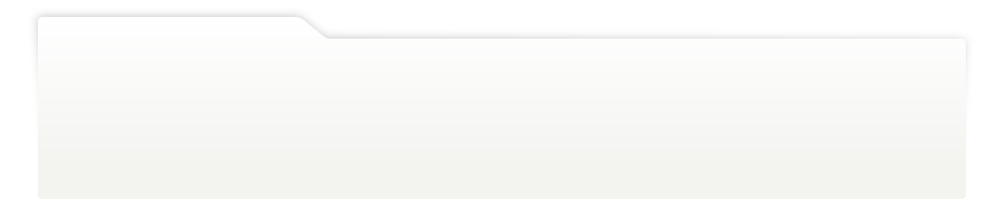
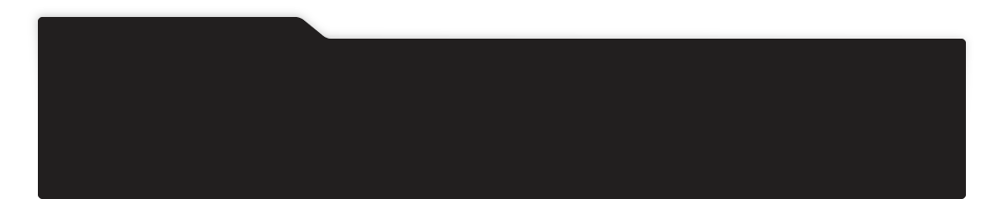
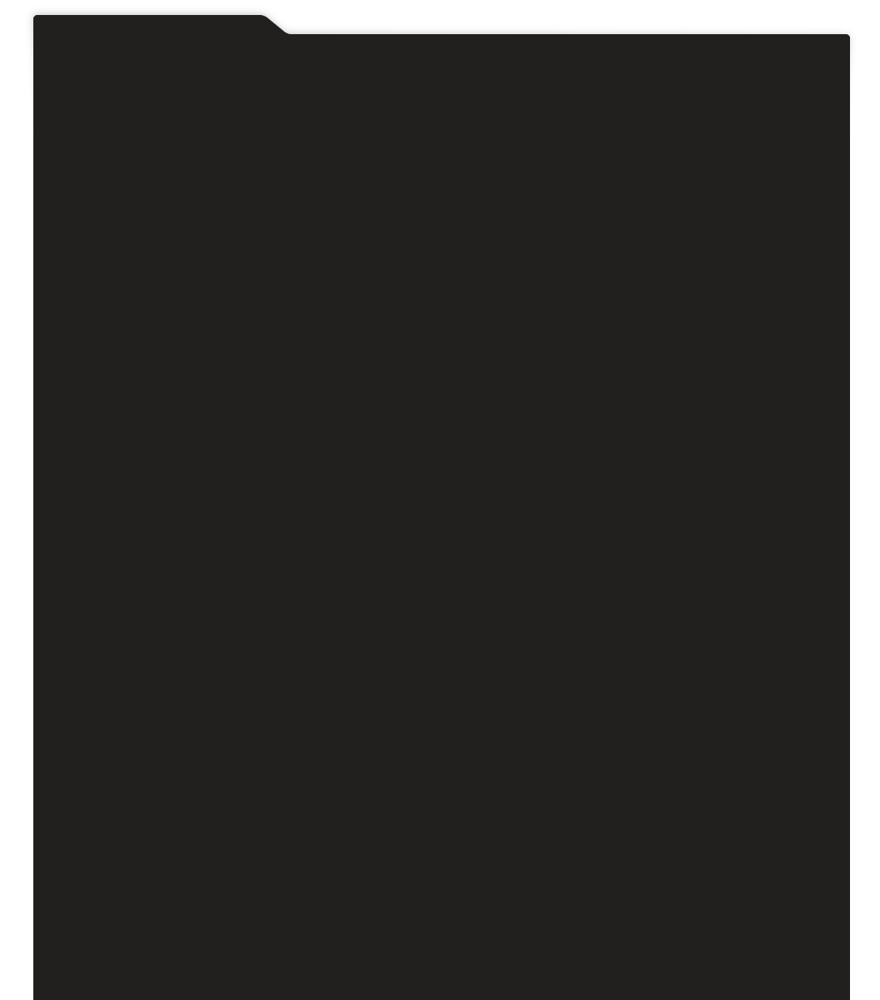
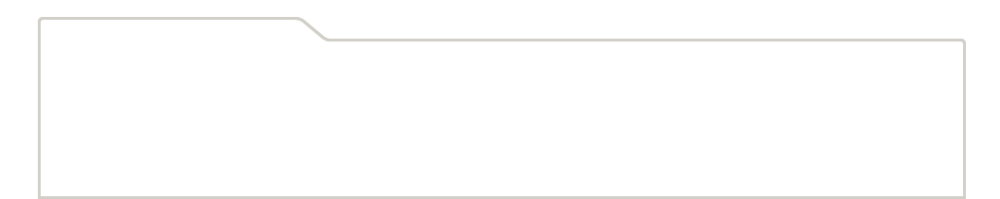
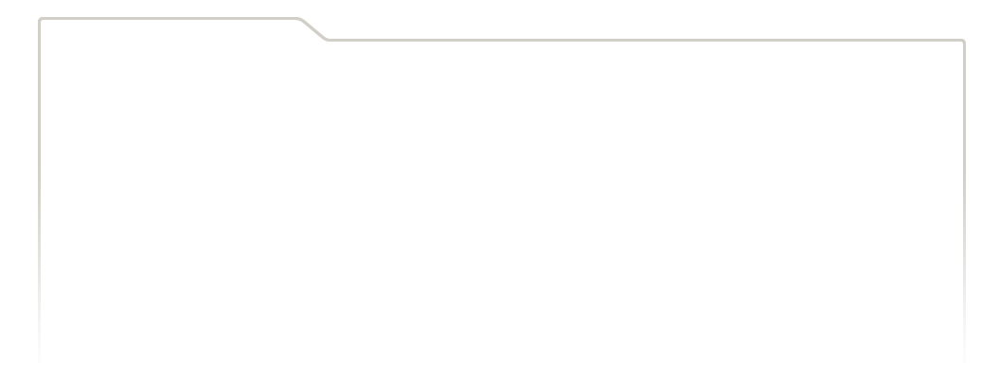
...
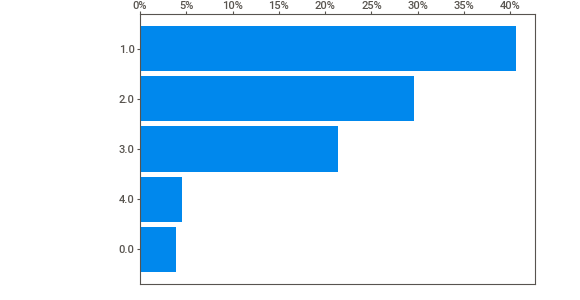
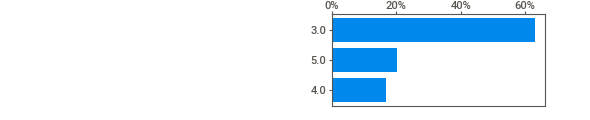
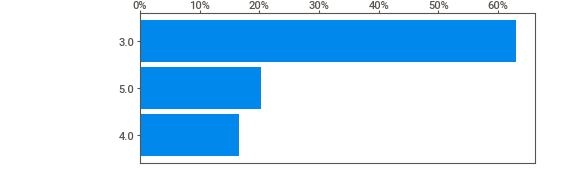
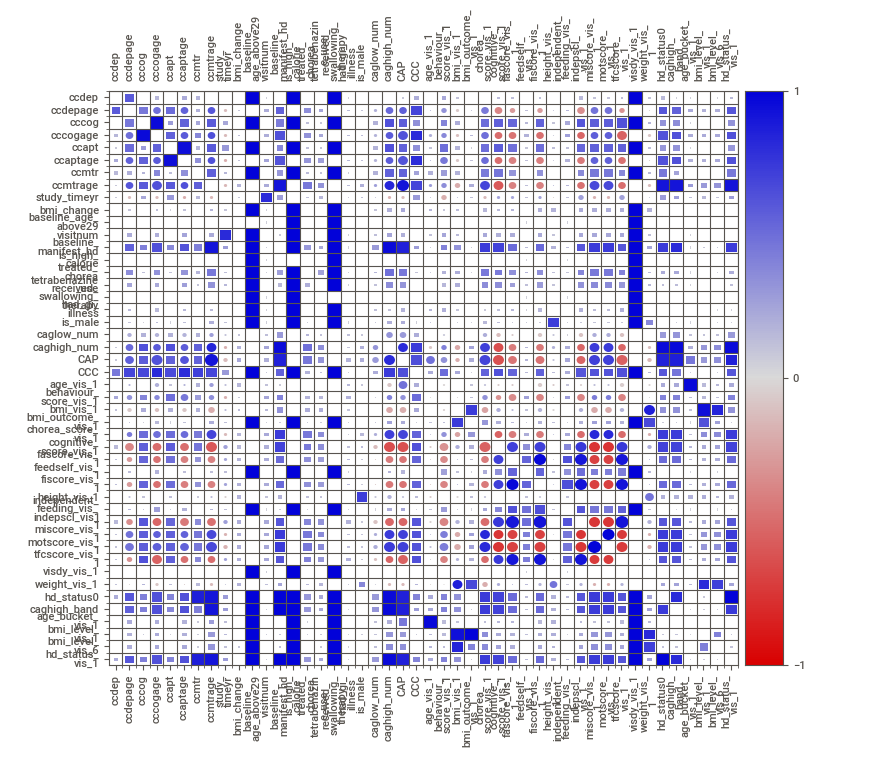
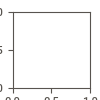

In [19]:
result.show_notebook()

In [20]:
y_cols = proj.get_columns_with_pattern(ndf, 'score').columns
x_cols = list(ndf.drop(y_cols, axis=1).columns)
display(x_cols, y_cols)

['ccdep',
 'ccdepage',
 'cccog',
 'cccogage',
 'ccapt',
 'ccaptage',
 'ccmtr',
 'ccmtrage',
 'study_timeyr',
 'bmi_change',
 'baseline_age_above29',
 'visitnum',
 'baseline_manifest_hd',
 'is_high_calorie',
 'treated_chorea',
 'tetrabenazine_use',
 'received_swallowing_therapy',
 'had_gi_illness',
 'is_male',
 'caglow_num',
 'caghigh_num',
 'CAP',
 'CCC',
 'age_vis_1',
 'bmi_vis_1',
 'bmi_outcome_vis_1',
 'feedself_vis_1',
 'height_vis_1',
 'independent_feeding_vis_1',
 'indepscl_vis_1',
 'visdy_vis_1',
 'weight_vis_1',
 'hd_status0',
 'caghigh_band',
 'age_bucket_vis_1',
 'bmi_level_vis_1',
 'bmi_level_vis_6',
 'hd_status_vis_1']

Index(['behaviour_score_vis_1', 'chorea_score_vis_1', 'cognitive_score_vis_1',
       'fascore_vis_1', 'fiscore_vis_1', 'miscore_vis_1', 'motscore_vis_1',
       'tfcscore_vis_1'],
      dtype='object')

In [21]:
fig = px.box(ndf)
fig.update_layout(height=1000, width=1000, xaxis_title='features')
fig.show()

## Average uhdrs score per cross-sectional bmi class


#### Motscore

W:\MSc-AIDS-UoH\Trimester_3\Submit\project_methods.py:2336: UserWarning:

FixedFormatter should only be used together with FixedLocator

W:\MSc-AIDS-UoH\Trimester_3\Submit\project_methods.py:2336: UserWarning:

FixedFormatter should only be used together with FixedLocator



<AxesSubplot:title={'center':'Motor Impairment per BMI Class \n(Fifth Follow-up)'}, xlabel='BMI class (fifth follow-up)', ylabel='Motor Impairment'>

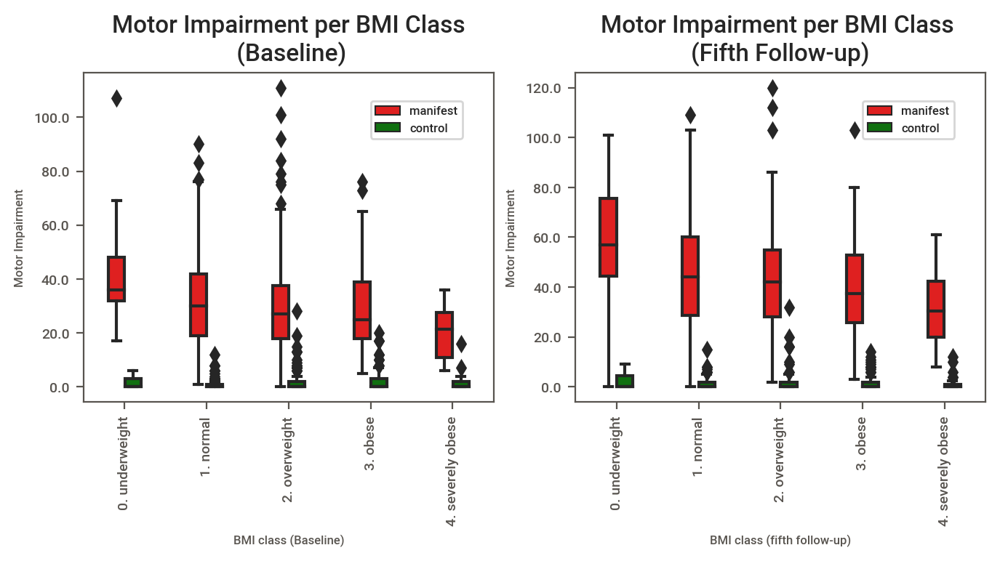

In [22]:
x, y, z = ['bmi_level_vis_1', 'motscore_vis_1', 'hd_status_gen']
xorder = sorted(analyze_df[x].unique())
cmap = {'manifest':'red', 'control':'green'}

fig, (l, r) = plt.subplots(1, 2, figsize=[8, 3], dpi=200)
proj.plot_box(axis=l, x=analyze_df[x], y=analyze_df[y], condition_on=analyze_df[z],
              plot_title="Motor Impairment per BMI Class\n (Baseline)",
              x_labe_order=xorder, paletter=cmap, box_width=0.4, x_labe='BMI class (Baseline)',
              y_labe='Motor Impairment', rotate_xticklabe=90, 
             show_legend_at=[0.7, 0.8], legend_size=6)

x, y = ['bmi_level_vis_6', 'motscore_vis_6']

proj.plot_box(axis=r, x=analyze_df[x], y=analyze_df[y], condition_on=analyze_df[z],
              plot_title="Motor Impairment per BMI Class \n(Fifth Follow-up)",
              x_labe_order=xorder, paletter=cmap, box_width=0.4, x_labe='BMI class (fifth follow-up)',
              y_labe='Motor Impairment', rotate_xticklabe=90, 
             show_legend_at=[0.7, 0.8], legend_size=6)

#### tfcscore

W:\MSc-AIDS-UoH\Trimester_3\Submit\project_methods.py:2336: UserWarning:

FixedFormatter should only be used together with FixedLocator

W:\MSc-AIDS-UoH\Trimester_3\Submit\project_methods.py:2336: UserWarning:

FixedFormatter should only be used together with FixedLocator



<AxesSubplot:title={'center':'TFC Score per BMI Class \n(Fifth Follow-up)'}, xlabel='BMI class (fifth follow-up)', ylabel='tfcscore'>

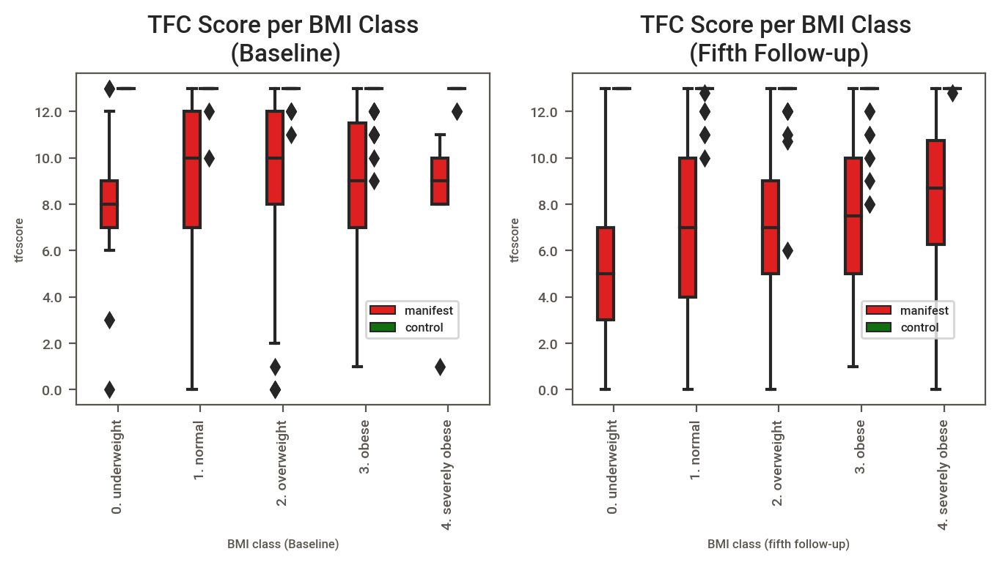

In [23]:
x, y, z = ['bmi_level_vis_1', 'tfcscore_vis_1', 'hd_status_gen']
xorder = sorted(analyze_df[x].unique())
cmap = {'manifest':'red', 'control':'green'}

fig, (l, r) = plt.subplots(1, 2, figsize=[8, 3], dpi=200)
proj.plot_box(axis=l, x=analyze_df[x], y=analyze_df[y], condition_on=analyze_df[z],
              plot_title="TFC Score per BMI Class\n (Baseline)",
              x_labe_order=xorder, paletter=cmap, box_width=0.4, x_labe='BMI class (Baseline)',
              y_labe='tfcscore', rotate_xticklabe=90, 
             show_legend_at=[0.7, 0.2], legend_size=6)

x, y = ['bmi_level_vis_6', 'tfcscore_vis_6']

proj.plot_box(axis=r, x=analyze_df[x], y=analyze_df[y], condition_on=analyze_df[z],
              plot_title="TFC Score per BMI Class \n(Fifth Follow-up)",
              x_labe_order=xorder, paletter=cmap, box_width=0.4, x_labe='BMI class (fifth follow-up)',
              y_labe='tfcscore', rotate_xticklabe=90, 
             show_legend_at=[0.7, 0.2], legend_size=6)

#### cognitive_score

W:\MSc-AIDS-UoH\Trimester_3\Submit\project_methods.py:2336: UserWarning:

FixedFormatter should only be used together with FixedLocator

W:\MSc-AIDS-UoH\Trimester_3\Submit\project_methods.py:2336: UserWarning:

FixedFormatter should only be used together with FixedLocator



<AxesSubplot:title={'center':'Cognitive Performance per BMI Class \n(Fifth Follow-up)'}, xlabel='BMI class (fifth follow-up)', ylabel='Cognitive performance'>

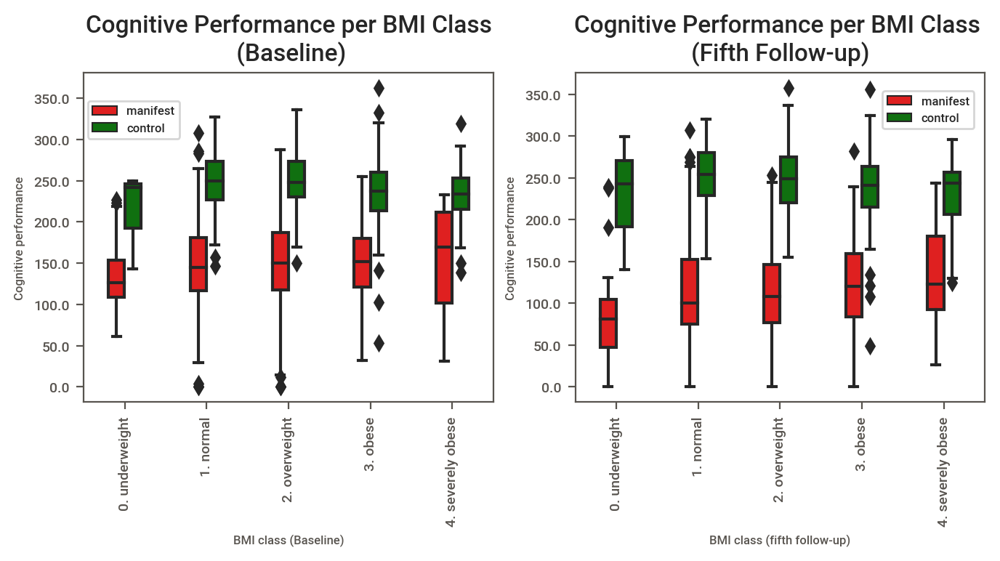

In [24]:
x, y, z = ['bmi_level_vis_1', 'cognitive_score_vis_1', 'hd_status_gen']
xorder = sorted(analyze_df[x].unique())
cmap = {'manifest':'red', 'control':'green'}

fig, (l, r) = plt.subplots(1, 2, figsize=[8, 3], dpi=200)
proj.plot_box(axis=l, x=analyze_df[x], y=analyze_df[y], condition_on=analyze_df[z],
              plot_title="Cognitive Performance per BMI Class\n (Baseline)",
              x_labe_order=xorder, paletter=cmap, box_width=0.4, x_labe='BMI class (Baseline)',
              y_labe='Cognitive performance', rotate_xticklabe=90, 
             show_legend_at=[0.01, 0.8], legend_size=6)

x, y = ['bmi_level_vis_6', 'cognitive_score_vis_6']

proj.plot_box(axis=r, x=analyze_df[x], y=analyze_df[y], condition_on=analyze_df[z],
              plot_title="Cognitive Performance per BMI Class \n(Fifth Follow-up)",
              x_labe_order=xorder, paletter=cmap, box_width=0.4, x_labe='BMI class (fifth follow-up)',
              y_labe='Cognitive performance', rotate_xticklabe=90, 
             show_legend_at=[0.75, 0.83], legend_size=6)

#### Behaviour score

W:\MSc-AIDS-UoH\Trimester_3\Submit\project_methods.py:2336: UserWarning:

FixedFormatter should only be used together with FixedLocator

W:\MSc-AIDS-UoH\Trimester_3\Submit\project_methods.py:2336: UserWarning:

FixedFormatter should only be used together with FixedLocator



<AxesSubplot:title={'center':'Behaviour Score per BMI Class \n(Fifth Follow-up)'}, xlabel='BMI class (fifth follow-up)', ylabel='Behaviour score'>

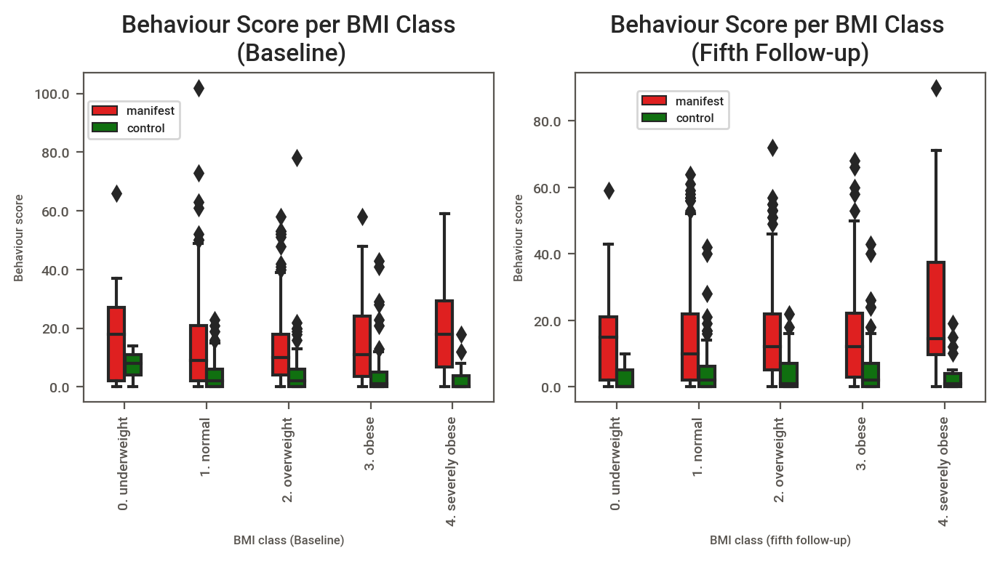

In [25]:
x, y, z = ['bmi_level_vis_1', 'behaviour_score_vis_1', 'hd_status_gen']
xorder = sorted(analyze_df[x].unique())
cmap = {'manifest':'red', 'control':'green'}

fig, (l, r) = plt.subplots(1, 2, figsize=[8, 3], dpi=200)
proj.plot_box(axis=l, x=analyze_df[x], y=analyze_df[y], condition_on=analyze_df[z],
              plot_title="Behaviour Score per BMI Class\n (Baseline)",
              x_labe_order=xorder, paletter=cmap, box_width=0.4, x_labe='BMI class (Baseline)',
              y_labe='Behaviour score', rotate_xticklabe=90, 
             show_legend_at=[0.01, 0.8], legend_size=6)

x, y = ['bmi_level_vis_6', 'behaviour_score_vis_6']

proj.plot_box(axis=r, x=analyze_df[x], y=analyze_df[y], condition_on=analyze_df[z],
              plot_title="Behaviour Score per BMI Class \n(Fifth Follow-up)",
              x_labe_order=xorder, paletter=cmap, box_width=0.4, x_labe='BMI class (fifth follow-up)',
              y_labe='Behaviour score', rotate_xticklabe=90, 
             show_legend_at=[0.15, 0.83], legend_size=6)

#### indepscl

W:\MSc-AIDS-UoH\Trimester_3\Submit\project_methods.py:2336: UserWarning:

FixedFormatter should only be used together with FixedLocator

W:\MSc-AIDS-UoH\Trimester_3\Submit\project_methods.py:2336: UserWarning:

FixedFormatter should only be used together with FixedLocator



<AxesSubplot:title={'center':'Independence Scale per BMI Class \n(Fifth Follow-up)'}, xlabel='BMI class (fifth follow-up)', ylabel='Independence Scale'>

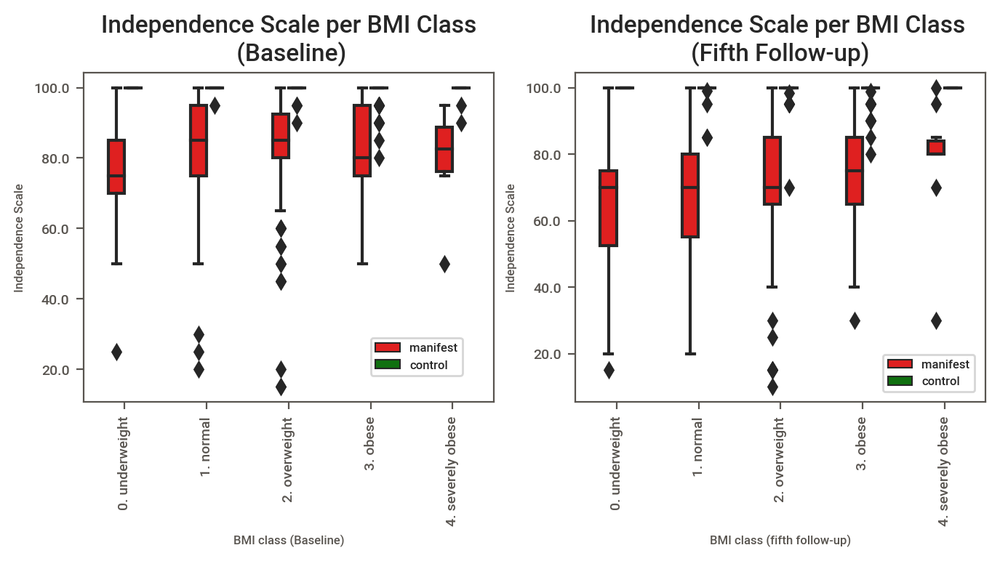

In [26]:
x, y, z = ['bmi_level_vis_1', 'indepscl_vis_1', 'hd_status_gen']
xorder = sorted(analyze_df[x].unique())
cmap = {'manifest':'red', 'control':'green'}

fig, (l, r) = plt.subplots(1, 2, figsize=[8, 3], dpi=200)
proj.plot_box(axis=l, x=analyze_df[x], y=analyze_df[y], condition_on=analyze_df[z],
              plot_title="Independence Scale per BMI Class\n (Baseline)",
              x_labe_order=xorder, paletter=cmap, box_width=0.4, x_labe='BMI class (Baseline)',
              y_labe='Independence Scale', rotate_xticklabe=90, 
             show_legend_at=[0.7, 0.08], legend_size=6)

x, y = ['bmi_level_vis_6', 'indepscl_vis_6']

proj.plot_box(axis=r, x=analyze_df[x], y=analyze_df[y], condition_on=analyze_df[z],
              plot_title="Independence Scale per BMI Class \n(Fifth Follow-up)",
              x_labe_order=xorder, paletter=cmap, box_width=0.4, x_labe='BMI class (fifth follow-up)',
              y_labe='Independence Scale', rotate_xticklabe=90, 
             show_legend_at=[0.75, 0.03], legend_size=6)

#### chorea_score

W:\MSc-AIDS-UoH\Trimester_3\Submit\project_methods.py:2336: UserWarning:

FixedFormatter should only be used together with FixedLocator

W:\MSc-AIDS-UoH\Trimester_3\Submit\project_methods.py:2336: UserWarning:

FixedFormatter should only be used together with FixedLocator



<AxesSubplot:title={'center':'Chorea score per BMI Class \n(Fifth Follow-up)'}, xlabel='BMI class (fifth follow-up)', ylabel='Chorea score'>

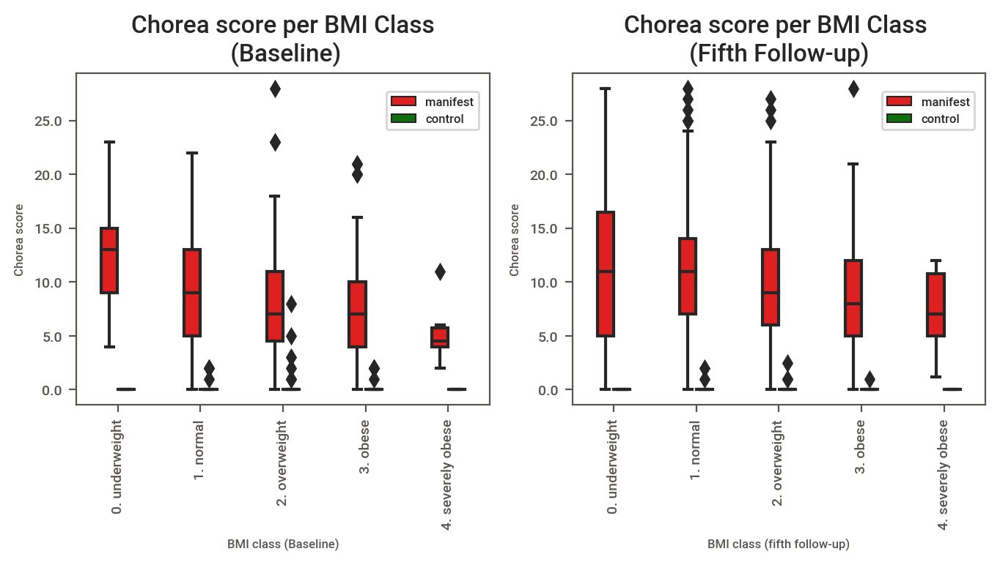

In [27]:
x, y, z = ['bmi_level_vis_1', 'chorea_score_vis_1', 'hd_status_gen']
xorder = sorted(analyze_df[x].unique())
cmap = {'manifest':'red', 'control':'green'}

fig, (l, r) = plt.subplots(1, 2, figsize=[8, 3], dpi=200)
proj.plot_box(axis=l, x=analyze_df[x], y=analyze_df[y], condition_on=analyze_df[z],
              plot_title="Chorea score per BMI Class\n (Baseline)",
              x_labe_order=xorder, paletter=cmap, box_width=0.4, x_labe='BMI class (Baseline)',
              y_labe='Chorea score', rotate_xticklabe=90, 
             show_legend_at=[0.75, 0.83], legend_size=6)

x, y = ['bmi_level_vis_6', 'chorea_score_vis_6']

proj.plot_box(axis=r, x=analyze_df[x], y=analyze_df[y], condition_on=analyze_df[z],
              plot_title="Chorea score per BMI Class \n(Fifth Follow-up)",
              x_labe_order=xorder, paletter=cmap, box_width=0.4, x_labe='BMI class (fifth follow-up)',
              y_labe='Chorea score', rotate_xticklabe=90, 
             show_legend_at=[0.75, 0.83], legend_size=6)

###  INDEPENDENCE SCALE

{'lower_limit': 25.0,
 'upper_limit': 145.0,
 'n_outliers': 17,
 'outliers': 0     10.0
 1     10.0
 2     10.0
 3     10.0
 4     10.0
 5     15.0
 6     15.0
 7     15.0
 8     15.0
 9     15.0
 10    20.0
 11    20.0
 12    20.0
 13    20.0
 14    20.0
 15    20.0
 16    20.0
 dtype: float64}

W:\MSc-AIDS-UoH\Trimester_3\Submit\project_methods.py:2336: UserWarning:

FixedFormatter should only be used together with FixedLocator

No handles with labels found to put in legend.


<AxesSubplot:title={'center':'Statistical Spread of Independence Score'}>

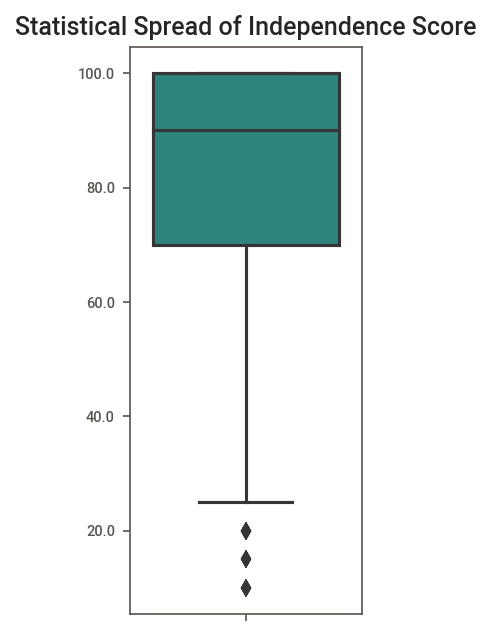

In [28]:
display(proj.outlier_detection_iqr(first6_vis['indepscl_vis_6'], precision=1))
proj.plot_box(y=first6_vis['indepscl_vis_6'], plot_title="Statistical Spread of Independence Score",
             figsize=(2, 5))

In [29]:
ctl = proj.get_columns_with_pattern(control, 'indepscl_vis')
mnf = proj.get_columns_with_pattern(manifest, 'indepscl_vis')
display(ctl, mnf)
display(ctl.describe(), mnf.describe())

,indepscl_vis_1,indepscl_vis_6
0,100.0,100.0
1,100.0,100.0
2,100.0,100.0
3,100.0,100.0
4,100.0,100.0
...,...,...
315,100.0,100.0
316,100.0,100.0
317,100.0,100.0
318,100.0,100.0


,indepscl_vis_1,indepscl_vis_6
0,95.0,65.0
1,90.0,75.0
2,100.0,75.0
3,80.0,30.0
4,85.0,90.0
...,...,...
541,85.0,90.0
542,65.0,70.0
543,100.0,98.3
544,100.0,85.0


,indepscl_vis_1,indepscl_vis_6
count,320.00,320.00
mean,99.55,99.41
std,2.10,2.81
min,80.00,70.00
25%,100.00,100.00
50%,100.00,100.00
75%,100.00,100.00
max,100.00,100.00


,indepscl_vis_1,indepscl_vis_6
count,546.00,546.00
mean,82.77,69.96
std,14.24,18.86
min,15.00,10.00
25%,75.00,60.00
50%,85.00,70.00
75%,95.00,85.00
max,100.00,100.00


,control_avg,control_std,control_sterr
indepscl_vis_1,99.5,2.1,0.1
indepscl_vis_6,99.4,2.8,0.2


,manifest_avg,manifest_std,manifest_sterr
indepscl_vis_1,82.8,14.2,0.6
indepscl_vis_6,70.0,18.9,0.8


,control_avg,control_std,control_sterr,manifest_avg,manifest_std,manifest_sterr,visit
indepscl_vis_1,99.5,2.1,0.1,82.8,14.2,0.6,1
indepscl_vis_6,99.4,2.8,0.2,70.0,18.9,0.8,6


Index(['control_std', 'control_sterr', 'manifest_std', 'manifest_sterr'], dtype='object')

W:\MSc-AIDS-UoH\Trimester_3\Submit\project_methods.py:2125: UserWarning:

FixedFormatter should only be used together with FixedLocator



<AxesSubplot:title={'center':'Average Independence Scale over Time (-/+ 1avg)'}, xlabel='visit'>

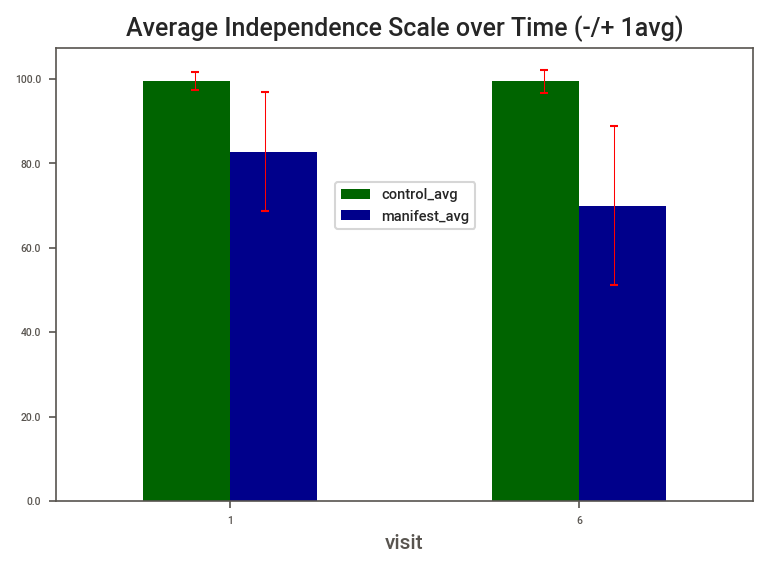

In [30]:
ren = {'index':'variable'}
cols = proj.get_columns_with_pattern(first6_vis, 'indepscl_vis').columns
ctl_avg = proj.compute_mean_std_sterr(control[cols], 'control', precision=1)

cols = proj.get_columns_with_pattern(first6_vis, 'indepscl_vis').columns
mnf_avg = proj.compute_mean_std_sterr(manifest[cols], 'manifest', precision=1)

avg = pd.merge(ctl_avg, mnf_avg, left_index=True, right_index=True)
avg.loc[:, 'visit'] = np.array([1, 6]).astype(str)
display(ctl_avg, mnf_avg, avg)

drop_cols = proj.get_columns_with_pattern(avg, '_st').columns
display(drop_cols)
cmap = {c:'darkgreen' if 'control' in c.lower() else 'darkblue' if 'manifest' in c.lower() else 'gray' for c in avg.columns}
fig, ax1 = plt.subplots(figsize=[6, 4], dpi=150)

avg.drop(drop_cols, axis=1).plot(kind='bar', x='visit', color=cmap, ax=ax1)
proj.adjust_axis(ax1, plot_title="Average Independence Scale over Time (-/+ 1avg)", title_size=12,
                show_legend_at=[0.4, 0.6])
proj.plot_errorbars(avg['visit'], avg['control_avg'], avg['control_std'], errbar_color='red', axis=ax1)
proj.plot_errorbars(avg['visit'], avg['manifest_avg'], avg['manifest_std'], errbar_color='red', axis=ax1, shift=True)

#### Gender

In [31]:
# male
ctl = proj.get_columns_with_pattern(male_control, 'indepscl_vis')
mnf = proj.get_columns_with_pattern(male_manifest, 'indepscl_vis')
display(ctl, mnf)
display(ctl.describe(), mnf.describe())

,indepscl_vis_1,indepscl_vis_6
7,100.0,100.0
20,100.0,100.0
24,100.0,100.0
36,100.0,100.0
45,100.0,100.0
...,...,...
1243,100.0,100.0
1258,100.0,100.0
1292,95.0,100.0
1295,100.0,100.0


,indepscl_vis_1,indepscl_vis_6
0,95.0,65.0
1,90.0,75.0
3,100.0,75.0
4,80.0,30.0
8,85.0,90.0
...,...,...
1289,80.0,75.0
1290,80.0,70.0
1300,85.0,90.0
1303,65.0,70.0


,indepscl_vis_1,indepscl_vis_6
count,115.00,115.00
mean,99.39,99.38
std,2.21,3.25
min,85.00,70.00
25%,100.00,100.00
50%,100.00,100.00
75%,100.00,100.00
max,100.00,100.00


,indepscl_vis_1,indepscl_vis_6
count,286.00,286.00
mean,84.06,71.83
std,12.95,17.22
min,25.00,15.00
25%,75.00,65.00
50%,85.00,75.00
75%,95.00,85.00
max,100.00,100.00


,control_avg,control_std,manifest_avg,manifest_std,visit
indepscl_vis_1,99.4,2.2,84.1,12.9,1
indepscl_vis_6,99.4,3.3,71.8,17.2,6


,control_avg,manifest_avg,visit
indepscl_vis_1,99.4,84.1,1
indepscl_vis_6,99.4,71.8,6


,control_std,manifest_std,visit
indepscl_vis_1,2.2,12.9,1
indepscl_vis_6,3.3,17.2,6


W:\MSc-AIDS-UoH\Trimester_3\Submit\project_methods.py:2125: UserWarning:

FixedFormatter should only be used together with FixedLocator



<AxesSubplot:title={'center':'Male Average Independence Scale over Time (-/+ 1SD)'}, xlabel='visit'>

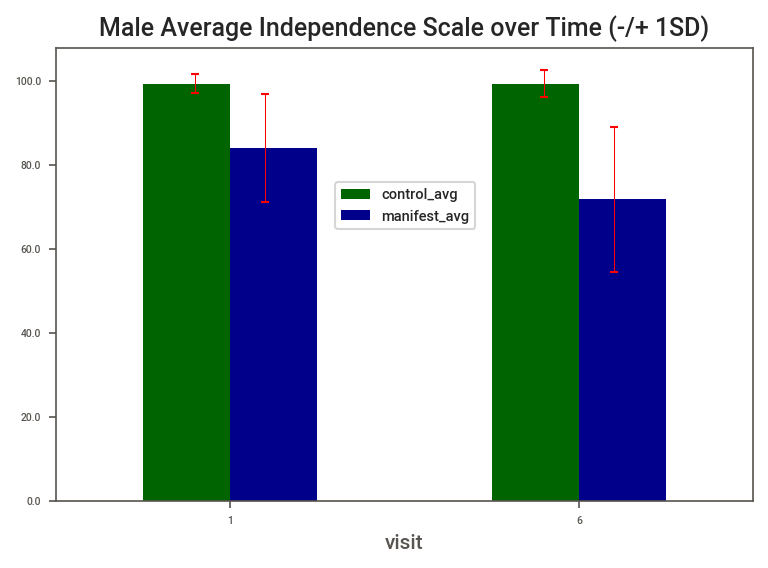

In [32]:
avg = pd.Series(ctl.mean().round(1), name='control_avg')
sd = pd.Series(np.std(ctl, ddof=1).round(1), name='control_std')
ctl_freq = pd.concat([avg, sd], axis=1)

avg = pd.Series(mnf.mean().round(1), name='manifest_avg')
sd = pd.Series(np.std(mnf, ddof=1).round(1), name='manifest_std')
mnf_freq = pd.concat([avg, sd], axis=1)

freq = pd.merge(ctl_freq, mnf_freq, left_index=True, right_index=True)
freq.loc[:, 'visit'] = np.array([1, 6]).astype(str)
display(freq)
avg = freq.drop(list(proj.get_columns_with_pattern(freq, 'std').columns), axis=1)
sd = freq.drop(list(proj.get_columns_with_pattern(freq, 'avg').columns), axis=1)
display(avg, sd)

cmap = {c:'darkgreen' if 'control' in c.lower() else 'darkblue' if 'manifest' in c.lower() else 'gray' for c in avg.columns}
fig, ax1 = plt.subplots(figsize=[6, 4], dpi=150)

proj.plot_errorbars(freq['visit'], freq['control_avg'], sd['control_std'], errbar_color='red', axis=ax1)
proj.plot_errorbars(freq['visit'], freq['manifest_avg'], sd['manifest_std'], errbar_color='red', axis=ax1, shift=True)
avg.plot(kind='bar', x='visit', color=cmap, ax=ax1)
proj.adjust_axis(ax1, plot_title="Male Average Independence Scale over Time (-/+ 1SD)", title_size=12,
                show_legend_at=[0.4, 0.6])

In [33]:
# female
ctl = proj.get_columns_with_pattern(female_control, 'indepscl_vis')
mnf = proj.get_columns_with_pattern(female_manifest, 'indepscl_vis')
display(ctl, mnf)
display(ctl.describe(), mnf.describe())

,indepscl_vis_1,indepscl_vis_6
28,100.0,100.0
29,100.0,100.0
33,100.0,100.0
42,100.0,100.0
52,100.0,100.0
...,...,...
1286,100.0,100.0
1294,100.0,100.0
1297,100.0,100.0
1299,100.0,100.0


,indepscl_vis_1,indepscl_vis_6
15,85.0,75.0
16,65.0,55.0
19,65.0,20.0
27,80.0,65.0
30,95.0,95.0
...,...,...
1293,70.0,25.0
1296,50.0,50.0
1298,90.0,100.0
1306,100.0,98.3


,indepscl_vis_1,indepscl_vis_6
count,205.00,205.00
mean,99.63,99.43
std,2.04,2.54
min,80.00,80.00
25%,100.00,100.00
50%,100.00,100.00
75%,100.00,100.00
max,100.00,100.00


,indepscl_vis_1,indepscl_vis_6
count,260.00,260.00
mean,81.37,67.90
std,15.43,20.35
min,15.00,10.00
25%,75.00,55.00
50%,80.00,70.00
75%,95.00,80.00
max,100.00,100.00


,control_avg,control_std,manifest_avg,manifest_std,visit
indepscl_vis_1,99.6,2.0,81.4,15.4,1
indepscl_vis_6,99.4,2.5,67.9,20.4,6


,control_avg,manifest_avg,visit
indepscl_vis_1,99.6,81.4,1
indepscl_vis_6,99.4,67.9,6


,control_std,manifest_std,visit
indepscl_vis_1,2.0,15.4,1
indepscl_vis_6,2.5,20.4,6


W:\MSc-AIDS-UoH\Trimester_3\Submit\project_methods.py:2125: UserWarning:

FixedFormatter should only be used together with FixedLocator



<AxesSubplot:title={'center':'Female Average Independence Scale over Time (-/+ 1SD)'}, xlabel='visit'>

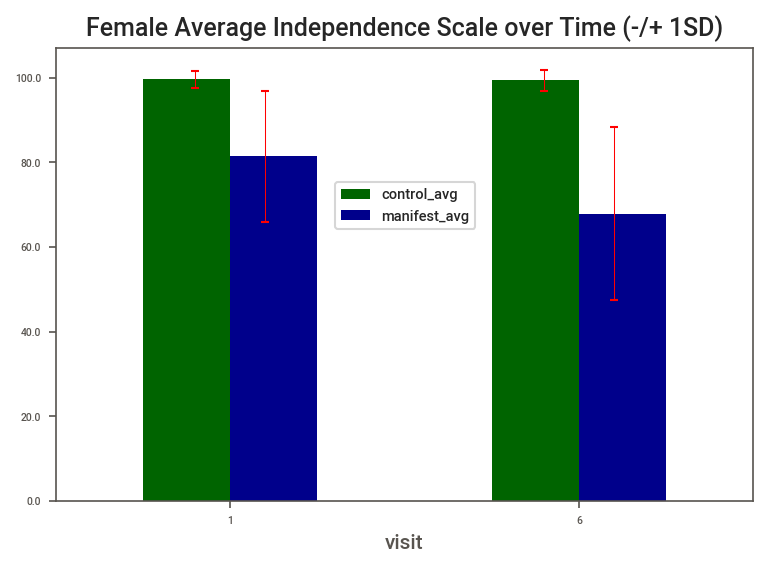

In [34]:
avg = pd.Series(ctl.mean().round(1), name='control_avg')
sd = pd.Series(np.std(ctl, ddof=1).round(1), name='control_std')
ctl_freq = pd.concat([avg, sd], axis=1)

avg = pd.Series(mnf.mean().round(1), name='manifest_avg')
sd = pd.Series(np.std(mnf, ddof=1).round(1), name='manifest_std')
mnf_freq = pd.concat([avg, sd], axis=1)

freq = pd.merge(ctl_freq, mnf_freq, left_index=True, right_index=True)
freq.loc[:, 'visit'] = np.array([1, 6]).astype(str)
display(freq)
avg = freq.drop(list(proj.get_columns_with_pattern(freq, 'std').columns), axis=1)
sd = freq.drop(list(proj.get_columns_with_pattern(freq, 'avg').columns), axis=1)
display(avg, sd)

cmap = {c:'darkgreen' if 'control' in c.lower() else 'darkblue' if 'manifest' in c.lower() else 'gray' for c in avg.columns}
fig, ax1 = plt.subplots(figsize=[6, 4], dpi=150)

proj.plot_errorbars(freq['visit'], freq['control_avg'], sd['control_std'], errbar_color='red', axis=ax1)
proj.plot_errorbars(freq['visit'], freq['manifest_avg'], sd['manifest_std'], errbar_color='red', axis=ax1, shift=True)
avg.plot(kind='bar', x='visit', color=cmap, ax=ax1)
proj.adjust_axis(ax1, plot_title="Female Average Independence Scale over Time (-/+ 1SD)", title_size=12,
                show_legend_at=[0.4, 0.6])

#### CAG Repeat

In [35]:
proj.give_percentage(manifest.caghigh_band.value_counts(), len(manifest))

3. full penetrance       96.89
2. reduced penetrance     3.11
Name: caghigh_band, dtype: float64

In [36]:
# cag repeat
rp = proj.get_columns_with_pattern(redpen, 'indepscl_vis')
fp = proj.get_columns_with_pattern(fulpen, 'indepscl_vis')
display(rp, fp)
display(rp.describe(), fp.describe())

,indepscl_vis_1,indepscl_vis_6
0,90.0,90.0
1,90.0,80.0
2,95.0,80.0
3,85.0,75.0
4,80.0,85.0
5,95.0,100.0
6,50.0,25.0
7,95.0,90.0
8,70.0,70.0
9,75.0,75.0


,indepscl_vis_1,indepscl_vis_6
0,95.0,65.0
1,90.0,75.0
2,100.0,75.0
3,80.0,30.0
4,85.0,90.0
...,...,...
524,85.0,90.0
525,65.0,70.0
526,100.0,98.3
527,100.0,85.0


,indepscl_vis_1,indepscl_vis_6
count,17.00,17.00
mean,82.35,74.12
std,13.00,16.89
min,50.00,25.00
25%,75.00,70.00
50%,85.00,75.00
75%,95.00,80.00
max,95.00,100.00


,indepscl_vis_1,indepscl_vis_6
count,529.00,529.00
mean,82.79,69.82
std,14.29,18.92
min,15.00,10.00
25%,75.00,60.00
50%,85.00,70.00
75%,95.00,85.00
max,100.00,100.00


,reduced_penetrance_avg,reduced_penetrance_std,full_penetrance_avg,full_penetrance_std,visit
indepscl_vis_1,82.4,13.0,82.8,14.3,1
indepscl_vis_6,74.1,16.9,69.8,18.9,6


,reduced_penetrance_avg,full_penetrance_avg,visit
indepscl_vis_1,82.4,82.8,1
indepscl_vis_6,74.1,69.8,6


,reduced_penetrance_std,full_penetrance_std,visit
indepscl_vis_1,13.0,14.3,1
indepscl_vis_6,16.9,18.9,6


W:\MSc-AIDS-UoH\Trimester_3\Submit\project_methods.py:2125: UserWarning:

FixedFormatter should only be used together with FixedLocator



<AxesSubplot:title={'center':'Reduced Vs. Full Penetrance Average Independence \nScale over Time (-/+ 1SD)'}, xlabel='visit'>

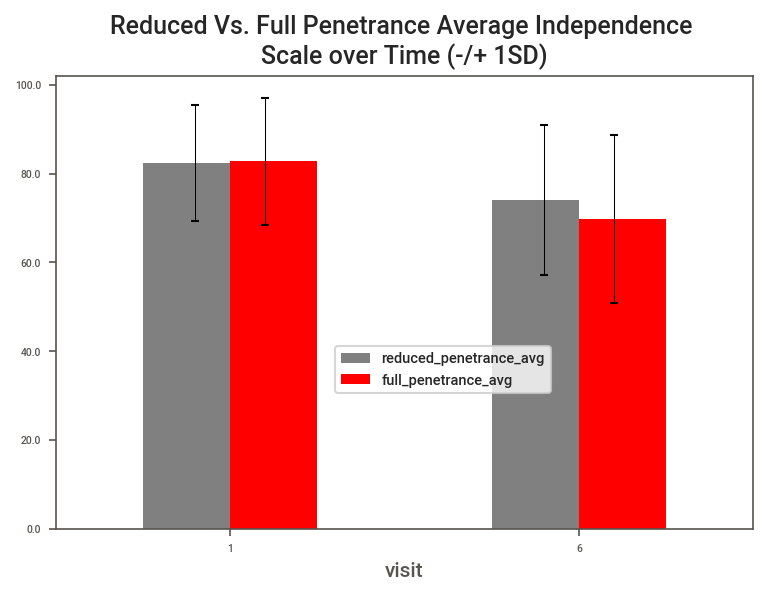

In [37]:
avg = pd.Series(rp.mean().round(1), name='reduced_penetrance_avg')
sd = pd.Series(np.std(rp, ddof=1).round(1), name='reduced_penetrance_std')
rp_freq = pd.concat([avg, sd], axis=1)

avg = pd.Series(fp.mean().round(1), name='full_penetrance_avg')
sd = pd.Series(np.std(fp, ddof=1).round(1), name='full_penetrance_std')
fp_freq = pd.concat([avg, sd], axis=1)

freq = pd.merge(rp_freq, fp_freq, left_index=True, right_index=True)
freq.loc[:, 'visit'] = np.array([1, 6]).astype(str)
display(freq)
avg = freq.drop(list(proj.get_columns_with_pattern(freq, 'std').columns), axis=1)
sd = freq.drop(list(proj.get_columns_with_pattern(freq, 'avg').columns), axis=1)
display(avg, sd)

cmap = {c:'gray' if 'reduced_penetrance' in c.lower() else 'red' if 'full_penetrance' in c.lower() else 'gray' for c in avg.columns}
fig, ax1 = plt.subplots(figsize=[6, 4], dpi=150)

proj.plot_errorbars(freq['visit'], freq['reduced_penetrance_avg'], sd['reduced_penetrance_std'], axis=ax1)
proj.plot_errorbars(freq['visit'], freq['full_penetrance_avg'], sd['full_penetrance_std'], axis=ax1, shift=True)
avg.plot(kind='bar', x='visit', color=cmap, ax=ax1)
proj.adjust_axis(ax1, plot_title="Reduced Vs. Full Penetrance Average Independence \nScale over Time (-/+ 1SD)", title_size=12,
                show_legend_at=[0.4, 0.3])

### BMI & Independence Score

In [38]:
# baseline
cols = ['bmi_level_vis_6', 'indepscl_vis_1',]
ctl = proj.get_columns_with_pattern(control, cols)
mnf = proj.get_columns_with_pattern(manifest, cols)
display(ctl, mnf)
display(ctl.describe(include='all'), mnf.describe(include='all'))

ctl_avg = ctl.groupby(cols[0]).mean().round(1).rename(columns={cols[-1]:'control_avg'})
ctl_std = ctl.groupby(cols[0]).std().round(1).rename(columns={cols[-1]:'control_std'})
ctl = pd.merge(ctl_avg, ctl_std, left_index=True, right_index=True)

mnf_avg = mnf.groupby(cols[0]).mean().round(1).rename(columns={cols[-1]:'manifest_avg'})
mnf_std = mnf.groupby(cols[0]).std().round(1).rename(columns={cols[-1]:'manifest_std'})
mnf = pd.merge(mnf_avg, mnf_std, left_index=True, right_index=True)

v1 = pd.merge(ctl, mnf, left_index=True, right_index=True)
display(v1)

,bmi_level_vis_6,indepscl_vis_1
0,3. obese,100.0
1,3. obese,100.0
2,2. overweight,100.0
3,0. underweight,100.0
4,1. normal,100.0
...,...,...
315,2. overweight,100.0
316,1. normal,100.0
317,2. overweight,100.0
318,3. obese,100.0


,bmi_level_vis_6,indepscl_vis_1
0,0. underweight,95.0
1,1. normal,90.0
2,1. normal,100.0
3,1. normal,80.0
4,1. normal,85.0
...,...,...
541,2. overweight,85.0
542,2. overweight,65.0
543,3. obese,100.0
544,3. obese,100.0


,bmi_level_vis_6,indepscl_vis_1
count,320,320.00
unique,5,NaN
top,2. overweight,NaN
freq,103,NaN
mean,NaN,99.55
std,NaN,2.10
min,NaN,80.00
25%,NaN,100.00
50%,NaN,100.00
75%,NaN,100.00


,bmi_level_vis_6,indepscl_vis_1
count,546,546.00
unique,5,NaN
top,1. normal,NaN
freq,268,NaN
mean,NaN,82.77
std,NaN,14.24
min,NaN,15.00
25%,NaN,75.00
50%,NaN,85.00
75%,NaN,95.00


,control_avg,control_std,manifest_avg,manifest_std
bmi_level_vis_6,,,,
0. underweight,100.0,0.0,77.9,19.5
1. normal,99.8,1.3,83.5,12.9
2. overweight,99.9,0.8,82.0,15.3
3. obese,99.0,3.3,84.0,14.0
4. severely obese,99.8,0.9,81.0,13.7


In [39]:
# visit 6
cols = ['bmi_level_vis_6', 'indepscl_vis_6',]
ctl = proj.get_columns_with_pattern(control, cols)
mnf = proj.get_columns_with_pattern(manifest, cols)
display(ctl, mnf)
display(ctl.describe(include='all'), mnf.describe(include='all'))

ctl_avg = ctl.groupby(cols[0]).mean().round(1).rename(columns={cols[-1]:'control_avg'})
ctl_std = ctl.groupby(cols[0]).std().round(1).rename(columns={cols[-1]:'control_std'})
ctl = pd.merge(ctl_avg, ctl_std, left_index=True, right_index=True)

mnf_avg = mnf.groupby(cols[0]).mean().round(1).rename(columns={cols[-1]:'manifest_avg'})
mnf_std = mnf.groupby(cols[0]).std().round(1).rename(columns={cols[-1]:'manifest_std'})
mnf = pd.merge(mnf_avg, mnf_std, left_index=True, right_index=True)

v6 = pd.merge(ctl, mnf, left_index=True, right_index=True)
display(v6)

,bmi_level_vis_6,indepscl_vis_6
0,3. obese,100.0
1,3. obese,100.0
2,2. overweight,100.0
3,0. underweight,100.0
4,1. normal,100.0
...,...,...
315,2. overweight,100.0
316,1. normal,100.0
317,2. overweight,100.0
318,3. obese,100.0


,bmi_level_vis_6,indepscl_vis_6
0,0. underweight,65.0
1,1. normal,75.0
2,1. normal,75.0
3,1. normal,30.0
4,1. normal,90.0
...,...,...
541,2. overweight,90.0
542,2. overweight,70.0
543,3. obese,98.3
544,3. obese,85.0


,bmi_level_vis_6,indepscl_vis_6
count,320,320.00
unique,5,NaN
top,2. overweight,NaN
freq,103,NaN
mean,NaN,99.41
std,NaN,2.81
min,NaN,70.00
25%,NaN,100.00
50%,NaN,100.00
75%,NaN,100.00


,bmi_level_vis_6,indepscl_vis_6
count,546,546.00
unique,5,NaN
top,1. normal,NaN
freq,268,NaN
mean,NaN,69.96
std,NaN,18.86
min,NaN,10.00
25%,NaN,60.00
50%,NaN,70.00
75%,NaN,85.00


,control_avg,control_std,manifest_avg,manifest_std
bmi_level_vis_6,,,,
0. underweight,100.0,0.0,62.3,22.0
1. normal,99.6,2.4,68.9,19.5
2. overweight,99.5,3.1,70.5,18.0
3. obese,99.0,3.2,74.4,15.9
4. severely obese,100.0,0.0,78.1,18.9


W:\MSc-AIDS-UoH\Trimester_3\Submit\project_methods.py:2125: UserWarning:

FixedFormatter should only be used together with FixedLocator

W:\MSc-AIDS-UoH\Trimester_3\Submit\project_methods.py:2125: UserWarning:

FixedFormatter should only be used together with FixedLocator



<AxesSubplot:title={'center':'Average Independence Score & Sixth BMI'}, xlabel=' ', ylabel='Mean Independence score'>

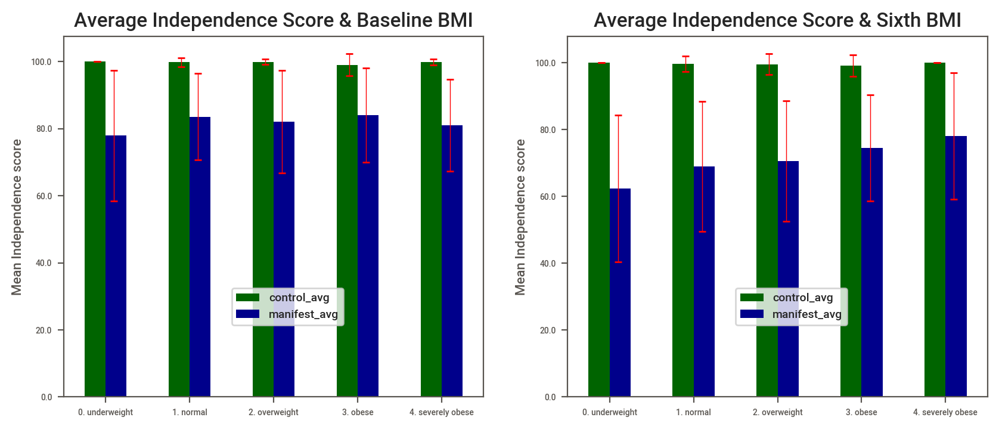

In [40]:
cmap = {c:'darkgreen' if 'control' in c.lower() else 'darkblue' if 'manifest' in c.lower() else 'gray' for c in v1.columns}
fig, (l, r) = plt.subplots(1, 2, figsize=[10, 4], dpi=200)

# visit 1
v1.loc[:, ['control_avg', 'manifest_avg']].plot(kind='bar', color=cmap, ax=l)
proj.adjust_axis(l, plot_title="Average Independence Score & Baseline BMI", x_labe=' ', y_labe='Mean Independence score', 
                show_legend_at=[0.4, 0.2])
proj.plot_errorbars(x=v1.index, y=v1['control_avg'], yerror=v1['control_std'], errbar_color='red', axis=l)
proj.plot_errorbars(x=v1.index, y=v1['manifest_avg'], yerror=v1['manifest_std'], errbar_color='red', axis=l, shift=True)

# visit 6
v6.loc[:, ['control_avg', 'manifest_avg']].plot(kind='bar', color=cmap, ax=r)
proj.adjust_axis(r, plot_title="Average Independence Score & Sixth BMI", x_labe=' ',  y_labe='Mean Independence score', 
                show_legend_at=[0.4, 0.2])
proj.plot_errorbars(x=v6.index, y=v6['control_avg'], yerror=v6['control_std'], errbar_color='red', axis=r)
proj.plot_errorbars(x=v6.index, y=v6['manifest_avg'], yerror=v6['manifest_std'], errbar_color='red', axis=r, shift=True)

#### BMI change: Increase Vs. Decrease

In [41]:
# baseline
cols = ['v1v6_bmi_change', 'indepscl_vis_1',]
ctl = proj.get_columns_with_pattern(control, cols)
mnf = proj.get_columns_with_pattern(manifest, cols)
display(ctl, mnf)
display(ctl.describe(include='all'), mnf.describe(include='all'))

ctl_avg = ctl.groupby(cols[0]).mean().round(1).rename(columns={cols[-1]:'control_avg'})
ctl_std = ctl.groupby(cols[0]).std().round(1).rename(columns={cols[-1]:'control_std'})
ctl = pd.merge(ctl_avg, ctl_std, left_index=True, right_index=True)

mnf_avg = mnf.groupby(cols[0]).mean().round(1).rename(columns={cols[-1]:'manifest_avg'})
mnf_std = mnf.groupby(cols[0]).std().round(1).rename(columns={cols[-1]:'manifest_std'})
mnf = pd.merge(mnf_avg, mnf_std, left_index=True, right_index=True)

v1 = pd.merge(ctl, mnf, left_index=True, right_index=True)
display(v1)

,v1v6_bmi_change,indepscl_vis_1
0,1. increase,100.0
1,1. increase,100.0
2,1. increase,100.0
3,-1. decrease,100.0
4,1. increase,100.0
...,...,...
315,1. increase,100.0
316,1. increase,100.0
317,1. increase,100.0
318,1. increase,100.0


,v1v6_bmi_change,indepscl_vis_1
0,-1. decrease,95.0
1,-1. decrease,90.0
2,1. increase,100.0
3,-1. decrease,80.0
4,-1. decrease,85.0
...,...,...
541,1. increase,85.0
542,-1. decrease,65.0
543,0. no change,100.0
544,1. increase,100.0


,v1v6_bmi_change,indepscl_vis_1
count,320,320.00
unique,3,NaN
top,1. increase,NaN
freq,173,NaN
mean,NaN,99.55
std,NaN,2.10
min,NaN,80.00
25%,NaN,100.00
50%,NaN,100.00
75%,NaN,100.00


,v1v6_bmi_change,indepscl_vis_1
count,546,546.00
unique,3,NaN
top,-1. decrease,NaN
freq,279,NaN
mean,NaN,82.77
std,NaN,14.24
min,NaN,15.00
25%,NaN,75.00
50%,NaN,85.00
75%,NaN,95.00


,control_avg,control_std,manifest_avg,manifest_std
v1v6_bmi_change,,,,
-1. decrease,99.2,2.9,82.4,13.7
0. no change,99.5,1.6,79.4,21.6
1. increase,99.8,1.2,83.8,13.3


In [42]:
# visit 6
cols = ['v1v6_bmi_change', 'indepscl_vis_6',]
ctl = proj.get_columns_with_pattern(control, cols)
mnf = proj.get_columns_with_pattern(manifest, cols)
display(ctl, mnf)
display(ctl.describe(include='all'), mnf.describe(include='all'))

ctl_avg = ctl.groupby(cols[0]).mean().round(1).rename(columns={cols[-1]:'control_avg'})
ctl_std = ctl.groupby(cols[0]).std().round(1).rename(columns={cols[-1]:'control_std'})
ctl = pd.merge(ctl_avg, ctl_std, left_index=True, right_index=True)

mnf_avg = mnf.groupby(cols[0]).mean().round(1).rename(columns={cols[-1]:'manifest_avg'})
mnf_std = mnf.groupby(cols[0]).std().round(1).rename(columns={cols[-1]:'manifest_std'})
mnf = pd.merge(mnf_avg, mnf_std, left_index=True, right_index=True)

v6 = pd.merge(ctl, mnf, left_index=True, right_index=True)
display(v6)

,v1v6_bmi_change,indepscl_vis_6
0,1. increase,100.0
1,1. increase,100.0
2,1. increase,100.0
3,-1. decrease,100.0
4,1. increase,100.0
...,...,...
315,1. increase,100.0
316,1. increase,100.0
317,1. increase,100.0
318,1. increase,100.0


,v1v6_bmi_change,indepscl_vis_6
0,-1. decrease,65.0
1,-1. decrease,75.0
2,1. increase,75.0
3,-1. decrease,30.0
4,-1. decrease,90.0
...,...,...
541,1. increase,90.0
542,-1. decrease,70.0
543,0. no change,98.3
544,1. increase,85.0


,v1v6_bmi_change,indepscl_vis_6
count,320,320.00
unique,3,NaN
top,1. increase,NaN
freq,173,NaN
mean,NaN,99.41
std,NaN,2.81
min,NaN,70.00
25%,NaN,100.00
50%,NaN,100.00
75%,NaN,100.00


,v1v6_bmi_change,indepscl_vis_6
count,546,546.00
unique,3,NaN
top,-1. decrease,NaN
freq,279,NaN
mean,NaN,69.96
std,NaN,18.86
min,NaN,10.00
25%,NaN,60.00
50%,NaN,70.00
75%,NaN,85.00


,control_avg,control_std,manifest_avg,manifest_std
v1v6_bmi_change,,,,
-1. decrease,99.2,3.7,69.9,19.0
0. no change,99.8,0.5,70.9,21.4
1. increase,99.5,2.1,69.9,18.4


W:\MSc-AIDS-UoH\Trimester_3\Submit\project_methods.py:2125: UserWarning:

FixedFormatter should only be used together with FixedLocator

W:\MSc-AIDS-UoH\Trimester_3\Submit\project_methods.py:2125: UserWarning:

FixedFormatter should only be used together with FixedLocator



<AxesSubplot:title={'center':'Average Independence Score \n& Sixth BMI Changge'}, xlabel=' ', ylabel='Mean Independence score'>

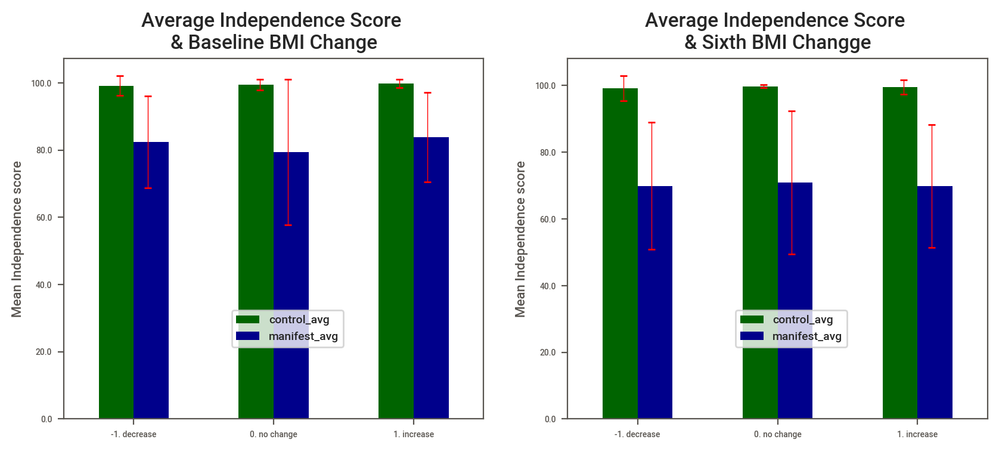

In [43]:
cmap = {c:'darkgreen' if 'control' in c.lower() else 'darkblue' if 'manifest' in c.lower() else 'gray' for c in v1.columns}
fig, (l, r) = plt.subplots(1, 2, figsize=[10, 4], dpi=200)

# visit 1
v1.loc[:, ['control_avg', 'manifest_avg']].plot(kind='bar', color=cmap, ax=l)
proj.adjust_axis(l, plot_title="Average Independence Score \n& Baseline BMI Change", x_labe=' ', y_labe='Mean Independence score', 
                show_legend_at=[0.4, 0.2])
proj.plot_errorbars(x=v1.index, y=v1['control_avg'], yerror=v1['control_std'], errbar_color='red', axis=l)
proj.plot_errorbars(x=v1.index, y=v1['manifest_avg'], yerror=v1['manifest_std'], errbar_color='red', axis=l, shift=True)

# visit 6
v6.loc[:, ['control_avg', 'manifest_avg']].plot(kind='bar', color=cmap, ax=r)
proj.adjust_axis(r, plot_title="Average Independence Score \n& Sixth BMI Changge", x_labe=' ',  y_labe='Mean Independence score', 
                show_legend_at=[0.4, 0.2])
proj.plot_errorbars(x=v6.index, y=v6['control_avg'], yerror=v6['control_std'], errbar_color='red', axis=r)
proj.plot_errorbars(x=v6.index, y=v6['manifest_avg'], yerror=v6['manifest_std'], errbar_color='red', axis=r, shift=True)

#### Feedself at last follow-up

In [44]:
display(proj.get_columns_with_pattern(first6_vis, 'feed'))

cond = (manifest['independent_feeding_vis_6'] == 1)
can_feed = manifest.loc[cond]
cond = (manifest['independent_feeding_vis_6'] == 0)
cant_feed = manifest.loc[cond]
display(len(can_feed), len(cant_feed))

,feedself_vis_1,feedself_vis_6,independent_feeding_vis_1,independent_feeding_vis_6
0,1.0,0.0,1.0,1.0
1,1.0,1.0,1.0,1.0
2,0.0,0.0,0.0,0.0
3,1.0,1.0,1.0,1.0
4,1.0,0.0,1.0,0.0
...,...,...,...,...
1308,1.0,1.0,1.0,1.0
1309,1.0,1.0,1.0,1.0
1310,1.0,1.0,1.0,1.0
1311,1.0,1.0,1.0,1.0


397

146

,independent_feeder_avg,independent_feeder_std,dependent_feeder_avg,dependent_feeder_std,visit
indepscl_vis_1,87.4,10.1,70.3,16.3,1
indepscl_vis_6,79.2,10.6,44.9,12.9,6


,independent_feeder_avg,dependent_feeder_avg,visit
indepscl_vis_1,87.4,70.3,1
indepscl_vis_6,79.2,44.9,6


,independent_feeder_std,dependent_feeder_std,visit
indepscl_vis_1,10.1,16.3,1
indepscl_vis_6,10.6,12.9,6


W:\MSc-AIDS-UoH\Trimester_3\Submit\project_methods.py:2125: UserWarning:

FixedFormatter should only be used together with FixedLocator



<AxesSubplot:title={'center':'Independent Vs Dependent Feeders Average Independence\n Scale over Time (-/+ 1SD)'}, xlabel='visit'>

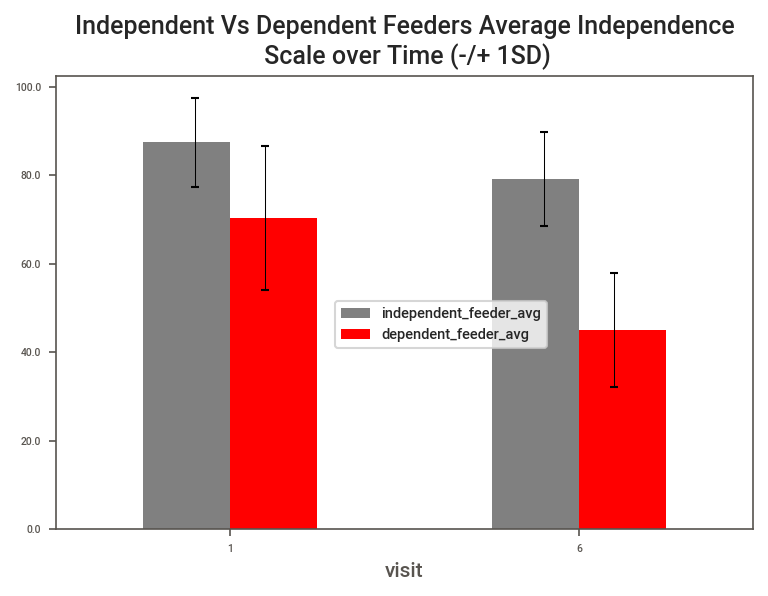

In [45]:
avg = pd.Series(proj.get_columns_with_pattern(can_feed, 'indepscl_vis').mean().round(1),
                name='independent_feeder_avg')
sd = pd.Series(np.std(proj.get_columns_with_pattern(can_feed, 'indepscl_vis'), 
                      ddof=1).round(1),
               name='independent_feeder_std')
can_feed_freq = pd.concat([avg, sd], axis=1)

avg = pd.Series(proj.get_columns_with_pattern(cant_feed, 'indepscl_vis').mean().round(1),
                name='dependent_feeder_avg')
sd = pd.Series(np.std(proj.get_columns_with_pattern(cant_feed, 'indepscl_vis'), 
                       ddof=1).round(1),
               name='dependent_feeder_std')
cant_feed_freq = pd.concat([avg, sd], axis=1)
freq = pd.merge(can_feed_freq, cant_feed_freq, left_index=True, right_index=True)
freq.loc[:, 'visit'] = np.array([1, 6]).astype(str)
display(freq)
avg = freq.drop(list(proj.get_columns_with_pattern(freq, 'std').columns), axis=1)
sd = freq.drop(list(proj.get_columns_with_pattern(freq, 'avg').columns), axis=1)
display(avg, sd)

cmap = {c:'gray' if 'independent_feeder' in c.lower() else 'red' if 'dependent_feeder' in c.lower() else 'gray' for c in avg.columns}
fig, ax1 = plt.subplots(figsize=[6, 4], dpi=150)

proj.plot_errorbars(avg['visit'], avg['independent_feeder_avg'], sd['independent_feeder_std'], axis=ax1)
proj.plot_errorbars(avg['visit'], avg['dependent_feeder_avg'], sd['dependent_feeder_std'], axis=ax1, shift=True)
avg.plot(kind='bar', x='visit', color=cmap, ax=ax1)
proj.adjust_axis(ax1, plot_title="Independent Vs Dependent Feeders Average Independence\n Scale over Time (-/+ 1SD)", title_size=12,
                show_legend_at=[0.4, 0.4])

### Motor Score

W:\MSc-AIDS-UoH\Trimester_3\Submit\project_methods.py:2336: UserWarning:

FixedFormatter should only be used together with FixedLocator

No handles with labels found to put in legend.
W:\MSc-AIDS-UoH\Trimester_3\Submit\project_methods.py:2336: UserWarning:

FixedFormatter should only be used together with FixedLocator

No handles with labels found to put in legend.


{'lower_limit': -65.0,
 'upper_limit': 111.0,
 'n_outliers': 4,
 'outliers': 1309    112.0
 1310    112.0
 1311    116.0
 1312    120.0
 dtype: float64}

{'lower_limit': -65.0,
 'upper_limit': 111.0,
 'n_outliers': 4,
 'outliers': 1309    112.0
 1310    112.0
 1311    116.0
 1312    120.0
 dtype: float64}

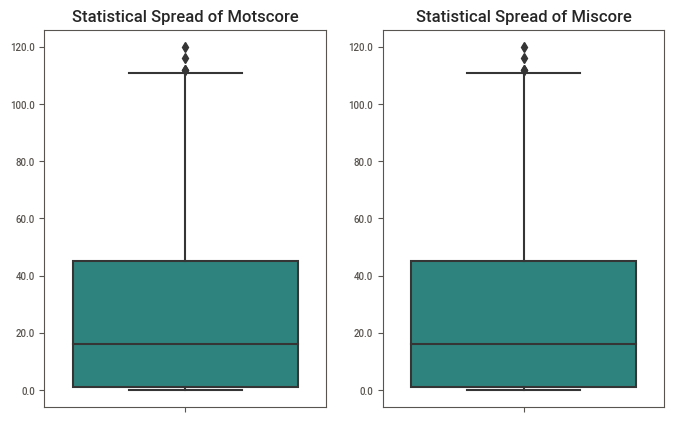

In [46]:
fig, (l, r) = plt.subplots(1, 2, figsize=[8, 5])
proj.plot_box(y=first6_vis['motscore_vis_6'], plot_title="Statistical Spread of Motscore",
             axis=l)
proj.plot_box(y=first6_vis['miscore_vis_6'], plot_title="Statistical Spread of Miscore",
             axis=r)

display(proj.outlier_detection_iqr(first6_vis['motscore_vis_6'], precision=1))
display(proj.outlier_detection_iqr(first6_vis['miscore_vis_6'], precision=1))

#### Motscore

In [47]:
ctl = proj.get_columns_with_pattern(control, 'motscore_vis')
mnf = proj.get_columns_with_pattern(manifest, 'motscore_vis')
display(ctl, mnf)
display(ctl.describe(), mnf.describe())

,motscore_vis_1,motscore_vis_6
0,0.0,0.0
1,0.0,1.0
2,0.0,0.0
3,0.0,0.0
4,0.0,0.0
...,...,...
315,4.0,1.0
316,0.0,0.0
317,0.0,0.0
318,2.0,2.0


,motscore_vis_1,motscore_vis_6
0,28.0,60.0
1,20.0,25.0
2,6.0,9.0
3,45.0,64.0
4,13.0,20.0
...,...,...
541,30.0,33.0
542,16.0,32.0
543,33.0,34.0
544,23.0,19.0


,motscore_vis_1,motscore_vis_6
count,320.00,320.00
mean,1.84,1.57
std,3.64,3.41
min,0.00,0.00
25%,0.00,0.00
50%,0.00,0.00
75%,2.00,2.00
max,28.00,32.00


,motscore_vis_1,motscore_vis_6
count,546.00,546.00
mean,30.55,44.68
std,16.85,22.62
min,0.00,0.00
25%,19.00,28.00
50%,28.00,43.00
75%,40.00,57.80
max,111.00,120.00


,control_avg,control_std,manifest_avg,manifest_std,visit
motscore_vis_1,1.8,3.6,30.6,16.8,1
motscore_vis_6,1.6,3.4,44.7,22.6,6


,control_avg,manifest_avg,visit
motscore_vis_1,1.8,30.6,1
motscore_vis_6,1.6,44.7,6


,control_std,manifest_std,visit
motscore_vis_1,3.6,16.8,1
motscore_vis_6,3.4,22.6,6


W:\MSc-AIDS-UoH\Trimester_3\Submit\project_methods.py:2125: UserWarning:

FixedFormatter should only be used together with FixedLocator



<AxesSubplot:title={'center':'Average Motor Score over Time (-/+ 1SD)'}, xlabel='visit'>

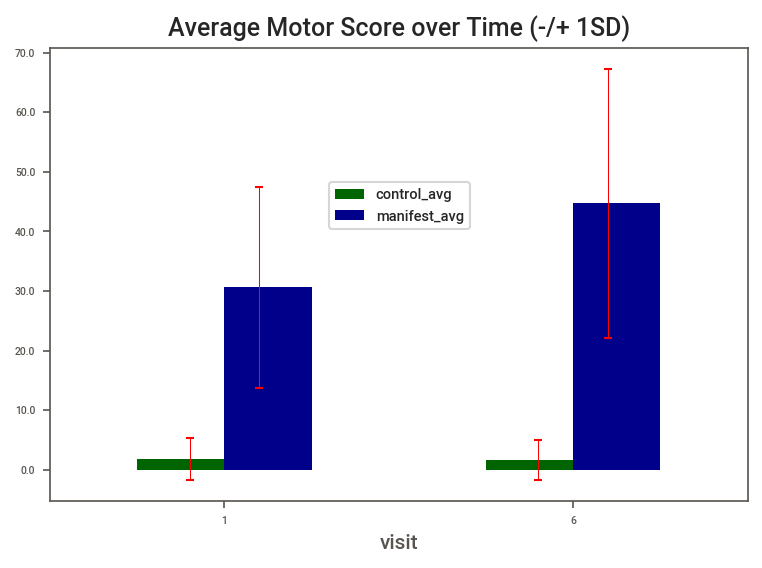

In [48]:
avg = pd.Series(ctl.mean().round(1), name='control_avg')
sd = pd.Series(np.std(ctl, ddof=1).round(1),
               name='control_std')
ctl_freq = pd.concat([avg, sd], axis=1)

avg = pd.Series(mnf.mean().round(1), name='manifest_avg')
sd = pd.Series(np.std(mnf,  ddof=1).round(1), name='manifest_std')
mnf_freq = pd.concat([avg, sd], axis=1)
freq = pd.merge(ctl_freq, mnf_freq, left_index=True, right_index=True)
freq.loc[:, 'visit'] = np.array([1, 6]).astype(str)
display(freq)

avg = freq.drop(list(proj.get_columns_with_pattern(freq, 'std').columns), axis=1)
sd = freq.drop(list(proj.get_columns_with_pattern(freq, 'avg').columns), axis=1)
display(avg, sd)

cmap = {c:'darkgreen' if 'control' in c.lower() else 'darkblue' if 'manifest' in c.lower() else 'gray' for c in avg.columns}
fig, ax1 = plt.subplots(figsize=[6, 4], dpi=150)

proj.plot_errorbars(freq['visit'], freq['control_avg'], freq['control_std'], errbar_color='red', axis=ax1)
proj.plot_errorbars(freq['visit'], freq['manifest_avg'], freq['manifest_std'], errbar_color='red', axis=ax1, shift=True)
avg.plot(kind='bar', x='visit', color=cmap, ax=ax1)
proj.adjust_axis(ax1, plot_title="Average Motor Score over Time (-/+ 1SD)", title_size=12,
                 show_legend_at=[0.4, 0.6])

#### Gender

In [49]:
# male
ctl = proj.get_columns_with_pattern(male_control, 'motscore_vis')
mnf = proj.get_columns_with_pattern(male_manifest, 'motscore_vis')
display(ctl, mnf)
display(ctl.describe(), mnf.describe())

,motscore_vis_1,motscore_vis_6
7,0.0,0.0
20,0.0,1.0
24,0.0,0.0
36,0.0,0.0
45,5.0,6.0
...,...,...
1243,0.0,1.0
1258,0.0,0.0
1292,3.0,6.0
1295,4.0,1.0


,motscore_vis_1,motscore_vis_6
0,28.0,60.0
1,20.0,25.0
3,6.0,9.0
4,45.0,64.0
8,13.0,20.0
...,...,...
1289,66.0,61.0
1290,48.0,54.0
1300,30.0,33.0
1303,16.0,32.0


,motscore_vis_1,motscore_vis_6
count,115.00,115.00
mean,1.96,1.82
std,3.64,4.15
min,0.00,0.00
25%,0.00,0.00
50%,0.00,0.00
75%,2.00,2.00
max,20.00,32.00


,motscore_vis_1,motscore_vis_6
count,286.00,286.00
mean,28.60,42.43
std,15.92,21.20
min,0.00,0.00
25%,17.25,28.00
50%,26.50,42.15
75%,37.00,55.00
max,107.00,103.00


,control_avg,control_std,manifest_avg,manifest_std,visit
motscore_vis_1,2.0,3.6,28.6,15.9,1
motscore_vis_6,1.8,4.2,42.4,21.2,6


,control_avg,manifest_avg,visit
motscore_vis_1,2.0,28.6,1
motscore_vis_6,1.8,42.4,6


,control_std,manifest_std,visit
motscore_vis_1,3.6,15.9,1
motscore_vis_6,4.2,21.2,6


W:\MSc-AIDS-UoH\Trimester_3\Submit\project_methods.py:2125: UserWarning:

FixedFormatter should only be used together with FixedLocator



<AxesSubplot:title={'center':'Male Average Motor Score over Time (-/+ 1SD)'}, xlabel='visit'>

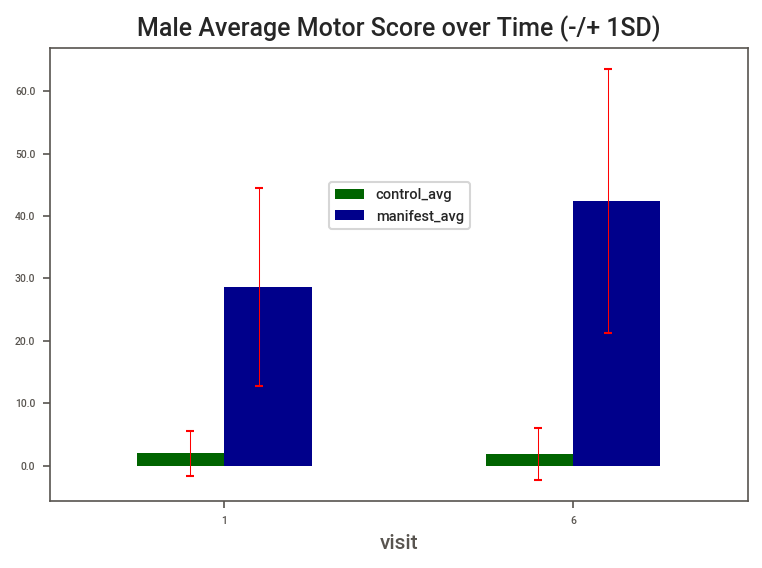

In [50]:
avg = pd.Series(ctl.mean().round(1), name='control_avg')
sd = pd.Series(np.std(ctl, ddof=1).round(1), name='control_std')
ctl_freq = pd.concat([avg, sd], axis=1)

avg = pd.Series(mnf.mean().round(1), name='manifest_avg')
sd = pd.Series(np.std(mnf, ddof=1).round(1), name='manifest_std')
mnf_freq = pd.concat([avg, sd], axis=1)

freq = pd.merge(ctl_freq, mnf_freq, left_index=True, right_index=True)
freq.loc[:, 'visit'] = np.array([1, 6]).astype(str)
display(freq)

avg = freq.drop(list(proj.get_columns_with_pattern(freq, 'std').columns), axis=1)
sd = freq.drop(list(proj.get_columns_with_pattern(freq, 'avg').columns), axis=1)
display(avg, sd)

cmap = {c:'darkgreen' if 'control' in c.lower() else 'darkblue' if 'manifest' in c.lower() else 'gray' for c in avg.columns}
fig, ax1 = plt.subplots(figsize=[6, 4], dpi=150)

proj.plot_errorbars(freq['visit'], freq['control_avg'], freq['control_std'], errbar_color='red', axis=ax1)
proj.plot_errorbars(freq['visit'], freq['manifest_avg'], freq['manifest_std'], errbar_color='red', axis=ax1, shift=True)
avg.plot(kind='bar', x='visit', color=cmap, ax=ax1)
proj.adjust_axis(ax1, plot_title="Male Average Motor Score over Time (-/+ 1SD)", title_size=12,
                 show_legend_at=[0.4, 0.6])

In [51]:
# female
ctl = proj.get_columns_with_pattern(female_control, 'motscore_vis')
mnf = proj.get_columns_with_pattern(female_manifest, 'motscore_vis')
display(ctl, mnf)
display(ctl.describe(), mnf.describe())

,motscore_vis_1,motscore_vis_6
28,0.0,0.0
29,0.0,0.0
33,0.0,0.0
42,0.0,0.0
52,0.0,0.0
...,...,...
1286,2.0,0.0
1294,0.0,1.0
1297,0.0,0.0
1299,0.0,0.0


,motscore_vis_1,motscore_vis_6
15,45.0,81.0
16,45.0,53.0
19,79.0,99.0
27,37.0,52.0
30,8.0,1.0
...,...,...
1293,35.0,109.0
1296,33.0,50.0
1298,27.0,37.0
1306,33.0,34.0


,motscore_vis_1,motscore_vis_6
count,205.00,205.00
mean,1.78,1.43
std,3.65,2.91
min,0.00,0.00
25%,0.00,0.00
50%,0.00,0.00
75%,2.00,1.00
max,28.00,16.00


,motscore_vis_1,motscore_vis_6
count,260.00,260.00
mean,32.71,47.15
std,17.60,23.89
min,3.00,0.00
25%,20.00,28.00
50%,31.50,44.00
75%,43.00,62.25
max,111.00,120.00


,control_avg,control_std,manifest_avg,manifest_std,visit
motscore_vis_1,1.8,3.6,32.7,17.6,1
motscore_vis_6,1.4,2.9,47.2,23.9,6


,control_avg,manifest_avg,visit
motscore_vis_1,1.8,32.7,1
motscore_vis_6,1.4,47.2,6


,control_std,manifest_std,visit
motscore_vis_1,3.6,17.6,1
motscore_vis_6,2.9,23.9,6


W:\MSc-AIDS-UoH\Trimester_3\Submit\project_methods.py:2125: UserWarning:

FixedFormatter should only be used together with FixedLocator



<AxesSubplot:title={'center':'Female Average Motor Score over Time (-/+ 1SD)'}, xlabel='visit'>

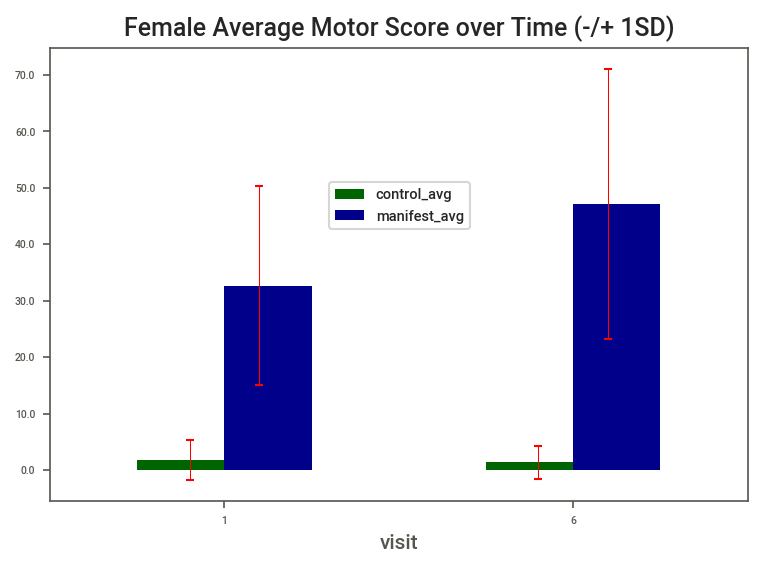

In [52]:
avg = pd.Series(ctl.mean().round(1), name='control_avg')
sd = pd.Series(np.std(ctl, ddof=1).round(1), name='control_std')
ctl_freq = pd.concat([avg, sd], axis=1)

avg = pd.Series(mnf.mean().round(1), name='manifest_avg')
sd = pd.Series(np.std(mnf, ddof=1).round(1), name='manifest_std')
mnf_freq = pd.concat([avg, sd], axis=1)

freq = pd.merge(ctl_freq, mnf_freq, left_index=True, right_index=True)
freq.loc[:, 'visit'] = np.array([1, 6]).astype(str)
display(freq)

avg = freq.drop(list(proj.get_columns_with_pattern(freq, 'std').columns), axis=1)
sd = freq.drop(list(proj.get_columns_with_pattern(freq, 'avg').columns), axis=1)
display(avg, sd)

cmap = {c:'darkgreen' if 'control' in c.lower() else 'darkblue' if 'manifest' in c.lower() else 'gray' for c in avg.columns}
fig, ax1 = plt.subplots(figsize=[6, 4], dpi=150)

proj.plot_errorbars(freq['visit'], freq['control_avg'], freq['control_std'], errbar_color='red', axis=ax1)
proj.plot_errorbars(freq['visit'], freq['manifest_avg'], freq['manifest_std'], errbar_color='red', axis=ax1, shift=True)
avg.plot(kind='bar', x='visit', color=cmap, ax=ax1)
proj.adjust_axis(ax1, plot_title="Female Average Motor Score over Time (-/+ 1SD)", title_size=12,
                 show_legend_at=[0.4, 0.6])

#### CAG repeat extensions

In [53]:
# cag repeat
rp = proj.get_columns_with_pattern(redpen, 'motscore_vis')
fp = proj.get_columns_with_pattern(fulpen, 'motscore_vis')
display(rp, fp)
display(rp.describe(), fp.describe())

,motscore_vis_1,motscore_vis_6
0,7.0,4.0
1,30.0,45.0
2,13.0,12.0
3,31.0,52.0
4,43.0,34.0
5,15.0,12.0
6,51.0,70.0
7,22.0,35.0
8,40.0,76.0
9,42.0,42.0


,motscore_vis_1,motscore_vis_6
0,28.0,60.0
1,20.0,25.0
2,6.0,9.0
3,45.0,64.0
4,13.0,20.0
...,...,...
524,30.0,33.0
525,16.0,32.0
526,33.0,34.0
527,23.0,19.0


,motscore_vis_1,motscore_vis_6
count,17.00,17.00
mean,25.41,34.59
std,14.16,21.77
min,6.00,4.00
25%,13.00,14.00
50%,22.00,34.00
75%,40.00,48.00
max,51.00,76.00


,motscore_vis_1,motscore_vis_6
count,529.00,529.00
mean,30.72,45.01
std,16.91,22.59
min,0.00,0.00
25%,19.00,28.00
50%,28.00,43.00
75%,40.00,58.00
max,111.00,120.00


,reduced_penetrance_avg,reduced_penetrance_std,full_penetrance_avg,full_penetrance_std,visit
motscore_vis_1,25.4,14.2,30.7,16.9,1
motscore_vis_6,34.6,21.8,45.0,22.6,6


,reduced_penetrance_avg,full_penetrance_avg,visit
motscore_vis_1,25.4,30.7,1
motscore_vis_6,34.6,45.0,6


,reduced_penetrance_std,full_penetrance_std,visit
motscore_vis_1,14.2,16.9,1
motscore_vis_6,21.8,22.6,6


W:\MSc-AIDS-UoH\Trimester_3\Submit\project_methods.py:2125: UserWarning:

FixedFormatter should only be used together with FixedLocator



<AxesSubplot:title={'center':'Reduced Vs. Full Penetrance Average Motor Score\n over Time (-/+ 1SD)'}, xlabel='visit'>

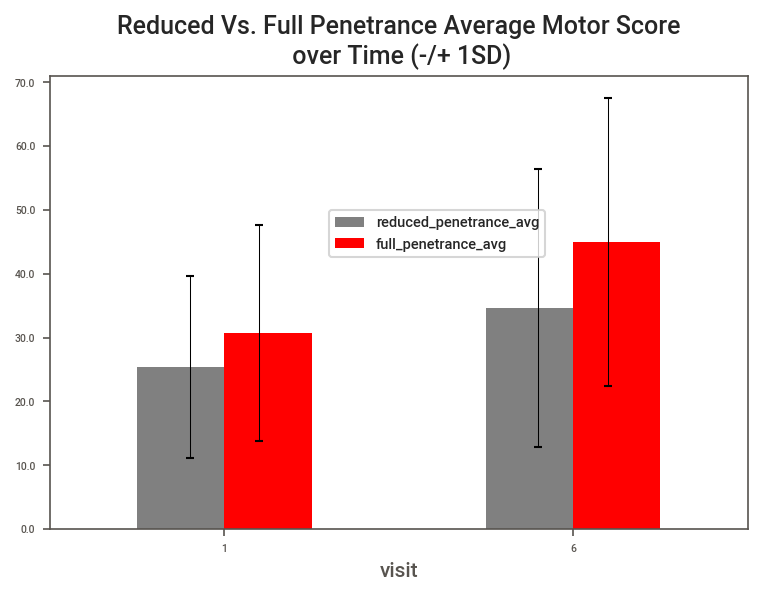

In [54]:
avg = pd.Series(rp.mean().round(1), name='reduced_penetrance_avg')
sd = pd.Series(np.std(rp, ddof=1).round(1), name='reduced_penetrance_std')
rp_freq = pd.concat([avg, sd], axis=1)

avg = pd.Series(fp.mean().round(1), name='full_penetrance_avg')
sd = pd.Series(np.std(fp, ddof=1).round(1), name='full_penetrance_std')
fp_freq = pd.concat([avg, sd], axis=1)

freq = pd.merge(rp_freq, fp_freq, left_index=True, right_index=True)
freq.loc[:, 'visit'] = np.array([1, 6]).astype(str)
display(freq)

avg = freq.drop(list(proj.get_columns_with_pattern(freq, 'std').columns), axis=1)
sd = freq.drop(list(proj.get_columns_with_pattern(freq, 'avg').columns), axis=1)
display(avg, sd)

cmap = {c:'gray' if 'reduced_penetrance' in c.lower() else 'red' if 'full_penetrance' in c.lower() else 'gray' for c in avg.columns}
fig, ax1 = plt.subplots(figsize=[6, 4], dpi=150)

proj.plot_errorbars(freq['visit'], freq['reduced_penetrance_avg'], freq['reduced_penetrance_std'], axis=ax1)
proj.plot_errorbars(freq['visit'], freq['full_penetrance_avg'], freq['full_penetrance_std'], axis=ax1, shift=True)
avg.plot(kind='bar', x='visit', color=cmap, ax=ax1)
proj.adjust_axis(ax1, plot_title="Reduced Vs. Full Penetrance Average Motor Score\n over Time (-/+ 1SD)", title_size=12,
                 show_legend_at=[0.4, 0.6])

### BMI & Motor Score

In [55]:
# baseline
cols = ['bmi_level_vis_6', 'motscore_vis_1',]
ctl = proj.get_columns_with_pattern(control, cols)
mnf = proj.get_columns_with_pattern(manifest, cols)
display(ctl, mnf)
display(ctl.describe(include='all'), mnf.describe(include='all'))

ctl_avg = ctl.groupby(cols[0]).mean().round(1).rename(columns={cols[-1]:'control_avg'})
ctl_std = ctl.groupby(cols[0]).std().round(1).rename(columns={cols[-1]:'control_std'})
ctl = pd.merge(ctl_avg, ctl_std, left_index=True, right_index=True)

mnf_avg = mnf.groupby(cols[0]).mean().round(1).rename(columns={cols[-1]:'manifest_avg'})
mnf_std = mnf.groupby(cols[0]).std().round(1).rename(columns={cols[-1]:'manifest_std'})
mnf = pd.merge(mnf_avg, mnf_std, left_index=True, right_index=True)

v1 = pd.merge(ctl, mnf, left_index=True, right_index=True)
display(v1)

,bmi_level_vis_6,motscore_vis_1
0,3. obese,0.0
1,3. obese,0.0
2,2. overweight,0.0
3,0. underweight,0.0
4,1. normal,0.0
...,...,...
315,2. overweight,4.0
316,1. normal,0.0
317,2. overweight,0.0
318,3. obese,2.0


,bmi_level_vis_6,motscore_vis_1
0,0. underweight,28.0
1,1. normal,20.0
2,1. normal,6.0
3,1. normal,45.0
4,1. normal,13.0
...,...,...
541,2. overweight,30.0
542,2. overweight,16.0
543,3. obese,33.0
544,3. obese,23.0


,bmi_level_vis_6,motscore_vis_1
count,320,320.00
unique,5,NaN
top,2. overweight,NaN
freq,103,NaN
mean,NaN,1.84
std,NaN,3.64
min,NaN,0.00
25%,NaN,0.00
50%,NaN,0.00
75%,NaN,2.00


,bmi_level_vis_6,motscore_vis_1
count,546,546.00
unique,5,NaN
top,1. normal,NaN
freq,268,NaN
mean,NaN,30.55
std,NaN,16.85
min,NaN,0.00
25%,NaN,19.00
50%,NaN,28.00
75%,NaN,40.00


,control_avg,control_std,manifest_avg,manifest_std
bmi_level_vis_6,,,,
0. underweight,2.7,4.6,40.8,21.7
1. normal,1.0,1.9,30.9,15.3
2. overweight,2.0,4.2,30.1,18.3
3. obese,2.3,3.8,27.4,16.0
4. severely obese,2.1,4.4,22.8,11.2


In [56]:
# visit 6
cols = ['bmi_level_vis_6', 'motscore_vis_6',]
ctl = proj.get_columns_with_pattern(control, cols)
mnf = proj.get_columns_with_pattern(manifest, cols)
display(ctl, mnf)
display(ctl.describe(include='all'), mnf.describe(include='all'))

ctl_avg = ctl.groupby(cols[0]).mean().round(1).rename(columns={cols[-1]:'control_avg'})
ctl_std = ctl.groupby(cols[0]).std().round(1).rename(columns={cols[-1]:'control_std'})
ctl = pd.merge(ctl_avg, ctl_std, left_index=True, right_index=True)

mnf_avg = mnf.groupby(cols[0]).mean().round(1).rename(columns={cols[-1]:'manifest_avg'})
mnf_std = mnf.groupby(cols[0]).std().round(1).rename(columns={cols[-1]:'manifest_std'})
mnf = pd.merge(mnf_avg, mnf_std, left_index=True, right_index=True)

v6 = pd.merge(ctl, mnf, left_index=True, right_index=True)
display(v6)

,bmi_level_vis_6,motscore_vis_6
0,3. obese,0.0
1,3. obese,1.0
2,2. overweight,0.0
3,0. underweight,0.0
4,1. normal,0.0
...,...,...
315,2. overweight,1.0
316,1. normal,0.0
317,2. overweight,0.0
318,3. obese,2.0


,bmi_level_vis_6,motscore_vis_6
0,0. underweight,60.0
1,1. normal,25.0
2,1. normal,9.0
3,1. normal,64.0
4,1. normal,20.0
...,...,...
541,2. overweight,33.0
542,2. overweight,32.0
543,3. obese,34.0
544,3. obese,19.0


,bmi_level_vis_6,motscore_vis_6
count,320,320.00
unique,5,NaN
top,2. overweight,NaN
freq,103,NaN
mean,NaN,1.57
std,NaN,3.41
min,NaN,0.00
25%,NaN,0.00
50%,NaN,0.00
75%,NaN,2.00


,bmi_level_vis_6,motscore_vis_6
count,546,546.00
unique,5,NaN
top,1. normal,NaN
freq,268,NaN
mean,NaN,44.68
std,NaN,22.62
min,NaN,0.00
25%,NaN,28.00
50%,NaN,43.00
75%,NaN,57.80


,control_avg,control_std,manifest_avg,manifest_std
bmi_level_vis_6,,,,
0. underweight,3.0,5.2,57.5,25.4
1. normal,1.2,2.4,46.3,23.5
2. overweight,1.8,4.5,43.2,21.2
3. obese,1.6,2.9,39.0,19.6
4. severely obese,1.5,3.0,32.5,16.8


W:\MSc-AIDS-UoH\Trimester_3\Submit\project_methods.py:2125: UserWarning:

FixedFormatter should only be used together with FixedLocator

W:\MSc-AIDS-UoH\Trimester_3\Submit\project_methods.py:2125: UserWarning:

FixedFormatter should only be used together with FixedLocator



<AxesSubplot:title={'center':'Average Motor Score & Sixth BMI\n (+/- 1SD)'}, xlabel=' ', ylabel='Mean Motor score'>

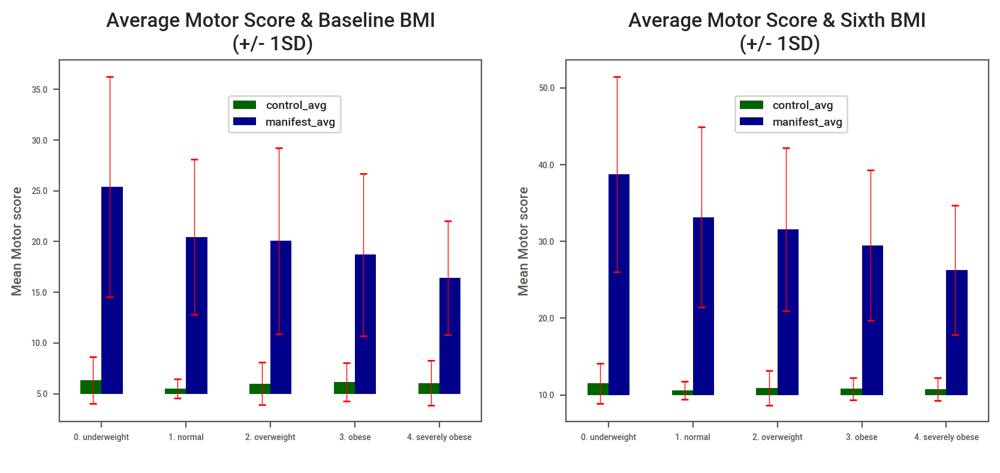

In [57]:
cmap = {c:'darkgreen' if 'control' in c.lower() else 'darkblue' if 'manifest' in c.lower() else 'gray' for c in v1.columns}
fig, (l, r) = plt.subplots(1, 2, figsize=[10, 4], dpi=200)

# visit 1
v1.loc[:, ['control_avg', 'manifest_avg']].plot(kind='bar', color=cmap, ax=l)
proj.adjust_axis(l, plot_title="Average Motor Score & Baseline BMI\n (+/- 1SD)", x_labe=' ', y_labe='Mean Motor score', 
                show_legend_at=[0.4, 0.8])
proj.plot_errorbars(x=v1.index, y=v1['control_avg'], yerror=v1['control_std'], errbar_color='red', axis=l)
proj.plot_errorbars(x=v1.index, y=v1['manifest_avg'], yerror=v1['manifest_std'], errbar_color='red', axis=l, shift=True)

# visit 6
v6.loc[:, ['control_avg', 'manifest_avg']].plot(kind='bar', color=cmap, ax=r)
proj.adjust_axis(r, plot_title="Average Motor Score & Sixth BMI\n (+/- 1SD)", x_labe=' ',  y_labe='Mean Motor score', 
                show_legend_at=[0.4, 0.8])
proj.plot_errorbars(x=v6.index, y=v6['control_avg'], yerror=v6['control_std'], errbar_color='red', axis=r)
proj.plot_errorbars(x=v6.index, y=v6['manifest_avg'], yerror=v6['manifest_std'], errbar_color='red', axis=r, shift=True)

#### BMI change: Increase Vs. Decrease

In [58]:
# baseline
cols = ['v1v6_bmi_change', 'motscore_vis_1',]
ctl = proj.get_columns_with_pattern(control, cols)
mnf = proj.get_columns_with_pattern(manifest, cols)
display(ctl, mnf)
display(ctl.describe(include='all'), mnf.describe(include='all'))

ctl_avg = ctl.groupby(cols[0]).mean().round(1).rename(columns={cols[-1]:'control_avg'})
ctl_std = ctl.groupby(cols[0]).std().round(1).rename(columns={cols[-1]:'control_std'})
ctl = pd.merge(ctl_avg, ctl_std, left_index=True, right_index=True)

mnf_avg = mnf.groupby(cols[0]).mean().round(1).rename(columns={cols[-1]:'manifest_avg'})
mnf_std = mnf.groupby(cols[0]).std().round(1).rename(columns={cols[-1]:'manifest_std'})
mnf = pd.merge(mnf_avg, mnf_std, left_index=True, right_index=True)

v1 = pd.merge(ctl, mnf, left_index=True, right_index=True)
display(v1)

,v1v6_bmi_change,motscore_vis_1
0,1. increase,0.0
1,1. increase,0.0
2,1. increase,0.0
3,-1. decrease,0.0
4,1. increase,0.0
...,...,...
315,1. increase,4.0
316,1. increase,0.0
317,1. increase,0.0
318,1. increase,2.0


,v1v6_bmi_change,motscore_vis_1
0,-1. decrease,28.0
1,-1. decrease,20.0
2,1. increase,6.0
3,-1. decrease,45.0
4,-1. decrease,13.0
...,...,...
541,1. increase,30.0
542,-1. decrease,16.0
543,0. no change,33.0
544,1. increase,23.0


,v1v6_bmi_change,motscore_vis_1
count,320,320.00
unique,3,NaN
top,1. increase,NaN
freq,173,NaN
mean,NaN,1.84
std,NaN,3.64
min,NaN,0.00
25%,NaN,0.00
50%,NaN,0.00
75%,NaN,2.00


,v1v6_bmi_change,motscore_vis_1
count,546,546.00
unique,3,NaN
top,-1. decrease,NaN
freq,279,NaN
mean,NaN,30.55
std,NaN,16.85
min,NaN,0.00
25%,NaN,19.00
50%,NaN,28.00
75%,NaN,40.00


,control_avg,control_std,manifest_avg,manifest_std
v1v6_bmi_change,,,,
-1. decrease,1.6,2.5,30.1,16.5
0. no change,3.4,5.5,40.0,23.8
1. increase,1.8,4.1,29.5,15.3


In [59]:
# visit 6
cols = ['v1v6_bmi_change', 'motscore_vis_6',]
ctl = proj.get_columns_with_pattern(control, cols)
mnf = proj.get_columns_with_pattern(manifest, cols)
display(ctl, mnf)
display(ctl.describe(include='all'), mnf.describe(include='all'))

ctl_avg = ctl.groupby(cols[0]).mean().round(1).rename(columns={cols[-1]:'control_avg'})
ctl_std = ctl.groupby(cols[0]).std().round(1).rename(columns={cols[-1]:'control_std'})
ctl = pd.merge(ctl_avg, ctl_std, left_index=True, right_index=True)

mnf_avg = mnf.groupby(cols[0]).mean().round(1).rename(columns={cols[-1]:'manifest_avg'})
mnf_std = mnf.groupby(cols[0]).std().round(1).rename(columns={cols[-1]:'manifest_std'})
mnf = pd.merge(mnf_avg, mnf_std, left_index=True, right_index=True)

v6 = pd.merge(ctl, mnf, left_index=True, right_index=True)
display(v6)

,v1v6_bmi_change,motscore_vis_6
0,1. increase,0.0
1,1. increase,1.0
2,1. increase,0.0
3,-1. decrease,0.0
4,1. increase,0.0
...,...,...
315,1. increase,1.0
316,1. increase,0.0
317,1. increase,0.0
318,1. increase,2.0


,v1v6_bmi_change,motscore_vis_6
0,-1. decrease,60.0
1,-1. decrease,25.0
2,1. increase,9.0
3,-1. decrease,64.0
4,-1. decrease,20.0
...,...,...
541,1. increase,33.0
542,-1. decrease,32.0
543,0. no change,34.0
544,1. increase,19.0


,v1v6_bmi_change,motscore_vis_6
count,320,320.00
unique,3,NaN
top,1. increase,NaN
freq,173,NaN
mean,NaN,1.57
std,NaN,3.41
min,NaN,0.00
25%,NaN,0.00
50%,NaN,0.00
75%,NaN,2.00


,v1v6_bmi_change,motscore_vis_6
count,546,546.00
unique,3,NaN
top,-1. decrease,NaN
freq,279,NaN
mean,NaN,44.68
std,NaN,22.62
min,NaN,0.00
25%,NaN,28.00
50%,NaN,43.00
75%,NaN,57.80


,control_avg,control_std,manifest_avg,manifest_std
v1v6_bmi_change,,,,
-1. decrease,2.3,4.5,45.5,22.7
0. no change,1.7,3.1,48.2,25.4
1. increase,1.0,2.2,43.0,22.0


W:\MSc-AIDS-UoH\Trimester_3\Submit\project_methods.py:2125: UserWarning:

FixedFormatter should only be used together with FixedLocator

W:\MSc-AIDS-UoH\Trimester_3\Submit\project_methods.py:2125: UserWarning:

FixedFormatter should only be used together with FixedLocator



<AxesSubplot:title={'center':'Average Motor Score & Sixth BMI Changge'}, xlabel=' ', ylabel='Mean Motor score'>

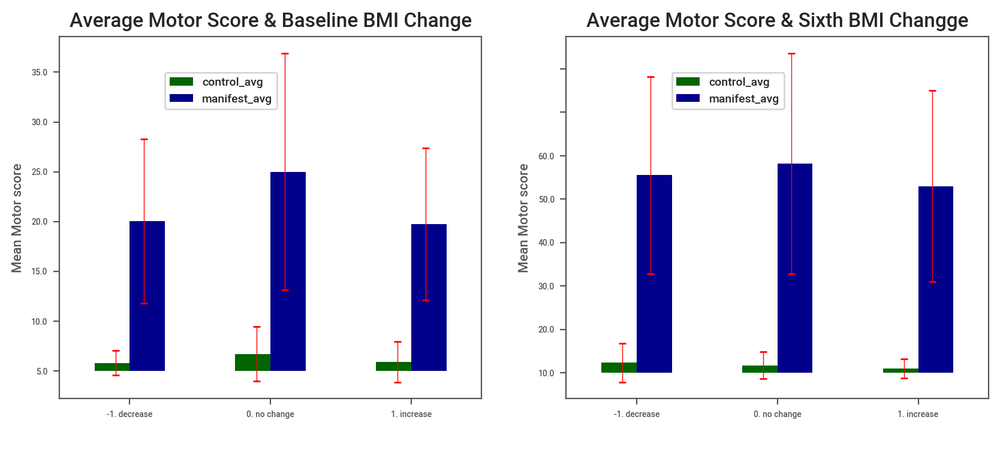

In [60]:
cmap = {c:'darkgreen' if 'control' in c.lower() else 'darkblue' if 'manifest' in c.lower() else 'gray' for c in v1.columns}
fig, (l, r) = plt.subplots(1, 2, figsize=[10, 4], dpi=200)

# visit 1
v1.loc[:, ['control_avg', 'manifest_avg']].plot(kind='bar', color=cmap, ax=l)
proj.adjust_axis(l, plot_title="Average Motor Score & Baseline BMI Change", x_labe=' ', y_labe='Mean Motor score', 
                show_legend_at=[0.25, 0.8])
proj.plot_errorbars(x=v1.index, y=v1['control_avg'], yerror=v1['control_std'], errbar_color='red', axis=l)
proj.plot_errorbars(x=v1.index, y=v1['manifest_avg'], yerror=v1['manifest_std'], errbar_color='red', axis=l, shift=True)

# visit 6
v6.loc[:, ['control_avg', 'manifest_avg']].plot(kind='bar', color=cmap, ax=r)
proj.adjust_axis(r, plot_title="Average Motor Score & Sixth BMI Changge", x_labe=' ',  y_labe='Mean Motor score', 
                show_legend_at=[0.25, 0.8])
proj.plot_errorbars(x=v6.index, y=v6['control_avg'], yerror=v6['control_std'], errbar_color='red', axis=r)
proj.plot_errorbars(x=v6.index, y=v6['manifest_avg'], yerror=v6['manifest_std'], errbar_color='red', axis=r, shift=True)

#### Eating Independently at last follow-up

In [61]:
display(proj.get_columns_with_pattern(first6_vis, 'feed'))

cond = (manifest['independent_feeding_vis_6'] == 1)
can_feed = manifest.loc[cond]
cond = (manifest['independent_feeding_vis_6'] == 0)
cant_feed = manifest.loc[cond]
display(len(can_feed), len(cant_feed))

,feedself_vis_1,feedself_vis_6,independent_feeding_vis_1,independent_feeding_vis_6
0,1.0,0.0,1.0,1.0
1,1.0,1.0,1.0,1.0
2,0.0,0.0,0.0,0.0
3,1.0,1.0,1.0,1.0
4,1.0,0.0,1.0,0.0
...,...,...,...,...
1308,1.0,1.0,1.0,1.0
1309,1.0,1.0,1.0,1.0
1310,1.0,1.0,1.0,1.0
1311,1.0,1.0,1.0,1.0


397

146

,independent_feeder_avg,independent_feeder_std,dependent_feeder_avg,dependent_feeder_std,visit
motscore_vis_1,25.0,12.9,45.4,17.4,1
motscore_vis_6,36.2,17.2,67.6,19.8,6


,independent_feeder_avg,dependent_feeder_avg,visit
motscore_vis_1,25.0,45.4,1
motscore_vis_6,36.2,67.6,6


,independent_feeder_std,dependent_feeder_std,visit
motscore_vis_1,12.9,17.4,1
motscore_vis_6,17.2,19.8,6


W:\MSc-AIDS-UoH\Trimester_3\Submit\project_methods.py:2125: UserWarning:

FixedFormatter should only be used together with FixedLocator



<AxesSubplot:title={'center':'Independent Vs Dependent Feeders Average Motor\n Score over Time (-/+ 1SD)'}, xlabel='visit'>

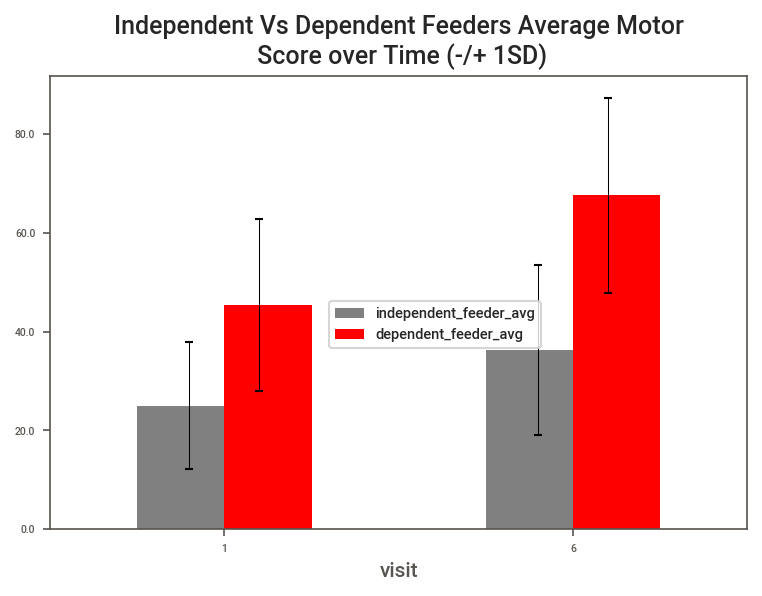

In [62]:
avg = pd.Series(proj.get_columns_with_pattern(can_feed, 'motscore_vis').mean().round(1),
                name='independent_feeder_avg')
sd = pd.Series(np.std(proj.get_columns_with_pattern(can_feed, 'motscore_vis'), 
                      ddof=1).round(1),
               name='independent_feeder_std')
can_feed_freq = pd.concat([avg, sd], axis=1)

avg = pd.Series(proj.get_columns_with_pattern(cant_feed, 'motscore_vis').mean().round(1),
                name='dependent_feeder_avg')
sd = pd.Series(np.std(proj.get_columns_with_pattern(cant_feed, 'motscore_vis'), 
                       ddof=1).round(1),
               name='dependent_feeder_std')
cant_feed_freq = pd.concat([avg, sd], axis=1)
freq = pd.merge(can_feed_freq, cant_feed_freq, left_index=True, right_index=True)
freq.loc[:, 'visit'] = np.array([1, 6]).astype(str)
display(freq)
avg = freq.drop(list(proj.get_columns_with_pattern(freq, 'std').columns), axis=1)
sd = freq.drop(list(proj.get_columns_with_pattern(freq, 'avg').columns), axis=1)
display(avg, sd)

cmap = {c:'gray' if 'independent_feeder' in c.lower() else 'red' if 'dependent_feeder' in c.lower() else 'gray' for c in avg.columns}
fig, ax1 = plt.subplots(figsize=[6, 4], dpi=150)

proj.plot_errorbars(avg['visit'], avg['independent_feeder_avg'], sd['independent_feeder_std'], axis=ax1)
proj.plot_errorbars(avg['visit'], avg['dependent_feeder_avg'], sd['dependent_feeder_std'], axis=ax1, shift=True)
avg.plot(kind='bar', x='visit', color=cmap, ax=ax1)
proj.adjust_axis(ax1, plot_title="Independent Vs Dependent Feeders Average Motor\n Score over Time (-/+ 1SD)", title_size=12,
                show_legend_at=[0.4, 0.4])

### Total Functional Capacity Score

{'lower_limit': -2.0,
 'upper_limit': 22.0,
 'n_outliers': 0,
 'outliers': Series([], dtype: object)}

W:\MSc-AIDS-UoH\Trimester_3\Submit\project_methods.py:2336: UserWarning:

FixedFormatter should only be used together with FixedLocator

No handles with labels found to put in legend.


<AxesSubplot:title={'center':'Statistical Spread of Tfcscore'}>

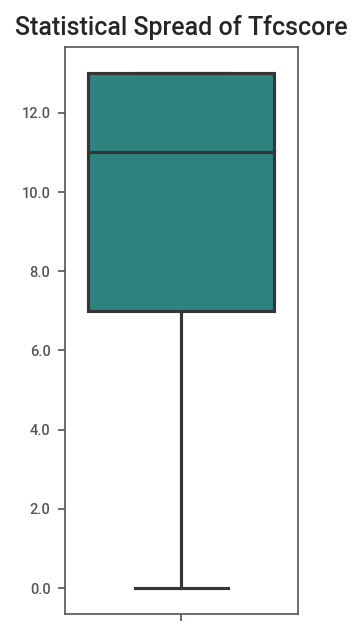

In [63]:
display(proj.outlier_detection_iqr(first6_vis['tfcscore_vis_6'], precision=1))

fig, ax1 = plt.subplots(figsize=[2, 5], dpi=150)
proj.plot_box(y=first6_vis['tfcscore_vis_6'], plot_title="Statistical Spread of Tfcscore",
             axis=ax1)

#### Tfcscore

In [64]:
ctl = proj.get_columns_with_pattern(control, 'tfcscore_vis')
mnf = proj.get_columns_with_pattern(manifest, 'tfcscore_vis')
display(ctl, mnf)
display(ctl.describe(), mnf.describe())

,tfcscore_vis_1,tfcscore_vis_6
0,13.0,13.0
1,13.0,13.0
2,13.0,13.0
3,13.0,13.0
4,13.0,13.0
...,...,...
315,13.0,11.0
316,13.0,13.0
317,13.0,13.0
318,13.0,13.0


,tfcscore_vis_1,tfcscore_vis_6
0,11.0,6.0
1,13.0,9.0
2,12.0,8.0
3,8.0,1.0
4,12.0,11.0
...,...,...
541,9.0,11.0
542,5.0,6.0
543,13.0,11.0
544,12.0,11.0


,tfcscore_vis_1,tfcscore_vis_6
count,320.00,320.00
mean,12.88,12.84
std,0.47,0.73
min,9.00,6.00
25%,13.00,13.00
50%,13.00,13.00
75%,13.00,13.00
max,13.00,13.00


,tfcscore_vis_1,tfcscore_vis_6
count,546.00,546.00
mean,9.29,6.85
std,2.97,3.50
min,0.00,0.00
25%,7.00,4.00
50%,10.00,7.00
75%,12.00,10.00
max,13.00,13.00


,control_avg,control_std,manifest_avg,manifest_std,visit
tfcscore_vis_1,12.9,0.5,9.3,3.0,1
tfcscore_vis_6,12.8,0.7,6.9,3.5,6


,control_avg,manifest_avg,visit
tfcscore_vis_1,12.9,9.3,1
tfcscore_vis_6,12.8,6.9,6


,control_std,manifest_std,visit
tfcscore_vis_1,0.5,3.0,1
tfcscore_vis_6,0.7,3.5,6


W:\MSc-AIDS-UoH\Trimester_3\Submit\project_methods.py:2125: UserWarning:

FixedFormatter should only be used together with FixedLocator



<AxesSubplot:title={'center':'Average Total Functional Capacity Score over Time (-/+ 1SD)'}, xlabel='visit'>

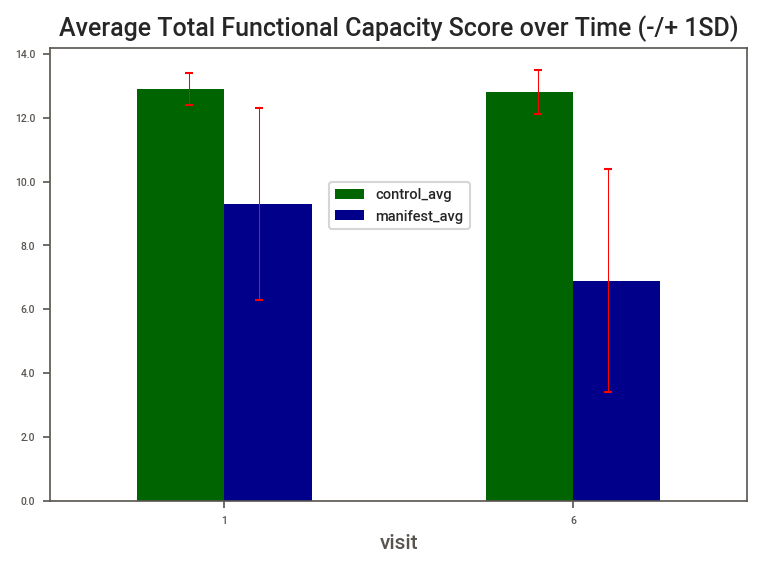

In [65]:
avg = pd.Series(ctl.mean().round(1), name='control_avg')
sd = pd.Series(np.std(ctl, ddof=1).round(1),
               name='control_std')
ctl_freq = pd.concat([avg, sd], axis=1)

avg = pd.Series(mnf.mean().round(1), name='manifest_avg')
sd = pd.Series(np.std(mnf,  ddof=1).round(1), name='manifest_std')
mnf_freq = pd.concat([avg, sd], axis=1)
freq = pd.merge(ctl_freq, mnf_freq, left_index=True, right_index=True)
freq.loc[:, 'visit'] = np.array([1, 6]).astype(str)
display(freq)

avg = freq.drop(list(proj.get_columns_with_pattern(freq, 'std').columns), axis=1)
sd = freq.drop(list(proj.get_columns_with_pattern(freq, 'avg').columns), axis=1)
display(avg, sd)

cmap = {c:'darkgreen' if 'control' in c.lower() else 'darkblue' if 'manifest' in c.lower() else 'gray' for c in avg.columns}
fig, ax1 = plt.subplots(figsize=[6, 4], dpi=150)

proj.plot_errorbars(freq['visit'], freq['control_avg'], freq['control_std'], errbar_color='red', axis=ax1)
proj.plot_errorbars(freq['visit'], freq['manifest_avg'], freq['manifest_std'], errbar_color='red', axis=ax1, shift=True)
avg.plot(kind='bar', x='visit', color=cmap, ax=ax1)
proj.adjust_axis(ax1, plot_title="Average Total Functional Capacity Score over Time (-/+ 1SD)", title_size=12,
                 show_legend_at=[0.4, 0.6])

#### Gender

In [66]:
# male
ctl = proj.get_columns_with_pattern(male_control, 'tfcscore_vis')
mnf = proj.get_columns_with_pattern(male_manifest, 'tfcscore_vis')
display(ctl, mnf)
display(ctl.describe(), mnf.describe())

,tfcscore_vis_1,tfcscore_vis_6
7,13.0,13.0
20,13.0,13.0
24,13.0,13.0
36,13.0,13.0
45,13.0,13.0
...,...,...
1243,13.0,13.0
1258,13.0,13.0
1292,13.0,13.0
1295,13.0,11.0


,tfcscore_vis_1,tfcscore_vis_6
0,11.0,6.0
1,13.0,9.0
3,12.0,8.0
4,8.0,1.0
8,12.0,11.0
...,...,...
1289,9.0,8.0
1290,9.0,8.0
1300,9.0,11.0
1303,5.0,6.0


,tfcscore_vis_1,tfcscore_vis_6
count,115.00,115.00
mean,12.83,12.86
std,0.57,0.78
min,10.00,6.00
25%,13.00,13.00
50%,13.00,13.00
75%,13.00,13.00
max,13.00,13.00


,tfcscore_vis_1,tfcscore_vis_6
count,286.00,286.00
mean,9.53,7.16
std,2.83,3.36
min,0.00,0.00
25%,8.00,5.00
50%,10.00,7.00
75%,12.00,10.00
max,13.00,13.00


,control_avg,control_std,manifest_avg,manifest_std,visit
tfcscore_vis_1,12.8,0.6,9.5,2.8,1
tfcscore_vis_6,12.9,0.8,7.2,3.4,6


,control_avg,manifest_avg,visit
tfcscore_vis_1,12.8,9.5,1
tfcscore_vis_6,12.9,7.2,6


,control_std,manifest_std,visit
tfcscore_vis_1,0.6,2.8,1
tfcscore_vis_6,0.8,3.4,6


W:\MSc-AIDS-UoH\Trimester_3\Submit\project_methods.py:2125: UserWarning:

FixedFormatter should only be used together with FixedLocator



<AxesSubplot:title={'center':'Male Average Total Functional Capacity\n Score over Time (-/+ 1SD)'}, xlabel='visit'>

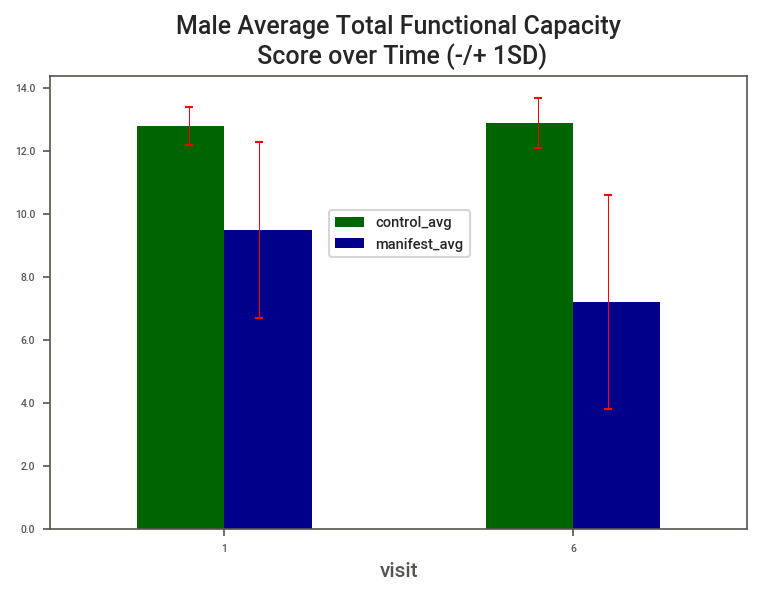

In [67]:
avg = pd.Series(ctl.mean().round(1), name='control_avg')
sd = pd.Series(np.std(ctl, ddof=1).round(1), name='control_std')
ctl_freq = pd.concat([avg, sd], axis=1)

avg = pd.Series(mnf.mean().round(1), name='manifest_avg')
sd = pd.Series(np.std(mnf, ddof=1).round(1), name='manifest_std')
mnf_freq = pd.concat([avg, sd], axis=1)

freq = pd.merge(ctl_freq, mnf_freq, left_index=True, right_index=True)
freq.loc[:, 'visit'] = np.array([1, 6]).astype(str)
display(freq)

avg = freq.drop(list(proj.get_columns_with_pattern(freq, 'std').columns), axis=1)
sd = freq.drop(list(proj.get_columns_with_pattern(freq, 'avg').columns), axis=1)
display(avg, sd)

cmap = {c:'darkgreen' if 'control' in c.lower() else 'darkblue' if 'manifest' in c.lower() else 'gray' for c in avg.columns}
fig, ax1 = plt.subplots(figsize=[6, 4], dpi=150)

proj.plot_errorbars(freq['visit'], freq['control_avg'], freq['control_std'], errbar_color='red', axis=ax1)
proj.plot_errorbars(freq['visit'], freq['manifest_avg'], freq['manifest_std'], errbar_color='red', axis=ax1, shift=True)
avg.plot(kind='bar', x='visit', color=cmap, ax=ax1)
proj.adjust_axis(ax1, plot_title="Male Average Total Functional Capacity\n Score over Time (-/+ 1SD)", title_size=12,
                 show_legend_at=[0.4, 0.6])

In [68]:
# female
ctl = proj.get_columns_with_pattern(female_control, 'tfcscore_vis')
mnf = proj.get_columns_with_pattern(female_manifest, 'tfcscore_vis')
display(ctl, mnf)
display(ctl.describe(), mnf.describe())

,tfcscore_vis_1,tfcscore_vis_6
28,13.0,13.0
29,13.0,13.0
33,13.0,13.0
42,13.0,13.0
52,13.0,13.0
...,...,...
1286,13.0,13.0
1294,13.0,12.0
1297,13.0,13.0
1299,13.0,13.0


,tfcscore_vis_1,tfcscore_vis_6
15,9.0,6.0
16,5.0,2.0
19,3.0,1.0
27,6.0,5.0
30,11.0,11.0
...,...,...
1293,7.0,0.0
1296,2.0,3.0
1298,11.0,11.0
1306,13.0,11.0


,tfcscore_vis_1,tfcscore_vis_6
count,205.00,205.00
mean,12.92,12.82
std,0.41,0.70
min,9.00,8.00
25%,13.00,13.00
50%,13.00,13.00
75%,13.00,13.00
max,13.00,13.00


,tfcscore_vis_1,tfcscore_vis_6
count,260.00,260.00
mean,9.02,6.52
std,3.10,3.62
min,0.00,0.00
25%,7.00,4.00
50%,9.00,7.00
75%,12.00,9.00
max,13.00,13.00


,control_avg,control_std,manifest_avg,manifest_std,visit
tfcscore_vis_1,12.9,0.4,9.0,3.1,1
tfcscore_vis_6,12.8,0.7,6.5,3.6,6


,control_avg,manifest_avg,visit
tfcscore_vis_1,12.9,9.0,1
tfcscore_vis_6,12.8,6.5,6


,control_std,manifest_std,visit
tfcscore_vis_1,0.4,3.1,1
tfcscore_vis_6,0.7,3.6,6


W:\MSc-AIDS-UoH\Trimester_3\Submit\project_methods.py:2125: UserWarning:

FixedFormatter should only be used together with FixedLocator



<AxesSubplot:title={'center':'Female Average Total Functional Capacity\n Score over Time (-/+ 1SD)'}, xlabel='visit'>

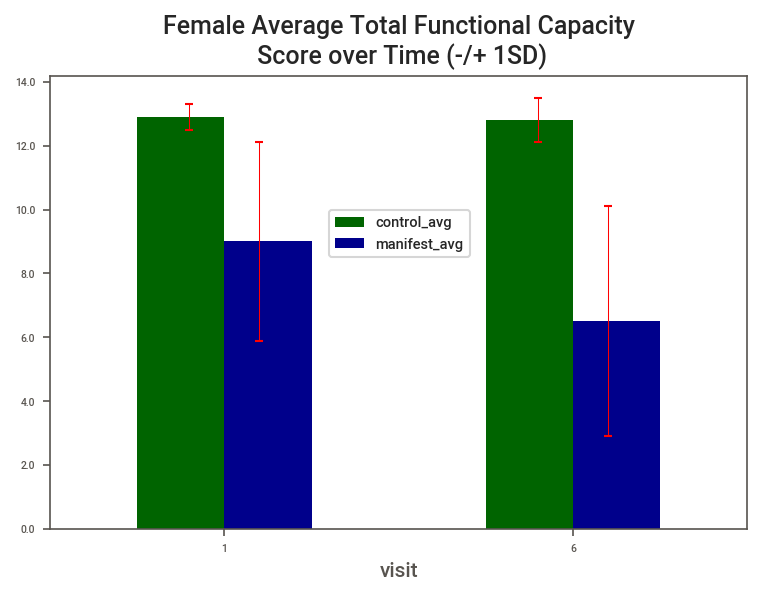

In [69]:
avg = pd.Series(ctl.mean().round(1), name='control_avg')
sd = pd.Series(np.std(ctl, ddof=1).round(1), name='control_std')
ctl_freq = pd.concat([avg, sd], axis=1)

avg = pd.Series(mnf.mean().round(1), name='manifest_avg')
sd = pd.Series(np.std(mnf, ddof=1).round(1), name='manifest_std')
mnf_freq = pd.concat([avg, sd], axis=1)

freq = pd.merge(ctl_freq, mnf_freq, left_index=True, right_index=True)
freq.loc[:, 'visit'] = np.array([1, 6]).astype(str)
display(freq)

avg = freq.drop(list(proj.get_columns_with_pattern(freq, 'std').columns), axis=1)
sd = freq.drop(list(proj.get_columns_with_pattern(freq, 'avg').columns), axis=1)
display(avg, sd)

cmap = {c:'darkgreen' if 'control' in c.lower() else 'darkblue' if 'manifest' in c.lower() else 'gray' for c in avg.columns}
fig, ax1 = plt.subplots(figsize=[6, 4], dpi=150)

proj.plot_errorbars(freq['visit'], freq['control_avg'], freq['control_std'], errbar_color='red', axis=ax1)
proj.plot_errorbars(freq['visit'], freq['manifest_avg'], freq['manifest_std'], errbar_color='red', axis=ax1, shift=True)
avg.plot(kind='bar', x='visit', color=cmap, ax=ax1)
proj.adjust_axis(ax1, plot_title="Female Average Total Functional Capacity\n Score over Time (-/+ 1SD)", title_size=12,
                 show_legend_at=[0.4, 0.6])

#### CAG repeat extensions

In [70]:
# cag repeat
rp = proj.get_columns_with_pattern(redpen, 'tfcscore_vis')
fp = proj.get_columns_with_pattern(fulpen, 'tfcscore_vis')
display(rp, fp)
display(rp.describe(), fp.describe())

,tfcscore_vis_1,tfcscore_vis_6
0,12.0,12.0
1,10.0,9.0
2,10.0,8.0
3,10.0,8.0
4,10.0,8.0
5,12.0,10.0
6,2.0,1.0
7,12.0,11.0
8,8.0,7.0
9,12.0,8.0


,tfcscore_vis_1,tfcscore_vis_6
0,11.0,6.0
1,13.0,9.0
2,12.0,8.0
3,8.0,1.0
4,12.0,11.0
...,...,...
524,9.0,11.0
525,5.0,6.0
526,13.0,11.0
527,12.0,11.0


,tfcscore_vis_1,tfcscore_vis_6
count,17.00,17.00
mean,9.24,7.76
std,2.88,3.07
min,2.00,1.00
25%,8.00,7.00
50%,10.00,8.00
75%,11.00,9.00
max,12.00,12.00


,tfcscore_vis_1,tfcscore_vis_6
count,529.00,529.00
mean,9.29,6.82
std,2.97,3.51
min,0.00,0.00
25%,7.00,4.00
50%,9.00,7.00
75%,12.00,10.00
max,13.00,13.00


,reduced_penetrance_avg,reduced_penetrance_std,full_penetrance_avg,full_penetrance_std,visit
tfcscore_vis_1,9.2,2.9,9.3,3.0,1
tfcscore_vis_6,7.8,3.1,6.8,3.5,6


,reduced_penetrance_avg,full_penetrance_avg,visit
tfcscore_vis_1,9.2,9.3,1
tfcscore_vis_6,7.8,6.8,6


,reduced_penetrance_std,full_penetrance_std,visit
tfcscore_vis_1,2.9,3.0,1
tfcscore_vis_6,3.1,3.5,6


W:\MSc-AIDS-UoH\Trimester_3\Submit\project_methods.py:2125: UserWarning:

FixedFormatter should only be used together with FixedLocator



<AxesSubplot:title={'center':'Reduced Vs. Full Penetrance Average Total Functional Capacity \nScore over Time (-/+ 1SD)'}, xlabel='visit'>

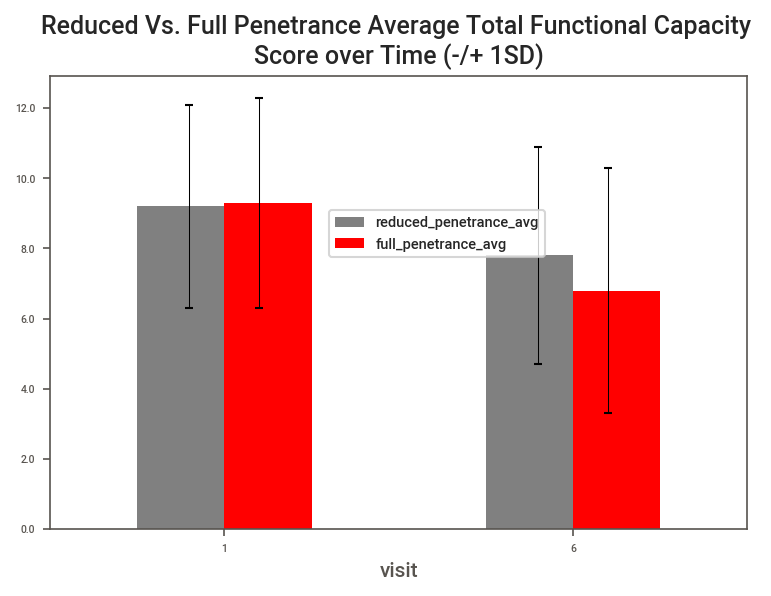

In [71]:
avg = pd.Series(rp.mean().round(1), name='reduced_penetrance_avg')
sd = pd.Series(np.std(rp, ddof=1).round(1), name='reduced_penetrance_std')
rp_freq = pd.concat([avg, sd], axis=1)

avg = pd.Series(fp.mean().round(1), name='full_penetrance_avg')
sd = pd.Series(np.std(fp, ddof=1).round(1), name='full_penetrance_std')
fp_freq = pd.concat([avg, sd], axis=1)

freq = pd.merge(rp_freq, fp_freq, left_index=True, right_index=True)
freq.loc[:, 'visit'] = np.array([1, 6]).astype(str)
display(freq)

avg = freq.drop(list(proj.get_columns_with_pattern(freq, 'std').columns), axis=1)
sd = freq.drop(list(proj.get_columns_with_pattern(freq, 'avg').columns), axis=1)
display(avg, sd)

cmap = {c:'gray' if 'reduced_penetrance' in c.lower() else 'red' if 'full_penetrance' in c.lower() else 'gray' for c in avg.columns}
fig, ax1 = plt.subplots(figsize=[6, 4], dpi=150)

proj.plot_errorbars(freq['visit'], freq['reduced_penetrance_avg'], freq['reduced_penetrance_std'], axis=ax1)
proj.plot_errorbars(freq['visit'], freq['full_penetrance_avg'], freq['full_penetrance_std'], axis=ax1, shift=True)
avg.plot(kind='bar', x='visit', color=cmap, ax=ax1)
proj.adjust_axis(ax1, plot_title="Reduced Vs. Full Penetrance Average Total Functional Capacity \nScore over Time (-/+ 1SD)", title_size=12,
                 show_legend_at=[0.4, 0.6])

### BMI & Total Functional Capacity Score

In [72]:
# baseline
cols = ['bmi_level_vis_6', 'tfcscore_vis_1',]
ctl = proj.get_columns_with_pattern(control, cols)
mnf = proj.get_columns_with_pattern(manifest, cols)
display(ctl, mnf)
display(ctl.describe(include='all'), mnf.describe(include='all'))

ctl_avg = ctl.groupby(cols[0]).mean().round(1).rename(columns={cols[-1]:'control_avg'})
ctl_std = ctl.groupby(cols[0]).std().round(1).rename(columns={cols[-1]:'control_std'})
ctl = pd.merge(ctl_avg, ctl_std, left_index=True, right_index=True)

mnf_avg = mnf.groupby(cols[0]).mean().round(1).rename(columns={cols[-1]:'manifest_avg'})
mnf_std = mnf.groupby(cols[0]).std().round(1).rename(columns={cols[-1]:'manifest_std'})
mnf = pd.merge(mnf_avg, mnf_std, left_index=True, right_index=True)

v1 = pd.merge(ctl, mnf, left_index=True, right_index=True)
display(v1)

,bmi_level_vis_6,tfcscore_vis_1
0,3. obese,13.0
1,3. obese,13.0
2,2. overweight,13.0
3,0. underweight,13.0
4,1. normal,13.0
...,...,...
315,2. overweight,13.0
316,1. normal,13.0
317,2. overweight,13.0
318,3. obese,13.0


,bmi_level_vis_6,tfcscore_vis_1
0,0. underweight,11.0
1,1. normal,13.0
2,1. normal,12.0
3,1. normal,8.0
4,1. normal,12.0
...,...,...
541,2. overweight,9.0
542,2. overweight,5.0
543,3. obese,13.0
544,3. obese,12.0


,bmi_level_vis_6,tfcscore_vis_1
count,320,320.00
unique,5,NaN
top,2. overweight,NaN
freq,103,NaN
mean,NaN,12.88
std,NaN,0.47
min,NaN,9.00
25%,NaN,13.00
50%,NaN,13.00
75%,NaN,13.00


,bmi_level_vis_6,tfcscore_vis_1
count,546,546.00
unique,5,NaN
top,1. normal,NaN
freq,268,NaN
mean,NaN,9.29
std,NaN,2.97
min,NaN,0.00
25%,NaN,7.00
50%,NaN,10.00
75%,NaN,12.00


,control_avg,control_std,manifest_avg,manifest_std
bmi_level_vis_6,,,,
0. underweight,13.0,0.0,8.5,3.3
1. normal,13.0,0.3,9.4,2.8
2. overweight,12.9,0.4,9.1,3.1
3. obese,12.8,0.7,9.4,3.0
4. severely obese,13.0,0.2,9.2,3.5


In [73]:
# visit 6
cols = ['bmi_level_vis_6', 'tfcscore_vis_6',]
ctl = proj.get_columns_with_pattern(control, cols)
mnf = proj.get_columns_with_pattern(manifest, cols)
display(ctl, mnf)
display(ctl.describe(include='all'), mnf.describe(include='all'))

ctl_avg = ctl.groupby(cols[0]).mean().round(1).rename(columns={cols[-1]:'control_avg'})
ctl_std = ctl.groupby(cols[0]).std().round(1).rename(columns={cols[-1]:'control_std'})
ctl = pd.merge(ctl_avg, ctl_std, left_index=True, right_index=True)

mnf_avg = mnf.groupby(cols[0]).mean().round(1).rename(columns={cols[-1]:'manifest_avg'})
mnf_std = mnf.groupby(cols[0]).std().round(1).rename(columns={cols[-1]:'manifest_std'})
mnf = pd.merge(mnf_avg, mnf_std, left_index=True, right_index=True)

v6 = pd.merge(ctl, mnf, left_index=True, right_index=True)
display(v6)

,bmi_level_vis_6,tfcscore_vis_6
0,3. obese,13.0
1,3. obese,13.0
2,2. overweight,13.0
3,0. underweight,13.0
4,1. normal,13.0
...,...,...
315,2. overweight,11.0
316,1. normal,13.0
317,2. overweight,13.0
318,3. obese,13.0


,bmi_level_vis_6,tfcscore_vis_6
0,0. underweight,6.0
1,1. normal,9.0
2,1. normal,8.0
3,1. normal,1.0
4,1. normal,11.0
...,...,...
541,2. overweight,11.0
542,2. overweight,6.0
543,3. obese,11.0
544,3. obese,11.0


,bmi_level_vis_6,tfcscore_vis_6
count,320,320.00
unique,5,NaN
top,2. overweight,NaN
freq,103,NaN
mean,NaN,12.84
std,NaN,0.73
min,NaN,6.00
25%,NaN,13.00
50%,NaN,13.00
75%,NaN,13.00


,bmi_level_vis_6,tfcscore_vis_6
count,546,546.00
unique,5,NaN
top,1. normal,NaN
freq,268,NaN
mean,NaN,6.85
std,NaN,3.50
min,NaN,0.00
25%,NaN,4.00
50%,NaN,7.00
75%,NaN,10.00


,control_avg,control_std,manifest_avg,manifest_std
bmi_level_vis_6,,,,
0. underweight,13.0,0.0,5.4,3.3
1. normal,12.9,0.5,6.8,3.6
2. overweight,12.8,0.8,6.8,3.4
3. obese,12.7,0.9,7.4,3.3
4. severely obese,13.0,0.0,8.1,3.9


W:\MSc-AIDS-UoH\Trimester_3\Submit\project_methods.py:2125: UserWarning:

FixedFormatter should only be used together with FixedLocator

W:\MSc-AIDS-UoH\Trimester_3\Submit\project_methods.py:2125: UserWarning:

FixedFormatter should only be used together with FixedLocator



<AxesSubplot:title={'center':'Average Total Functional Capacity Score\n & Sixth BMI (+/- 1SD)'}, xlabel=' ', ylabel='Mean Total Functional Capacity score'>

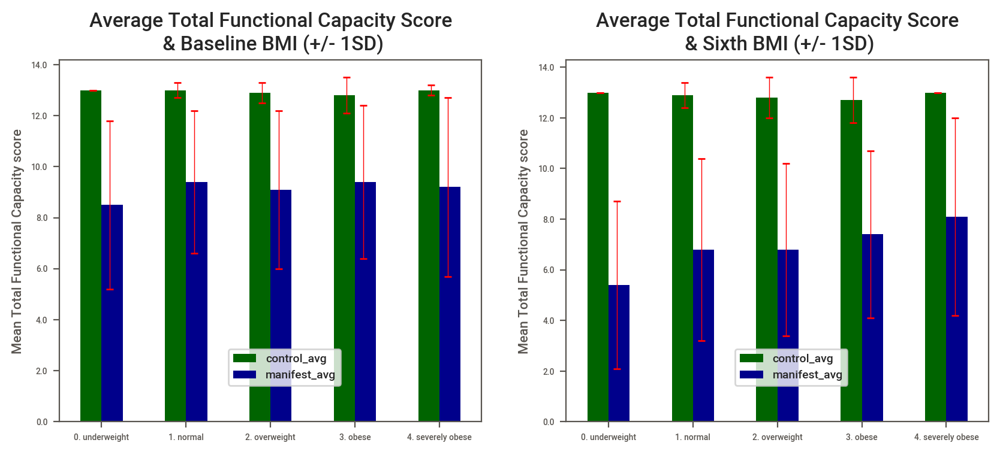

In [74]:
cmap = {c:'darkgreen' if 'control' in c.lower() else 'darkblue' if 'manifest' in c.lower() else 'gray' for c in v1.columns}
fig, (l, r) = plt.subplots(1, 2, figsize=[10, 4], dpi=200)

# visit 1
v1.loc[:, ['control_avg', 'manifest_avg']].plot(kind='bar', color=cmap, ax=l)
proj.adjust_axis(l, plot_title="Average Total Functional Capacity Score\n & Baseline BMI (+/- 1SD)", x_labe=' ', y_labe='Mean Total Functional Capacity score', 
                show_legend_at=[0.4, 0.1])
proj.plot_errorbars(x=v1.index, y=v1['control_avg'], yerror=v1['control_std'], errbar_color='red', axis=l)
proj.plot_errorbars(x=v1.index, y=v1['manifest_avg'], yerror=v1['manifest_std'], errbar_color='red', axis=l, shift=True)

# visit 6
v6.loc[:, ['control_avg', 'manifest_avg']].plot(kind='bar', color=cmap, ax=r)
proj.adjust_axis(r, plot_title="Average Total Functional Capacity Score\n & Sixth BMI (+/- 1SD)", x_labe=' ',  y_labe='Mean Total Functional Capacity score', 
                show_legend_at=[0.4, 0.1])
proj.plot_errorbars(x=v6.index, y=v6['control_avg'], yerror=v6['control_std'], errbar_color='red', axis=r)
proj.plot_errorbars(x=v6.index, y=v6['manifest_avg'], yerror=v6['manifest_std'], errbar_color='red', axis=r, shift=True)

#### BMI change: Increase Vs. Decrease

In [75]:
# baseline
cols = ['v1v6_bmi_change', 'tfcscore_vis_1',]
ctl = proj.get_columns_with_pattern(control, cols)
mnf = proj.get_columns_with_pattern(manifest, cols)
display(ctl, mnf)
display(ctl.describe(include='all'), mnf.describe(include='all'))

ctl_avg = ctl.groupby(cols[0]).mean().round(1).rename(columns={cols[-1]:'control_avg'})
ctl_std = ctl.groupby(cols[0]).std().round(1).rename(columns={cols[-1]:'control_std'})
ctl = pd.merge(ctl_avg, ctl_std, left_index=True, right_index=True)

mnf_avg = mnf.groupby(cols[0]).mean().round(1).rename(columns={cols[-1]:'manifest_avg'})
mnf_std = mnf.groupby(cols[0]).std().round(1).rename(columns={cols[-1]:'manifest_std'})
mnf = pd.merge(mnf_avg, mnf_std, left_index=True, right_index=True)

v1 = pd.merge(ctl, mnf, left_index=True, right_index=True)
display(v1)

,v1v6_bmi_change,tfcscore_vis_1
0,1. increase,13.0
1,1. increase,13.0
2,1. increase,13.0
3,-1. decrease,13.0
4,1. increase,13.0
...,...,...
315,1. increase,13.0
316,1. increase,13.0
317,1. increase,13.0
318,1. increase,13.0


,v1v6_bmi_change,tfcscore_vis_1
0,-1. decrease,11.0
1,-1. decrease,13.0
2,1. increase,12.0
3,-1. decrease,8.0
4,-1. decrease,12.0
...,...,...
541,1. increase,9.0
542,-1. decrease,5.0
543,0. no change,13.0
544,1. increase,12.0


,v1v6_bmi_change,tfcscore_vis_1
count,320,320.00
unique,3,NaN
top,1. increase,NaN
freq,173,NaN
mean,NaN,12.88
std,NaN,0.47
min,NaN,9.00
25%,NaN,13.00
50%,NaN,13.00
75%,NaN,13.00


,v1v6_bmi_change,tfcscore_vis_1
count,546,546.00
unique,3,NaN
top,-1. decrease,NaN
freq,279,NaN
mean,NaN,9.29
std,NaN,2.97
min,NaN,0.00
25%,NaN,7.00
50%,NaN,10.00
75%,NaN,12.00


,control_avg,control_std,manifest_avg,manifest_std
v1v6_bmi_change,,,,
-1. decrease,12.8,0.5,9.2,2.9
0. no change,12.9,0.2,9.0,3.6
1. increase,12.9,0.4,9.5,2.9


In [76]:
# visit 6
cols = ['v1v6_bmi_change', 'tfcscore_vis_6',]
ctl = proj.get_columns_with_pattern(control, cols)
mnf = proj.get_columns_with_pattern(manifest, cols)
display(ctl, mnf)
display(ctl.describe(include='all'), mnf.describe(include='all'))

ctl_avg = ctl.groupby(cols[0]).mean().round(1).rename(columns={cols[-1]:'control_avg'})
ctl_std = ctl.groupby(cols[0]).std().round(1).rename(columns={cols[-1]:'control_std'})
ctl = pd.merge(ctl_avg, ctl_std, left_index=True, right_index=True)

mnf_avg = mnf.groupby(cols[0]).mean().round(1).rename(columns={cols[-1]:'manifest_avg'})
mnf_std = mnf.groupby(cols[0]).std().round(1).rename(columns={cols[-1]:'manifest_std'})
mnf = pd.merge(mnf_avg, mnf_std, left_index=True, right_index=True)

v6 = pd.merge(ctl, mnf, left_index=True, right_index=True)
display(v6)

,v1v6_bmi_change,tfcscore_vis_6
0,1. increase,13.0
1,1. increase,13.0
2,1. increase,13.0
3,-1. decrease,13.0
4,1. increase,13.0
...,...,...
315,1. increase,11.0
316,1. increase,13.0
317,1. increase,13.0
318,1. increase,13.0


,v1v6_bmi_change,tfcscore_vis_6
0,-1. decrease,6.0
1,-1. decrease,9.0
2,1. increase,8.0
3,-1. decrease,1.0
4,-1. decrease,11.0
...,...,...
541,1. increase,11.0
542,-1. decrease,6.0
543,0. no change,11.0
544,1. increase,11.0


,v1v6_bmi_change,tfcscore_vis_6
count,320,320.00
unique,3,NaN
top,1. increase,NaN
freq,173,NaN
mean,NaN,12.84
std,NaN,0.73
min,NaN,6.00
25%,NaN,13.00
50%,NaN,13.00
75%,NaN,13.00


,v1v6_bmi_change,tfcscore_vis_6
count,546,546.00
unique,3,NaN
top,-1. decrease,NaN
freq,279,NaN
mean,NaN,6.85
std,NaN,3.50
min,NaN,0.00
25%,NaN,4.00
50%,NaN,7.00
75%,NaN,10.00


,control_avg,control_std,manifest_avg,manifest_std
v1v6_bmi_change,,,,
-1. decrease,12.7,1.0,6.8,3.4
0. no change,12.9,0.5,7.1,3.8
1. increase,12.9,0.4,6.9,3.6


W:\MSc-AIDS-UoH\Trimester_3\Submit\project_methods.py:2125: UserWarning:

FixedFormatter should only be used together with FixedLocator

W:\MSc-AIDS-UoH\Trimester_3\Submit\project_methods.py:2125: UserWarning:

FixedFormatter should only be used together with FixedLocator



<AxesSubplot:title={'center':'Average Total Functional Capacity Score \n& Sixth BMI Changge'}, xlabel=' ', ylabel='Mean Total Functional Capacity score'>

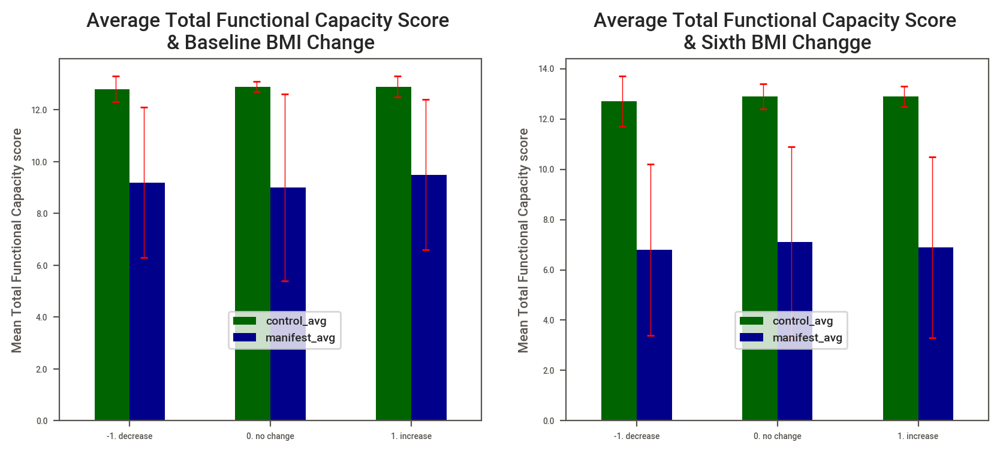

In [77]:
cmap = {c:'darkgreen' if 'control' in c.lower() else 'darkblue' if 'manifest' in c.lower() else 'gray' for c in v1.columns}
fig, (l, r) = plt.subplots(1, 2, figsize=[10, 4], dpi=200)

# visit 1
v1.loc[:, ['control_avg', 'manifest_avg']].plot(kind='bar', color=cmap, ax=l)
proj.adjust_axis(l, plot_title="Average Total Functional Capacity Score \n& Baseline BMI Change", x_labe=' ', y_labe='Mean Total Functional Capacity score', 
                show_legend_at=[0.4, 0.2])
proj.plot_errorbars(x=v1.index, y=v1['control_avg'], yerror=v1['control_std'], errbar_color='red', axis=l)
proj.plot_errorbars(x=v1.index, y=v1['manifest_avg'], yerror=v1['manifest_std'], errbar_color='red', axis=l, shift=True)

# visit 6
v6.loc[:, ['control_avg', 'manifest_avg']].plot(kind='bar', color=cmap, ax=r)
proj.adjust_axis(r, plot_title="Average Total Functional Capacity Score \n& Sixth BMI Changge", x_labe=' ',  y_labe='Mean Total Functional Capacity score', 
                show_legend_at=[0.4, 0.2])
proj.plot_errorbars(x=v6.index, y=v6['control_avg'], yerror=v6['control_std'], errbar_color='red', axis=r)
proj.plot_errorbars(x=v6.index, y=v6['manifest_avg'], yerror=v6['manifest_std'], errbar_color='red', axis=r, shift=True)

### Functional Assessment Score

{'lower_limit': 2.5,
 'upper_limit': 38.5,
 'n_outliers': 67,
 'outliers': 0     0.0
 1     0.0
 2     0.0
 3     0.0
 4     0.0
      ... 
 62    2.0
 63    2.0
 64    2.0
 65    2.0
 66    2.0
 Length: 67, dtype: float64}

W:\MSc-AIDS-UoH\Trimester_3\Submit\project_methods.py:2336: UserWarning:

FixedFormatter should only be used together with FixedLocator

No handles with labels found to put in legend.


<AxesSubplot:title={'center':'Statistical Spread of Fascore'}>

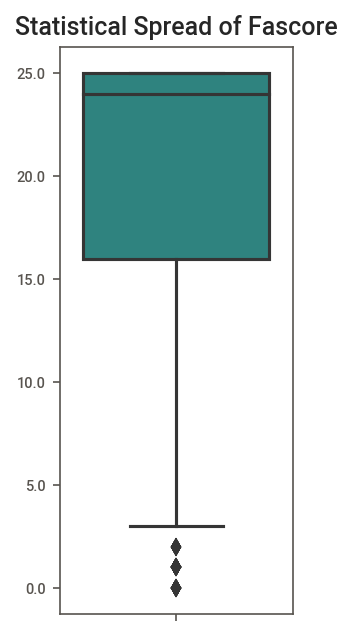

In [78]:
display(proj.outlier_detection_iqr(first6_vis['fascore_vis_6'], precision=1))

fig, ax1 = plt.subplots(figsize=[2, 5], dpi=150)
proj.plot_box(y=first6_vis['fascore_vis_6'], plot_title="Statistical Spread of Fascore",
             axis=ax1)

#### Fascore

In [79]:
ctl = proj.get_columns_with_pattern(control, 'fascore_vis')
mnf = proj.get_columns_with_pattern(manifest, 'fascore_vis')
display(ctl, mnf)
display(ctl.describe(), mnf.describe())

,fascore_vis_1,fascore_vis_6
0,25.0,25.0
1,25.0,25.0
2,25.0,25.0
3,25.0,25.0
4,25.0,25.0
...,...,...
315,25.0,24.0
316,25.0,25.0
317,25.0,25.0
318,25.0,25.0


,fascore_vis_1,fascore_vis_6
0,24.0,7.0
1,25.0,20.0
2,23.0,20.0
3,19.0,1.0
4,24.0,23.0
...,...,...
541,22.0,24.0
542,14.0,13.0
543,25.0,24.0
544,23.0,23.0


,fascore_vis_1,fascore_vis_6
count,320.00,320.00
mean,24.88,24.85
std,0.56,0.76
min,20.00,18.00
25%,25.00,25.00
50%,25.00,25.00
75%,25.00,25.00
max,25.00,25.00


,fascore_vis_1,fascore_vis_6
count,546.00,546.00
mean,20.34,15.68
std,5.00,7.35
min,0.00,0.00
25%,18.00,11.00
50%,22.00,17.00
75%,24.00,22.00
max,25.00,25.00


,control_avg,control_std,manifest_avg,manifest_std,visit
fascore_vis_1,24.9,0.6,20.3,5.0,1
fascore_vis_6,24.8,0.8,15.7,7.3,6


,control_avg,manifest_avg,visit
fascore_vis_1,24.9,20.3,1
fascore_vis_6,24.8,15.7,6


,control_std,manifest_std,visit
fascore_vis_1,0.6,5.0,1
fascore_vis_6,0.8,7.3,6


W:\MSc-AIDS-UoH\Trimester_3\Submit\project_methods.py:2125: UserWarning:

FixedFormatter should only be used together with FixedLocator



<AxesSubplot:title={'center':'Average Functional Assessment Score over Time (-/+ 1SD)'}, xlabel='visit'>

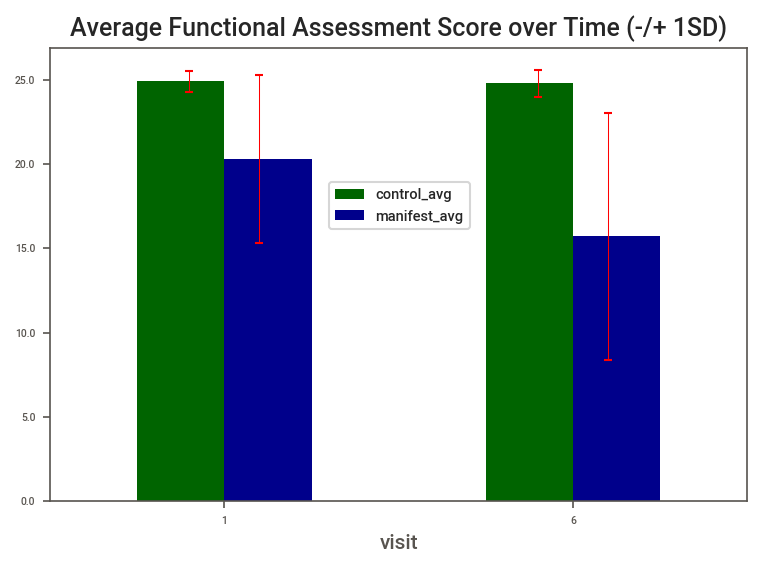

In [80]:
avg = pd.Series(ctl.mean().round(1), name='control_avg')
sd = pd.Series(np.std(ctl, ddof=1).round(1),
               name='control_std')
ctl_freq = pd.concat([avg, sd], axis=1)

avg = pd.Series(mnf.mean().round(1), name='manifest_avg')
sd = pd.Series(np.std(mnf,  ddof=1).round(1), name='manifest_std')
mnf_freq = pd.concat([avg, sd], axis=1)
freq = pd.merge(ctl_freq, mnf_freq, left_index=True, right_index=True)
freq.loc[:, 'visit'] = np.array([1, 6]).astype(str)
display(freq)

avg = freq.drop(list(proj.get_columns_with_pattern(freq, 'std').columns), axis=1)
sd = freq.drop(list(proj.get_columns_with_pattern(freq, 'avg').columns), axis=1)
display(avg, sd)

cmap = {c:'darkgreen' if 'control' in c.lower() else 'darkblue' if 'manifest' in c.lower() else 'gray' for c in avg.columns}
fig, ax1 = plt.subplots(figsize=[6, 4], dpi=150)

proj.plot_errorbars(freq['visit'], freq['control_avg'], freq['control_std'], errbar_color='red', axis=ax1)
proj.plot_errorbars(freq['visit'], freq['manifest_avg'], freq['manifest_std'], errbar_color='red', axis=ax1, shift=True)
avg.plot(kind='bar', x='visit', color=cmap, ax=ax1)
proj.adjust_axis(ax1, plot_title="Average Functional Assessment Score over Time (-/+ 1SD)", title_size=12,
                 show_legend_at=[0.4, 0.6])

#### Gender

In [81]:
# male
ctl = proj.get_columns_with_pattern(male_control, 'fascore_vis')
mnf = proj.get_columns_with_pattern(male_manifest, 'fascore_vis')
display(ctl, mnf)
display(ctl.describe(), mnf.describe())

,fascore_vis_1,fascore_vis_6
7,25.0,25.0
20,25.0,25.0
24,25.0,25.0
36,25.0,25.0
45,25.0,25.0
...,...,...
1243,25.0,25.0
1258,25.0,25.0
1292,25.0,25.0
1295,25.0,24.0


,fascore_vis_1,fascore_vis_6
0,24.0,7.0
1,25.0,20.0
3,23.0,20.0
4,19.0,1.0
8,24.0,23.0
...,...,...
1289,20.0,20.0
1290,22.0,20.0
1300,22.0,24.0
1303,14.0,13.0


,fascore_vis_1,fascore_vis_6
count,115.00,115.00
mean,24.85,24.84
std,0.69,0.90
min,20.00,18.00
25%,25.00,25.00
50%,25.00,25.00
75%,25.00,25.00
max,25.00,25.00


,fascore_vis_1,fascore_vis_6
count,286.00,286.00
mean,20.65,16.26
std,4.48,6.78
min,1.00,0.00
25%,18.00,12.00
50%,22.00,17.00
75%,24.00,22.00
max,25.00,25.00


,control_avg,control_std,manifest_avg,manifest_std,visit
fascore_vis_1,24.9,0.7,20.7,4.5,1
fascore_vis_6,24.8,0.9,16.3,6.8,6


,control_avg,manifest_avg,visit
fascore_vis_1,24.9,20.7,1
fascore_vis_6,24.8,16.3,6


,control_std,manifest_std,visit
fascore_vis_1,0.7,4.5,1
fascore_vis_6,0.9,6.8,6


W:\MSc-AIDS-UoH\Trimester_3\Submit\project_methods.py:2125: UserWarning:

FixedFormatter should only be used together with FixedLocator



<AxesSubplot:title={'center':'Male Average Functional Assessment Score over Time (-/+ 1SD)'}, xlabel='visit'>

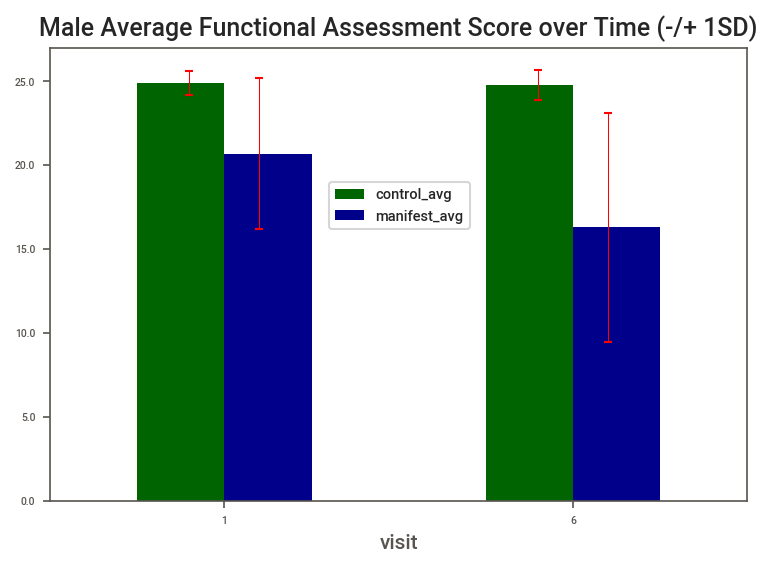

In [82]:
avg = pd.Series(ctl.mean().round(1), name='control_avg')
sd = pd.Series(np.std(ctl, ddof=1).round(1), name='control_std')
ctl_freq = pd.concat([avg, sd], axis=1)

avg = pd.Series(mnf.mean().round(1), name='manifest_avg')
sd = pd.Series(np.std(mnf, ddof=1).round(1), name='manifest_std')
mnf_freq = pd.concat([avg, sd], axis=1)

freq = pd.merge(ctl_freq, mnf_freq, left_index=True, right_index=True)
freq.loc[:, 'visit'] = np.array([1, 6]).astype(str)
display(freq)

avg = freq.drop(list(proj.get_columns_with_pattern(freq, 'std').columns), axis=1)
sd = freq.drop(list(proj.get_columns_with_pattern(freq, 'avg').columns), axis=1)
display(avg, sd)

cmap = {c:'darkgreen' if 'control' in c.lower() else 'darkblue' if 'manifest' in c.lower() else 'gray' for c in avg.columns}
fig, ax1 = plt.subplots(figsize=[6, 4], dpi=150)

proj.plot_errorbars(freq['visit'], freq['control_avg'], freq['control_std'], errbar_color='red', axis=ax1)
proj.plot_errorbars(freq['visit'], freq['manifest_avg'], freq['manifest_std'], errbar_color='red', axis=ax1, shift=True)
avg.plot(kind='bar', x='visit', color=cmap, ax=ax1)
proj.adjust_axis(ax1, plot_title="Male Average Functional Assessment Score over Time (-/+ 1SD)", title_size=12,
                 show_legend_at=[0.4, 0.6])

In [83]:
# female
ctl = proj.get_columns_with_pattern(female_control, 'fascore_vis')
mnf = proj.get_columns_with_pattern(female_manifest, 'fascore_vis')
display(ctl, mnf)
display(ctl.describe(), mnf.describe())

,fascore_vis_1,fascore_vis_6
28,25.0,25.0
29,25.0,25.0
33,25.0,25.0
42,25.0,25.0
52,25.0,25.0
...,...,...
1286,25.0,25.0
1294,25.0,25.0
1297,25.0,25.0
1299,25.0,25.0


,fascore_vis_1,fascore_vis_6
15,25.0,25.0
16,18.0,13.0
19,1.0,1.0
27,18.0,12.0
30,24.0,24.0
...,...,...
1293,17.0,2.0
1296,8.0,5.0
1298,24.0,23.0
1306,25.0,24.0


,fascore_vis_1,fascore_vis_6
count,205.00,205.00
mean,24.90,24.85
std,0.46,0.66
min,22.00,20.00
25%,25.00,25.00
50%,25.00,25.00
75%,25.00,25.00
max,25.00,25.00


,fascore_vis_1,fascore_vis_6
count,260.00,260.00
mean,19.98,15.03
std,5.50,7.88
min,0.00,0.00
25%,18.00,9.75
50%,22.00,17.00
75%,24.00,22.00
max,25.00,25.00


,control_avg,control_std,manifest_avg,manifest_std,visit
fascore_vis_1,24.9,0.5,20.0,5.5,1
fascore_vis_6,24.9,0.7,15.0,7.9,6


,control_avg,manifest_avg,visit
fascore_vis_1,24.9,20.0,1
fascore_vis_6,24.9,15.0,6


,control_std,manifest_std,visit
fascore_vis_1,0.5,5.5,1
fascore_vis_6,0.7,7.9,6


W:\MSc-AIDS-UoH\Trimester_3\Submit\project_methods.py:2125: UserWarning:

FixedFormatter should only be used together with FixedLocator



<AxesSubplot:title={'center':'Female Average Functional Assessment Score over Time (-/+ 1SD)'}, xlabel='visit'>

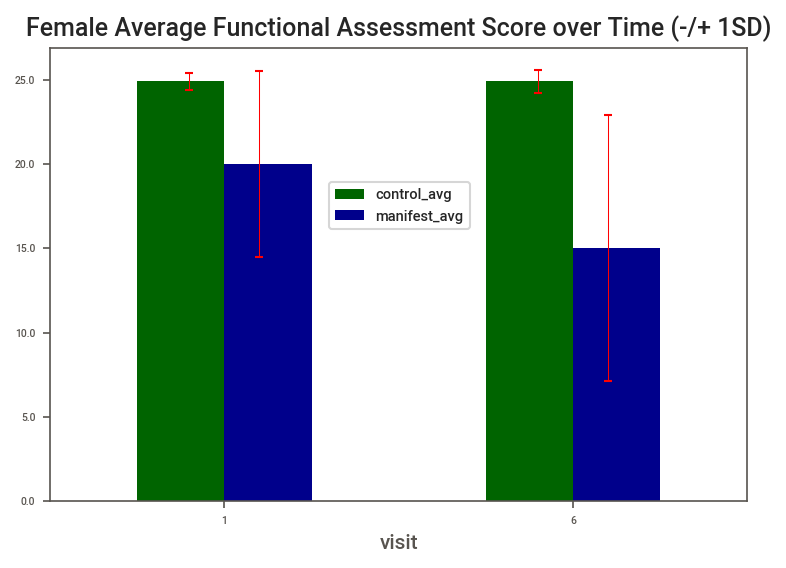

In [84]:
avg = pd.Series(ctl.mean().round(1), name='control_avg')
sd = pd.Series(np.std(ctl, ddof=1).round(1), name='control_std')
ctl_freq = pd.concat([avg, sd], axis=1)

avg = pd.Series(mnf.mean().round(1), name='manifest_avg')
sd = pd.Series(np.std(mnf, ddof=1).round(1), name='manifest_std')
mnf_freq = pd.concat([avg, sd], axis=1)

freq = pd.merge(ctl_freq, mnf_freq, left_index=True, right_index=True)
freq.loc[:, 'visit'] = np.array([1, 6]).astype(str)
display(freq)

avg = freq.drop(list(proj.get_columns_with_pattern(freq, 'std').columns), axis=1)
sd = freq.drop(list(proj.get_columns_with_pattern(freq, 'avg').columns), axis=1)
display(avg, sd)

cmap = {c:'darkgreen' if 'control' in c.lower() else 'darkblue' if 'manifest' in c.lower() else 'gray' for c in avg.columns}
fig, ax1 = plt.subplots(figsize=[6, 4], dpi=150)

proj.plot_errorbars(freq['visit'], freq['control_avg'], freq['control_std'], errbar_color='red', axis=ax1)
proj.plot_errorbars(freq['visit'], freq['manifest_avg'], freq['manifest_std'], errbar_color='red', axis=ax1, shift=True)
avg.plot(kind='bar', x='visit', color=cmap, ax=ax1)
proj.adjust_axis(ax1, plot_title="Female Average Functional Assessment Score over Time (-/+ 1SD)", title_size=12,
                 show_legend_at=[0.4, 0.6])

#### CAG repeat extensions

In [85]:
# cag repeat
rp = proj.get_columns_with_pattern(redpen, 'fascore_vis')
fp = proj.get_columns_with_pattern(fulpen, 'fascore_vis')
display(rp, fp)
display(rp.describe(), fp.describe())

,fascore_vis_1,fascore_vis_6
0,25.0,24.0
1,22.0,21.0
2,24.0,23.0
3,24.0,23.0
4,20.0,19.0
5,24.0,23.0
6,3.0,1.0
7,23.0,23.0
8,19.0,20.0
9,22.0,20.0


,fascore_vis_1,fascore_vis_6
0,24.0,7.0
1,25.0,20.0
2,23.0,20.0
3,19.0,1.0
4,24.0,23.0
...,...,...
524,22.0,24.0
525,14.0,13.0
526,25.0,24.0
527,23.0,23.0


,fascore_vis_1,fascore_vis_6
count,17.00,17.00
mean,19.82,17.88
std,5.92,6.63
min,3.00,1.00
25%,19.00,17.00
50%,22.00,20.00
75%,23.00,23.00
max,25.00,24.00


,fascore_vis_1,fascore_vis_6
count,529.00,529.00
mean,20.35,15.60
std,4.97,7.36
min,0.00,0.00
25%,18.00,11.00
50%,22.00,17.00
75%,24.00,22.00
max,25.00,25.00


,reduced_penetrance_avg,reduced_penetrance_std,full_penetrance_avg,full_penetrance_std,visit
fascore_vis_1,19.8,5.9,20.4,5.0,1
fascore_vis_6,17.9,6.6,15.6,7.4,6


,reduced_penetrance_avg,full_penetrance_avg,visit
fascore_vis_1,19.8,20.4,1
fascore_vis_6,17.9,15.6,6


,reduced_penetrance_std,full_penetrance_std,visit
fascore_vis_1,5.9,5.0,1
fascore_vis_6,6.6,7.4,6


W:\MSc-AIDS-UoH\Trimester_3\Submit\project_methods.py:2125: UserWarning:

FixedFormatter should only be used together with FixedLocator



<AxesSubplot:title={'center':'Reduced Vs. Full Penetrance Average Functional Assessment Score\n over Time (-/+ 1SD)'}, xlabel='visit'>

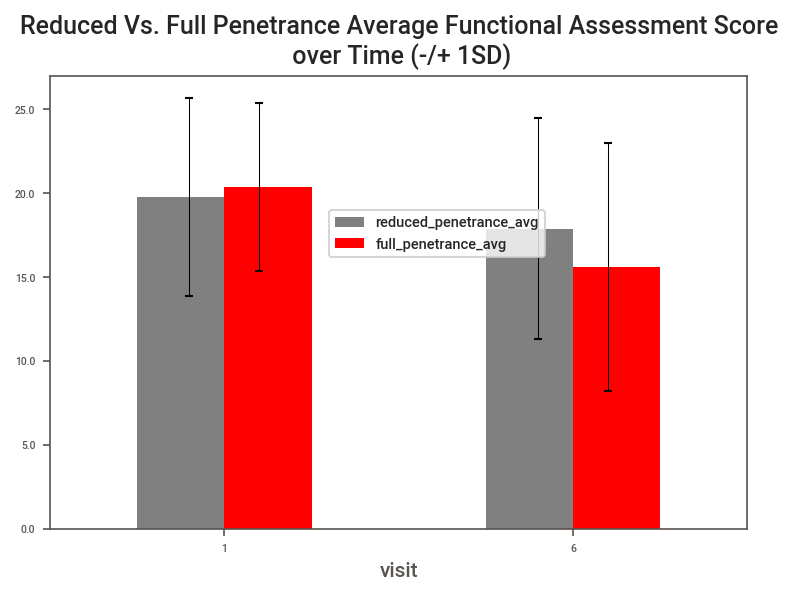

In [86]:
avg = pd.Series(rp.mean().round(1), name='reduced_penetrance_avg')
sd = pd.Series(np.std(rp, ddof=1).round(1), name='reduced_penetrance_std')
rp_freq = pd.concat([avg, sd], axis=1)

avg = pd.Series(fp.mean().round(1), name='full_penetrance_avg')
sd = pd.Series(np.std(fp, ddof=1).round(1), name='full_penetrance_std')
fp_freq = pd.concat([avg, sd], axis=1)

freq = pd.merge(rp_freq, fp_freq, left_index=True, right_index=True)
freq.loc[:, 'visit'] = np.array([1, 6]).astype(str)
display(freq)

avg = freq.drop(list(proj.get_columns_with_pattern(freq, 'std').columns), axis=1)
sd = freq.drop(list(proj.get_columns_with_pattern(freq, 'avg').columns), axis=1)
display(avg, sd)

cmap = {c:'gray' if 'reduced_penetrance' in c.lower() else 'red' if 'full_penetrance' in c.lower() else 'gray' for c in avg.columns}
fig, ax1 = plt.subplots(figsize=[6, 4], dpi=150)

proj.plot_errorbars(freq['visit'], freq['reduced_penetrance_avg'], freq['reduced_penetrance_std'], axis=ax1)
proj.plot_errorbars(freq['visit'], freq['full_penetrance_avg'], freq['full_penetrance_std'], axis=ax1, shift=True)
avg.plot(kind='bar', x='visit', color=cmap, ax=ax1)
proj.adjust_axis(ax1, plot_title="Reduced Vs. Full Penetrance Average Functional Assessment Score\n over Time (-/+ 1SD)", title_size=12,
                 show_legend_at=[0.4, 0.6])

### BMI & Functional Assessment Score

In [87]:
# baseline
cols = ['bmi_level_vis_6', 'fascore_vis_1',]
ctl = proj.get_columns_with_pattern(control, cols)
mnf = proj.get_columns_with_pattern(manifest, cols)
display(ctl, mnf)
display(ctl.describe(include='all'), mnf.describe(include='all'))

ctl_avg = ctl.groupby(cols[0]).mean().round(1).rename(columns={cols[-1]:'control_avg'})
ctl_std = ctl.groupby(cols[0]).std().round(1).rename(columns={cols[-1]:'control_std'})
ctl = pd.merge(ctl_avg, ctl_std, left_index=True, right_index=True)

mnf_avg = mnf.groupby(cols[0]).mean().round(1).rename(columns={cols[-1]:'manifest_avg'})
mnf_std = mnf.groupby(cols[0]).std().round(1).rename(columns={cols[-1]:'manifest_std'})
mnf = pd.merge(mnf_avg, mnf_std, left_index=True, right_index=True)

v1 = pd.merge(ctl, mnf, left_index=True, right_index=True)
display(v1)

,bmi_level_vis_6,fascore_vis_1
0,3. obese,25.0
1,3. obese,25.0
2,2. overweight,25.0
3,0. underweight,25.0
4,1. normal,25.0
...,...,...
315,2. overweight,25.0
316,1. normal,25.0
317,2. overweight,25.0
318,3. obese,25.0


,bmi_level_vis_6,fascore_vis_1
0,0. underweight,24.0
1,1. normal,25.0
2,1. normal,23.0
3,1. normal,19.0
4,1. normal,24.0
...,...,...
541,2. overweight,22.0
542,2. overweight,14.0
543,3. obese,25.0
544,3. obese,23.0


,bmi_level_vis_6,fascore_vis_1
count,320,320.00
unique,5,NaN
top,2. overweight,NaN
freq,103,NaN
mean,NaN,24.88
std,NaN,0.56
min,NaN,20.00
25%,NaN,25.00
50%,NaN,25.00
75%,NaN,25.00


,bmi_level_vis_6,fascore_vis_1
count,546,546.00
unique,5,NaN
top,1. normal,NaN
freq,268,NaN
mean,NaN,20.34
std,NaN,5.00
min,NaN,0.00
25%,NaN,18.00
50%,NaN,22.00
75%,NaN,24.00


,control_avg,control_std,manifest_avg,manifest_std
bmi_level_vis_6,,,,
0. underweight,25.0,0.0,19.9,6.5
1. normal,24.9,0.4,20.5,4.6
2. overweight,25.0,0.1,20.1,5.4
3. obese,24.7,0.9,20.5,4.8
4. severely obese,25.0,0.0,20.8,4.9


In [88]:
# visit 6
cols = ['bmi_level_vis_6', 'fascore_vis_6',]
ctl = proj.get_columns_with_pattern(control, cols)
mnf = proj.get_columns_with_pattern(manifest, cols)
display(ctl, mnf)
display(ctl.describe(include='all'), mnf.describe(include='all'))

ctl_avg = ctl.groupby(cols[0]).mean().round(1).rename(columns={cols[-1]:'control_avg'})
ctl_std = ctl.groupby(cols[0]).std().round(1).rename(columns={cols[-1]:'control_std'})
ctl = pd.merge(ctl_avg, ctl_std, left_index=True, right_index=True)

mnf_avg = mnf.groupby(cols[0]).mean().round(1).rename(columns={cols[-1]:'manifest_avg'})
mnf_std = mnf.groupby(cols[0]).std().round(1).rename(columns={cols[-1]:'manifest_std'})
mnf = pd.merge(mnf_avg, mnf_std, left_index=True, right_index=True)

v6 = pd.merge(ctl, mnf, left_index=True, right_index=True)
display(v6)

,bmi_level_vis_6,fascore_vis_6
0,3. obese,25.0
1,3. obese,25.0
2,2. overweight,25.0
3,0. underweight,25.0
4,1. normal,25.0
...,...,...
315,2. overweight,24.0
316,1. normal,25.0
317,2. overweight,25.0
318,3. obese,25.0


,bmi_level_vis_6,fascore_vis_6
0,0. underweight,7.0
1,1. normal,20.0
2,1. normal,20.0
3,1. normal,1.0
4,1. normal,23.0
...,...,...
541,2. overweight,24.0
542,2. overweight,13.0
543,3. obese,24.0
544,3. obese,23.0


,bmi_level_vis_6,fascore_vis_6
count,320,320.00
unique,5,NaN
top,2. overweight,NaN
freq,103,NaN
mean,NaN,24.85
std,NaN,0.76
min,NaN,18.00
25%,NaN,25.00
50%,NaN,25.00
75%,NaN,25.00


,bmi_level_vis_6,fascore_vis_6
count,546,546.00
unique,5,NaN
top,1. normal,NaN
freq,268,NaN
mean,NaN,15.68
std,NaN,7.35
min,NaN,0.00
25%,NaN,11.00
50%,NaN,17.00
75%,NaN,22.00


,control_avg,control_std,manifest_avg,manifest_std
bmi_level_vis_6,,,,
0. underweight,25.0,0.0,14.4,8.4
1. normal,24.9,0.5,15.1,7.7
2. overweight,24.9,0.7,16.0,6.8
3. obese,24.7,1.0,17.0,6.5
4. severely obese,25.0,0.0,18.0,7.3


W:\MSc-AIDS-UoH\Trimester_3\Submit\project_methods.py:2125: UserWarning:

FixedFormatter should only be used together with FixedLocator

W:\MSc-AIDS-UoH\Trimester_3\Submit\project_methods.py:2125: UserWarning:

FixedFormatter should only be used together with FixedLocator



<AxesSubplot:title={'center':'Average Functional Assessment Score\n & Sixth BMI (+/- 1SD)'}, xlabel=' ', ylabel='Mean Functional Assessment score'>

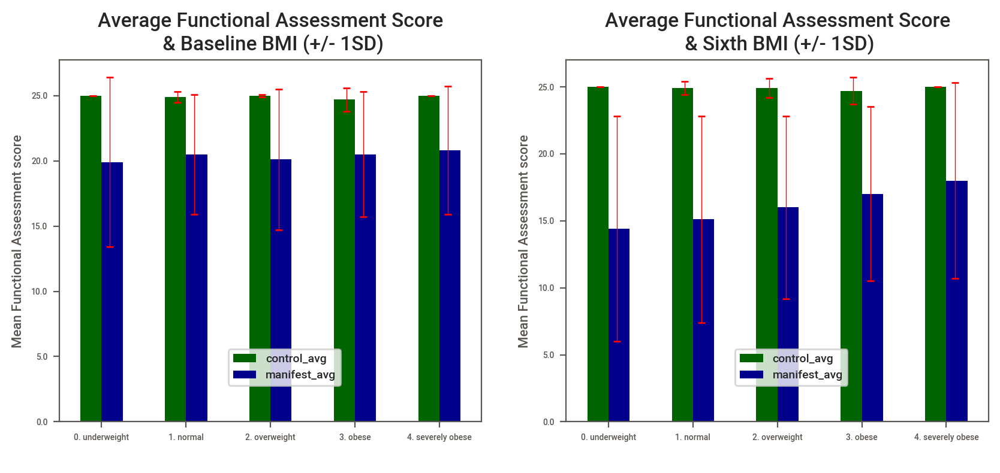

In [89]:
cmap = {c:'darkgreen' if 'control' in c.lower() else 'darkblue' if 'manifest' in c.lower() else 'gray' for c in v1.columns}
fig, (l, r) = plt.subplots(1, 2, figsize=[10, 4], dpi=200)

# visit 1
v1.loc[:, ['control_avg', 'manifest_avg']].plot(kind='bar', color=cmap, ax=l)
proj.adjust_axis(l, plot_title="Average Functional Assessment Score\n & Baseline BMI (+/- 1SD)", x_labe=' ', y_labe='Mean Functional Assessment score', 
                show_legend_at=[0.4, 0.1])
proj.plot_errorbars(x=v1.index, y=v1['control_avg'], yerror=v1['control_std'], errbar_color='red', axis=l)
proj.plot_errorbars(x=v1.index, y=v1['manifest_avg'], yerror=v1['manifest_std'], errbar_color='red', axis=l, shift=True)

# visit 6
v6.loc[:, ['control_avg', 'manifest_avg']].plot(kind='bar', color=cmap, ax=r)
proj.adjust_axis(r, plot_title="Average Functional Assessment Score\n & Sixth BMI (+/- 1SD)", x_labe=' ',  y_labe='Mean Functional Assessment score', 
                show_legend_at=[0.4, 0.1])
proj.plot_errorbars(x=v6.index, y=v6['control_avg'], yerror=v6['control_std'], errbar_color='red', axis=r)
proj.plot_errorbars(x=v6.index, y=v6['manifest_avg'], yerror=v6['manifest_std'], errbar_color='red', axis=r, shift=True)

#### BMI change: Increase Vs. Decrease

In [90]:
# baseline
cols = ['v1v6_bmi_change', 'fascore_vis_1',]
ctl = proj.get_columns_with_pattern(control, cols)
mnf = proj.get_columns_with_pattern(manifest, cols)
display(ctl, mnf)
display(ctl.describe(include='all'), mnf.describe(include='all'))

ctl_avg = ctl.groupby(cols[0]).mean().round(1).rename(columns={cols[-1]:'control_avg'})
ctl_std = ctl.groupby(cols[0]).std().round(1).rename(columns={cols[-1]:'control_std'})
ctl = pd.merge(ctl_avg, ctl_std, left_index=True, right_index=True)

mnf_avg = mnf.groupby(cols[0]).mean().round(1).rename(columns={cols[-1]:'manifest_avg'})
mnf_std = mnf.groupby(cols[0]).std().round(1).rename(columns={cols[-1]:'manifest_std'})
mnf = pd.merge(mnf_avg, mnf_std, left_index=True, right_index=True)

v1 = pd.merge(ctl, mnf, left_index=True, right_index=True)
display(v1)

,v1v6_bmi_change,fascore_vis_1
0,1. increase,25.0
1,1. increase,25.0
2,1. increase,25.0
3,-1. decrease,25.0
4,1. increase,25.0
...,...,...
315,1. increase,25.0
316,1. increase,25.0
317,1. increase,25.0
318,1. increase,25.0


,v1v6_bmi_change,fascore_vis_1
0,-1. decrease,24.0
1,-1. decrease,25.0
2,1. increase,23.0
3,-1. decrease,19.0
4,-1. decrease,24.0
...,...,...
541,1. increase,22.0
542,-1. decrease,14.0
543,0. no change,25.0
544,1. increase,23.0


,v1v6_bmi_change,fascore_vis_1
count,320,320.00
unique,3,NaN
top,1. increase,NaN
freq,173,NaN
mean,NaN,24.88
std,NaN,0.56
min,NaN,20.00
25%,NaN,25.00
50%,NaN,25.00
75%,NaN,25.00


,v1v6_bmi_change,fascore_vis_1
count,546,546.00
unique,3,NaN
top,-1. decrease,NaN
freq,279,NaN
mean,NaN,20.34
std,NaN,5.00
min,NaN,0.00
25%,NaN,18.00
50%,NaN,22.00
75%,NaN,24.00


,control_avg,control_std,manifest_avg,manifest_std
v1v6_bmi_change,,,,
-1. decrease,24.8,0.6,20.3,4.9
0. no change,24.9,0.2,19.5,6.8
1. increase,24.9,0.5,20.6,4.8


In [91]:
# visit 6
cols = ['v1v6_bmi_change', 'fascore_vis_6',]
ctl = proj.get_columns_with_pattern(control, cols)
mnf = proj.get_columns_with_pattern(manifest, cols)
display(ctl, mnf)
display(ctl.describe(include='all'), mnf.describe(include='all'))

ctl_avg = ctl.groupby(cols[0]).mean().round(1).rename(columns={cols[-1]:'control_avg'})
ctl_std = ctl.groupby(cols[0]).std().round(1).rename(columns={cols[-1]:'control_std'})
ctl = pd.merge(ctl_avg, ctl_std, left_index=True, right_index=True)

mnf_avg = mnf.groupby(cols[0]).mean().round(1).rename(columns={cols[-1]:'manifest_avg'})
mnf_std = mnf.groupby(cols[0]).std().round(1).rename(columns={cols[-1]:'manifest_std'})
mnf = pd.merge(mnf_avg, mnf_std, left_index=True, right_index=True)

v6 = pd.merge(ctl, mnf, left_index=True, right_index=True)
display(v6)

,v1v6_bmi_change,fascore_vis_6
0,1. increase,25.0
1,1. increase,25.0
2,1. increase,25.0
3,-1. decrease,25.0
4,1. increase,25.0
...,...,...
315,1. increase,24.0
316,1. increase,25.0
317,1. increase,25.0
318,1. increase,25.0


,v1v6_bmi_change,fascore_vis_6
0,-1. decrease,7.0
1,-1. decrease,20.0
2,1. increase,20.0
3,-1. decrease,1.0
4,-1. decrease,23.0
...,...,...
541,1. increase,24.0
542,-1. decrease,13.0
543,0. no change,24.0
544,1. increase,23.0


,v1v6_bmi_change,fascore_vis_6
count,320,320.00
unique,3,NaN
top,1. increase,NaN
freq,173,NaN
mean,NaN,24.85
std,NaN,0.76
min,NaN,18.00
25%,NaN,25.00
50%,NaN,25.00
75%,NaN,25.00


,v1v6_bmi_change,fascore_vis_6
count,546,546.00
unique,3,NaN
top,-1. decrease,NaN
freq,279,NaN
mean,NaN,15.68
std,NaN,7.35
min,NaN,0.00
25%,NaN,11.00
50%,NaN,17.00
75%,NaN,22.00


,control_avg,control_std,manifest_avg,manifest_std
v1v6_bmi_change,,,,
-1. decrease,24.8,1.0,15.7,7.5
0. no change,24.9,0.5,16.6,7.4
1. increase,24.9,0.6,15.5,7.2


W:\MSc-AIDS-UoH\Trimester_3\Submit\project_methods.py:2125: UserWarning:

FixedFormatter should only be used together with FixedLocator

W:\MSc-AIDS-UoH\Trimester_3\Submit\project_methods.py:2125: UserWarning:

FixedFormatter should only be used together with FixedLocator



<AxesSubplot:title={'center':'Average Functional Assessment Score & Sixth BMI Changge'}, xlabel=' ', ylabel='Mean Functional Assessment score'>

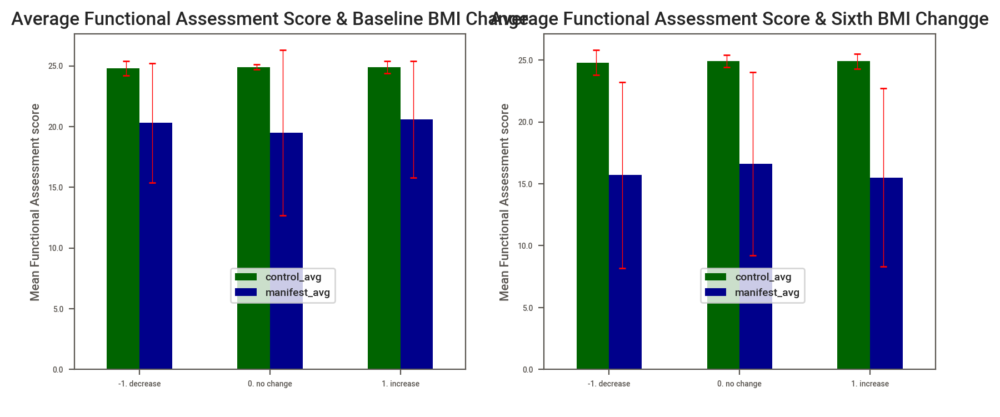

In [92]:
cmap = {c:'darkgreen' if 'control' in c.lower() else 'darkblue' if 'manifest' in c.lower() else 'gray' for c in v1.columns}
fig, (l, r) = plt.subplots(1, 2, figsize=[10, 4], dpi=200)

# visit 1
v1.loc[:, ['control_avg', 'manifest_avg']].plot(kind='bar', color=cmap, ax=l)
proj.adjust_axis(l, plot_title="Average Functional Assessment Score & Baseline BMI Change", x_labe=' ', y_labe='Mean Functional Assessment score', 
                show_legend_at=[0.4, 0.2])
proj.plot_errorbars(x=v1.index, y=v1['control_avg'], yerror=v1['control_std'], errbar_color='red', axis=l)
proj.plot_errorbars(x=v1.index, y=v1['manifest_avg'], yerror=v1['manifest_std'], errbar_color='red', axis=l, shift=True)

# visit 6
v6.loc[:, ['control_avg', 'manifest_avg']].plot(kind='bar', color=cmap, ax=r)
proj.adjust_axis(r, plot_title="Average Functional Assessment Score & Sixth BMI Changge", x_labe=' ',  y_labe='Mean Functional Assessment score', 
                show_legend_at=[0.4, 0.2])
proj.plot_errorbars(x=v6.index, y=v6['control_avg'], yerror=v6['control_std'], errbar_color='red', axis=r)
proj.plot_errorbars(x=v6.index, y=v6['manifest_avg'], yerror=v6['manifest_std'], errbar_color='red', axis=r, shift=True)

### Cognitive Score 

{'lower_limit': -113.5,
 'upper_limit': 458.5,
 'n_outliers': 0,
 'outliers': Series([], dtype: object)}

W:\MSc-AIDS-UoH\Trimester_3\Submit\project_methods.py:2336: UserWarning:

FixedFormatter should only be used together with FixedLocator

No handles with labels found to put in legend.


<AxesSubplot:title={'center':'Statistical Spread of Cognitive Score'}>

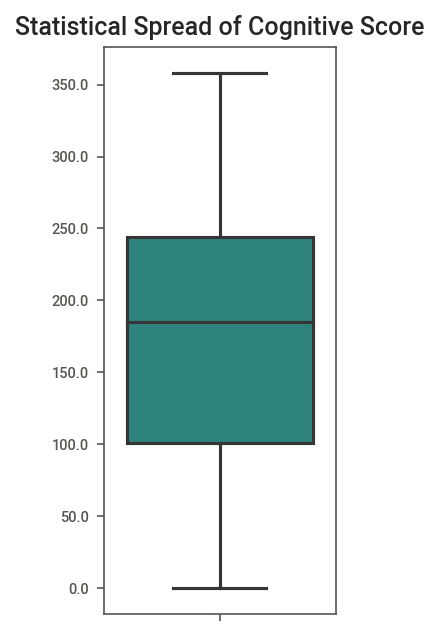

In [93]:
display(proj.outlier_detection_iqr(first6_vis['cognitive_score_vis_6'], precision=1))

fig, ax1 = plt.subplots(figsize=[2, 5], dpi=150)
proj.plot_box(y=first6_vis['cognitive_score_vis_6'], plot_title="Statistical Spread of Cognitive Score",
             axis=ax1)

#### cognitive_score

In [94]:
ctl = proj.get_columns_with_pattern(control, 'cognitive_score_vis')
mnf = proj.get_columns_with_pattern(manifest, 'cognitive_score_vis')
display(ctl, mnf)
display(ctl.describe(), mnf.describe())

,cognitive_score_vis_1,cognitive_score_vis_6
0,274.0,231.0
1,308.0,290.0
2,231.0,231.0
3,319.0,299.0
4,274.0,272.0
...,...,...
315,180.0,249.0
316,188.0,229.0
317,336.0,358.0
318,235.0,221.0


,cognitive_score_vis_1,cognitive_score_vis_6
0,120.0,35.0
1,178.0,149.0
2,264.0,264.0
3,108.0,36.0
4,183.0,150.0
...,...,...
541,150.0,103.0
542,106.0,70.0
543,212.0,188.3
544,213.0,221.0


,cognitive_score_vis_1,cognitive_score_vis_6
count,320.00,320.00
mean,242.72,245.33
std,39.24,41.01
min,53.00,49.00
25%,219.75,221.00
50%,244.00,248.00
75%,266.00,272.00
max,363.00,358.00


,cognitive_score_vis_1,cognitive_score_vis_6
count,546.00,546.00
mean,149.73,114.53
std,51.91,56.04
min,0.00,0.00
25%,117.00,77.00
50%,148.00,106.50
75%,183.00,150.75
max,308.00,307.00


,control_avg,control_std,manifest_avg,manifest_std,visit
cognitive_score_vis_1,242.7,39.2,149.7,51.9,1
cognitive_score_vis_6,245.3,41.0,114.5,56.0,6


,control_avg,manifest_avg,visit
cognitive_score_vis_1,242.7,149.7,1
cognitive_score_vis_6,245.3,114.5,6


,control_std,manifest_std,visit
cognitive_score_vis_1,39.2,51.9,1
cognitive_score_vis_6,41.0,56.0,6


W:\MSc-AIDS-UoH\Trimester_3\Submit\project_methods.py:2125: UserWarning:

FixedFormatter should only be used together with FixedLocator



<AxesSubplot:title={'center':'Average Cognitive Score over Time (-/+ 1SD)'}, xlabel='visit'>

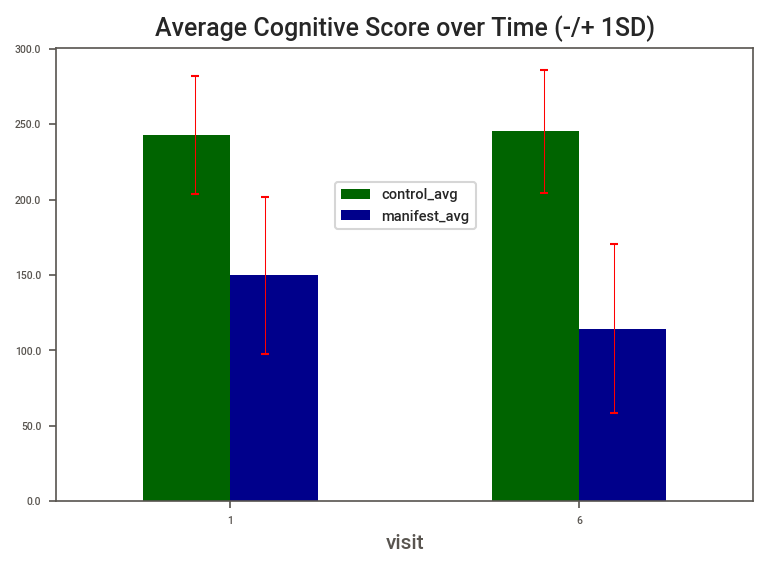

In [95]:
avg = pd.Series(ctl.mean().round(1), name='control_avg')
sd = pd.Series(np.std(ctl, ddof=1).round(1),
               name='control_std')
ctl_freq = pd.concat([avg, sd], axis=1)

avg = pd.Series(mnf.mean().round(1), name='manifest_avg')
sd = pd.Series(np.std(mnf,  ddof=1).round(1), name='manifest_std')
mnf_freq = pd.concat([avg, sd], axis=1)
freq = pd.merge(ctl_freq, mnf_freq, left_index=True, right_index=True)
freq.loc[:, 'visit'] = np.array([1, 6]).astype(str)
display(freq)

avg = freq.drop(list(proj.get_columns_with_pattern(freq, 'std').columns), axis=1)
sd = freq.drop(list(proj.get_columns_with_pattern(freq, 'avg').columns), axis=1)
display(avg, sd)

cmap = {c:'darkgreen' if 'control' in c.lower() else 'darkblue' if 'manifest' in c.lower() else 'gray' for c in avg.columns}
fig, ax1 = plt.subplots(figsize=[6, 4], dpi=150)

proj.plot_errorbars(freq['visit'], freq['control_avg'], freq['control_std'], errbar_color='red', axis=ax1)
proj.plot_errorbars(freq['visit'], freq['manifest_avg'], freq['manifest_std'], errbar_color='red', axis=ax1, shift=True)
avg.plot(kind='bar', x='visit', color=cmap, ax=ax1)
proj.adjust_axis(ax1, plot_title="Average Cognitive Score over Time (-/+ 1SD)", title_size=12,
                 show_legend_at=[0.4, 0.6])

#### Gender

In [96]:
# male
ctl = proj.get_columns_with_pattern(male_control, 'cognitive_score_vis')
mnf = proj.get_columns_with_pattern(male_manifest, 'cognitive_score_vis')
display(ctl, mnf)
display(ctl.describe(), mnf.describe())

,cognitive_score_vis_1,cognitive_score_vis_6
7,274.0,231.0
20,308.0,290.0
24,231.0,231.0
36,248.0,261.0
45,157.0,215.0
...,...,...
1243,219.0,204.0
1258,243.0,237.0
1292,243.0,251.0
1295,180.0,249.0


,cognitive_score_vis_1,cognitive_score_vis_6
0,120.0,35.0
1,178.0,149.0
3,264.0,264.0
4,108.0,36.0
8,183.0,150.0
...,...,...
1289,91.0,63.0
1290,151.0,123.0
1300,150.0,103.0
1303,106.0,70.0


,cognitive_score_vis_1,cognitive_score_vis_6
count,115.00,115.00
mean,237.52,241.28
std,41.47,42.62
min,53.00,49.00
25%,215.00,215.50
50%,243.00,244.00
75%,258.00,268.00
max,363.00,356.00


,cognitive_score_vis_1,cognitive_score_vis_6
count,286.00,286.00
mean,153.79,117.81
std,49.68,55.53
min,29.00,1.00
25%,118.50,77.00
50%,151.00,111.50
75%,184.00,150.00
max,308.00,307.00


,control_avg,control_std,manifest_avg,manifest_std,visit
cognitive_score_vis_1,237.5,41.5,153.8,49.7,1
cognitive_score_vis_6,241.3,42.6,117.8,55.5,6


,control_avg,manifest_avg,visit
cognitive_score_vis_1,237.5,153.8,1
cognitive_score_vis_6,241.3,117.8,6


,control_std,manifest_std,visit
cognitive_score_vis_1,41.5,49.7,1
cognitive_score_vis_6,42.6,55.5,6


W:\MSc-AIDS-UoH\Trimester_3\Submit\project_methods.py:2125: UserWarning:

FixedFormatter should only be used together with FixedLocator



<AxesSubplot:title={'center':'Male Average Cognitive Score over Time (-/+ 1SD)'}, xlabel='visit'>

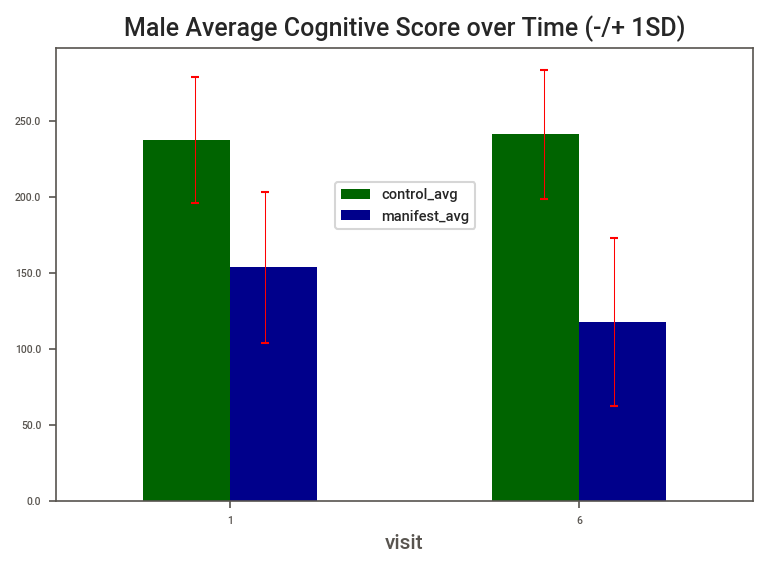

In [97]:
avg = pd.Series(ctl.mean().round(1), name='control_avg')
sd = pd.Series(np.std(ctl, ddof=1).round(1), name='control_std')
ctl_freq = pd.concat([avg, sd], axis=1)

avg = pd.Series(mnf.mean().round(1), name='manifest_avg')
sd = pd.Series(np.std(mnf, ddof=1).round(1), name='manifest_std')
mnf_freq = pd.concat([avg, sd], axis=1)

freq = pd.merge(ctl_freq, mnf_freq, left_index=True, right_index=True)
freq.loc[:, 'visit'] = np.array([1, 6]).astype(str)
display(freq)

avg = freq.drop(list(proj.get_columns_with_pattern(freq, 'std').columns), axis=1)
sd = freq.drop(list(proj.get_columns_with_pattern(freq, 'avg').columns), axis=1)
display(avg, sd)

cmap = {c:'darkgreen' if 'control' in c.lower() else 'darkblue' if 'manifest' in c.lower() else 'gray' for c in avg.columns}
fig, ax1 = plt.subplots(figsize=[6, 4], dpi=150)

proj.plot_errorbars(freq['visit'], freq['control_avg'], freq['control_std'], errbar_color='red', axis=ax1)
proj.plot_errorbars(freq['visit'], freq['manifest_avg'], freq['manifest_std'], errbar_color='red', axis=ax1, shift=True)
avg.plot(kind='bar', x='visit', color=cmap, ax=ax1)
proj.adjust_axis(ax1, plot_title="Male Average Cognitive Score over Time (-/+ 1SD)", title_size=12,
                 show_legend_at=[0.4, 0.6])

In [98]:
# female
ctl = proj.get_columns_with_pattern(female_control, 'cognitive_score_vis')
mnf = proj.get_columns_with_pattern(female_manifest, 'cognitive_score_vis')
display(ctl, mnf)
display(ctl.describe(), mnf.describe())

,cognitive_score_vis_1,cognitive_score_vis_6
28,319.0,299.0
29,274.0,272.0
33,243.0,251.0
42,240.0,239.0
52,259.0,275.0
...,...,...
1286,206.0,211.0
1294,269.0,237.0
1297,188.0,229.0
1299,336.0,358.0


,cognitive_score_vis_1,cognitive_score_vis_6
15,120.0,42.0
16,105.0,82.0
19,12.0,8.0
27,89.0,120.0
30,265.0,238.0
...,...,...
1293,92.0,81.0
1296,142.0,89.0
1298,194.0,177.0
1306,212.0,188.3


,cognitive_score_vis_1,cognitive_score_vis_6
count,205.00,205.0
mean,245.64,247.6
std,37.73,40.0
min,103.00,121.0
25%,223.00,225.0
50%,247.00,250.0
75%,270.00,274.0
max,336.00,358.0


,cognitive_score_vis_1,cognitive_score_vis_6
count,260.00,260.00
mean,145.27,110.92
std,54.01,56.50
min,0.00,0.00
25%,115.00,76.00
50%,145.00,100.50
75%,181.00,151.00
max,265.00,253.00


,control_avg,control_std,manifest_avg,manifest_std,visit
cognitive_score_vis_1,245.6,37.7,145.3,54.0,1
cognitive_score_vis_6,247.6,40.0,110.9,56.5,6


,control_avg,manifest_avg,visit
cognitive_score_vis_1,245.6,145.3,1
cognitive_score_vis_6,247.6,110.9,6


,control_std,manifest_std,visit
cognitive_score_vis_1,37.7,54.0,1
cognitive_score_vis_6,40.0,56.5,6


W:\MSc-AIDS-UoH\Trimester_3\Submit\project_methods.py:2125: UserWarning:

FixedFormatter should only be used together with FixedLocator



<AxesSubplot:title={'center':'Female Average Cognitive Score over Time (-/+ 1SD)'}, xlabel='visit'>

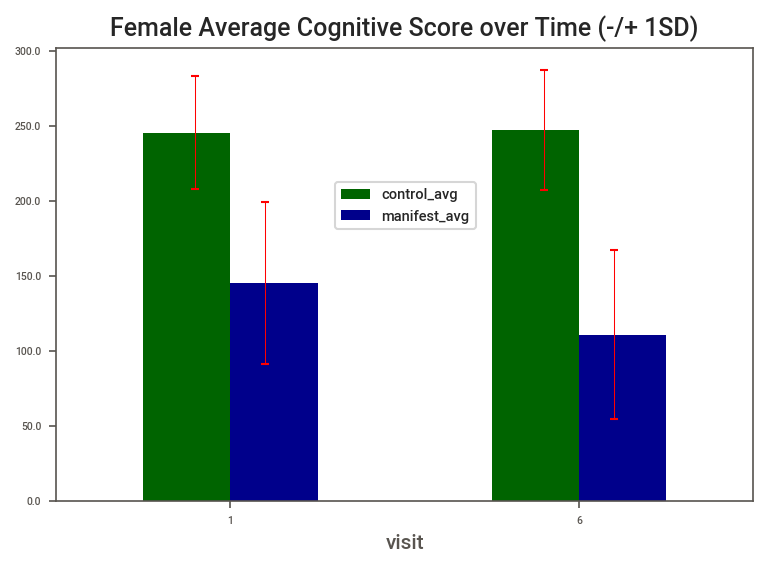

In [99]:
avg = pd.Series(ctl.mean().round(1), name='control_avg')
sd = pd.Series(np.std(ctl, ddof=1).round(1), name='control_std')
ctl_freq = pd.concat([avg, sd], axis=1)

avg = pd.Series(mnf.mean().round(1), name='manifest_avg')
sd = pd.Series(np.std(mnf, ddof=1).round(1), name='manifest_std')
mnf_freq = pd.concat([avg, sd], axis=1)

freq = pd.merge(ctl_freq, mnf_freq, left_index=True, right_index=True)
freq.loc[:, 'visit'] = np.array([1, 6]).astype(str)
display(freq)

avg = freq.drop(list(proj.get_columns_with_pattern(freq, 'std').columns), axis=1)
sd = freq.drop(list(proj.get_columns_with_pattern(freq, 'avg').columns), axis=1)
display(avg, sd)

cmap = {c:'darkgreen' if 'control' in c.lower() else 'darkblue' if 'manifest' in c.lower() else 'gray' for c in avg.columns}
fig, ax1 = plt.subplots(figsize=[6, 4], dpi=150)

proj.plot_errorbars(freq['visit'], freq['control_avg'], freq['control_std'], errbar_color='red', axis=ax1)
proj.plot_errorbars(freq['visit'], freq['manifest_avg'], freq['manifest_std'], errbar_color='red', axis=ax1, shift=True)
avg.plot(kind='bar', x='visit', color=cmap, ax=ax1)
proj.adjust_axis(ax1, plot_title="Female Average Cognitive Score over Time (-/+ 1SD)", title_size=12,
                 show_legend_at=[0.4, 0.6])

#### CAG repeat extensions

In [100]:
# cag repeat
rp = proj.get_columns_with_pattern(redpen, 'cognitive_score_vis')
fp = proj.get_columns_with_pattern(fulpen, 'cognitive_score_vis')
display(rp, fp)
display(rp.describe(), fp.describe())

,cognitive_score_vis_1,cognitive_score_vis_6
0,288.0,282.0
1,190.0,165.0
2,207.0,206.0
3,164.0,122.0
4,165.0,146.0
5,206.0,202.0
6,4.0,0.0
7,186.0,162.0
8,126.0,106.0
9,168.0,176.0


,cognitive_score_vis_1,cognitive_score_vis_6
0,120.0,35.0
1,178.0,149.0
2,264.0,264.0
3,108.0,36.0
4,183.0,150.0
...,...,...
524,150.0,103.0
525,106.0,70.0
526,212.0,188.3
527,213.0,221.0


,cognitive_score_vis_1,cognitive_score_vis_6
count,17.00,17.00
mean,167.06,155.41
std,65.70,72.36
min,4.00,0.00
25%,126.00,106.00
50%,186.00,165.00
75%,206.00,202.00
max,288.00,282.00


,cognitive_score_vis_1,cognitive_score_vis_6
count,529.00,529.00
mean,149.18,113.22
std,51.39,55.03
min,0.00,0.00
25%,117.00,76.00
50%,147.00,105.00
75%,182.00,149.00
max,308.00,307.00


,reduced_penetrance_avg,reduced_penetrance_std,full_penetrance_avg,full_penetrance_std,visit
cognitive_score_vis_1,167.1,65.7,149.2,51.4,1
cognitive_score_vis_6,155.4,72.4,113.2,55.0,6


,reduced_penetrance_avg,full_penetrance_avg,visit
cognitive_score_vis_1,167.1,149.2,1
cognitive_score_vis_6,155.4,113.2,6


,reduced_penetrance_std,full_penetrance_std,visit
cognitive_score_vis_1,65.7,51.4,1
cognitive_score_vis_6,72.4,55.0,6


W:\MSc-AIDS-UoH\Trimester_3\Submit\project_methods.py:2125: UserWarning:

FixedFormatter should only be used together with FixedLocator



<AxesSubplot:title={'center':'Reduced Vs. Full Penetrance Average Cognitive Score\n over Time (-/+ 1SD)'}, xlabel='visit'>

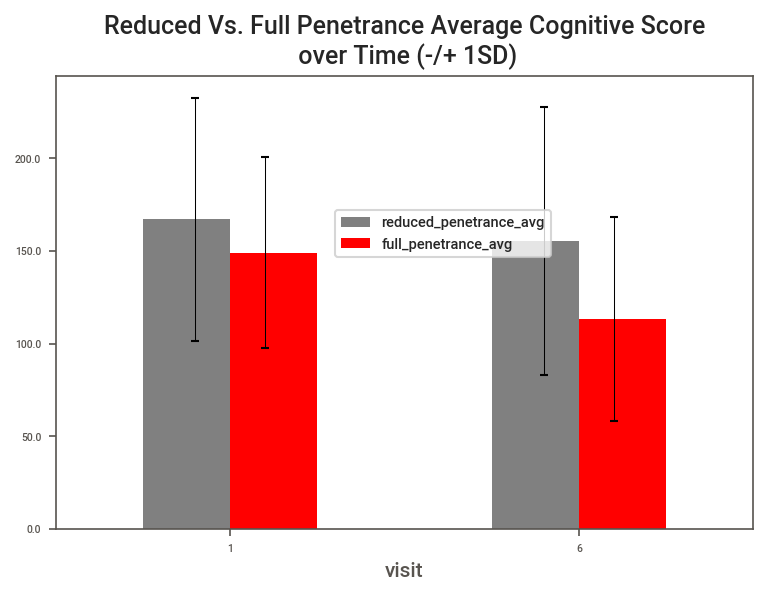

In [101]:
avg = pd.Series(rp.mean().round(1), name='reduced_penetrance_avg')
sd = pd.Series(np.std(rp, ddof=1).round(1), name='reduced_penetrance_std')
rp_freq = pd.concat([avg, sd], axis=1)

avg = pd.Series(fp.mean().round(1), name='full_penetrance_avg')
sd = pd.Series(np.std(fp, ddof=1).round(1), name='full_penetrance_std')
fp_freq = pd.concat([avg, sd], axis=1)

freq = pd.merge(rp_freq, fp_freq, left_index=True, right_index=True)
freq.loc[:, 'visit'] = np.array([1, 6]).astype(str)
display(freq)

avg = freq.drop(list(proj.get_columns_with_pattern(freq, 'std').columns), axis=1)
sd = freq.drop(list(proj.get_columns_with_pattern(freq, 'avg').columns), axis=1)
display(avg, sd)

cmap = {c:'gray' if 'reduced_penetrance' in c.lower() else 'red' if 'full_penetrance' in c.lower() else 'gray' for c in avg.columns}
fig, ax1 = plt.subplots(figsize=[6, 4], dpi=150)

proj.plot_errorbars(freq['visit'], freq['reduced_penetrance_avg'], freq['reduced_penetrance_std'], axis=ax1)
proj.plot_errorbars(freq['visit'], freq['full_penetrance_avg'], freq['full_penetrance_std'], axis=ax1, shift=True)
avg.plot(kind='bar', x='visit', color=cmap, ax=ax1)
proj.adjust_axis(ax1, plot_title="Reduced Vs. Full Penetrance Average Cognitive Score\n over Time (-/+ 1SD)", title_size=12,
                 show_legend_at=[0.4, 0.6])

### BMI & Cognitive Score

In [102]:
# baseline
cols = ['bmi_level_vis_6', 'cognitive_score_vis_1',]
ctl = proj.get_columns_with_pattern(control, cols)
mnf = proj.get_columns_with_pattern(manifest, cols)
display(ctl, mnf)
display(ctl.describe(include='all'), mnf.describe(include='all'))

ctl_avg = ctl.groupby(cols[0]).mean().round(1).rename(columns={cols[-1]:'control_avg'})
ctl_std = ctl.groupby(cols[0]).std().round(1).rename(columns={cols[-1]:'control_std'})
ctl = pd.merge(ctl_avg, ctl_std, left_index=True, right_index=True)

mnf_avg = mnf.groupby(cols[0]).mean().round(1).rename(columns={cols[-1]:'manifest_avg'})
mnf_std = mnf.groupby(cols[0]).std().round(1).rename(columns={cols[-1]:'manifest_std'})
mnf = pd.merge(mnf_avg, mnf_std, left_index=True, right_index=True)

v1 = pd.merge(ctl, mnf, left_index=True, right_index=True)
display(v1)

,bmi_level_vis_6,cognitive_score_vis_1
0,3. obese,274.0
1,3. obese,308.0
2,2. overweight,231.0
3,0. underweight,319.0
4,1. normal,274.0
...,...,...
315,2. overweight,180.0
316,1. normal,188.0
317,2. overweight,336.0
318,3. obese,235.0


,bmi_level_vis_6,cognitive_score_vis_1
0,0. underweight,120.0
1,1. normal,178.0
2,1. normal,264.0
3,1. normal,108.0
4,1. normal,183.0
...,...,...
541,2. overweight,150.0
542,2. overweight,106.0
543,3. obese,212.0
544,3. obese,213.0


,bmi_level_vis_6,cognitive_score_vis_1
count,320,320.00
unique,5,NaN
top,2. overweight,NaN
freq,103,NaN
mean,NaN,242.72
std,NaN,39.24
min,NaN,53.00
25%,NaN,219.75
50%,NaN,244.00
75%,NaN,266.00


,bmi_level_vis_6,cognitive_score_vis_1
count,546,546.00
unique,5,NaN
top,1. normal,NaN
freq,268,NaN
mean,NaN,149.73
std,NaN,51.91
min,NaN,0.00
25%,NaN,117.00
50%,NaN,148.00
75%,NaN,183.00


,control_avg,control_std,manifest_avg,manifest_std
bmi_level_vis_6,,,,
0. underweight,236.0,86.2,131.5,54.4
1. normal,250.3,33.7,151.9,51.8
2. overweight,245.8,37.5,147.4,52.1
3. obese,236.4,43.2,153.3,49.1
4. severely obese,232.5,37.4,153.8,64.0


In [103]:
# visit 6
cols = ['bmi_level_vis_6', 'cognitive_score_vis_6',]
ctl = proj.get_columns_with_pattern(control, cols)
mnf = proj.get_columns_with_pattern(manifest, cols)
display(ctl, mnf)
display(ctl.describe(include='all'), mnf.describe(include='all'))

ctl_avg = ctl.groupby(cols[0]).mean().round(1).rename(columns={cols[-1]:'control_avg'})
ctl_std = ctl.groupby(cols[0]).std().round(1).rename(columns={cols[-1]:'control_std'})
ctl = pd.merge(ctl_avg, ctl_std, left_index=True, right_index=True)

mnf_avg = mnf.groupby(cols[0]).mean().round(1).rename(columns={cols[-1]:'manifest_avg'})
mnf_std = mnf.groupby(cols[0]).std().round(1).rename(columns={cols[-1]:'manifest_std'})
mnf = pd.merge(mnf_avg, mnf_std, left_index=True, right_index=True)

v6 = pd.merge(ctl, mnf, left_index=True, right_index=True)
display(v6)

,bmi_level_vis_6,cognitive_score_vis_6
0,3. obese,231.0
1,3. obese,290.0
2,2. overweight,231.0
3,0. underweight,299.0
4,1. normal,272.0
...,...,...
315,2. overweight,249.0
316,1. normal,229.0
317,2. overweight,358.0
318,3. obese,221.0


,bmi_level_vis_6,cognitive_score_vis_6
0,0. underweight,35.0
1,1. normal,149.0
2,1. normal,264.0
3,1. normal,36.0
4,1. normal,150.0
...,...,...
541,2. overweight,103.0
542,2. overweight,70.0
543,3. obese,188.3
544,3. obese,221.0


,bmi_level_vis_6,cognitive_score_vis_6
count,320,320.00
unique,5,NaN
top,2. overweight,NaN
freq,103,NaN
mean,NaN,245.33
std,NaN,41.01
min,NaN,49.00
25%,NaN,221.00
50%,NaN,248.00
75%,NaN,272.00


,bmi_level_vis_6,cognitive_score_vis_6
count,546,546.00
unique,5,NaN
top,1. normal,NaN
freq,268,NaN
mean,NaN,114.53
std,NaN,56.04
min,NaN,0.00
25%,NaN,77.00
50%,NaN,106.50
75%,NaN,150.75


,control_avg,control_std,manifest_avg,manifest_std
bmi_level_vis_6,,,,
0. underweight,227.3,80.6,86.5,56.0
1. normal,255.1,33.8,114.3,57.3
2. overweight,249.6,38.9,113.9,54.1
3. obese,237.5,45.2,124.1,51.0
4. severely obese,231.0,40.7,136.6,69.8


W:\MSc-AIDS-UoH\Trimester_3\Submit\project_methods.py:2125: UserWarning:

FixedFormatter should only be used together with FixedLocator

W:\MSc-AIDS-UoH\Trimester_3\Submit\project_methods.py:2125: UserWarning:

FixedFormatter should only be used together with FixedLocator



<AxesSubplot:title={'center':'Average Cognitive Score\n & Sixth BMI (+/- 1SD)'}, xlabel=' ', ylabel='Mean Cognitive score'>

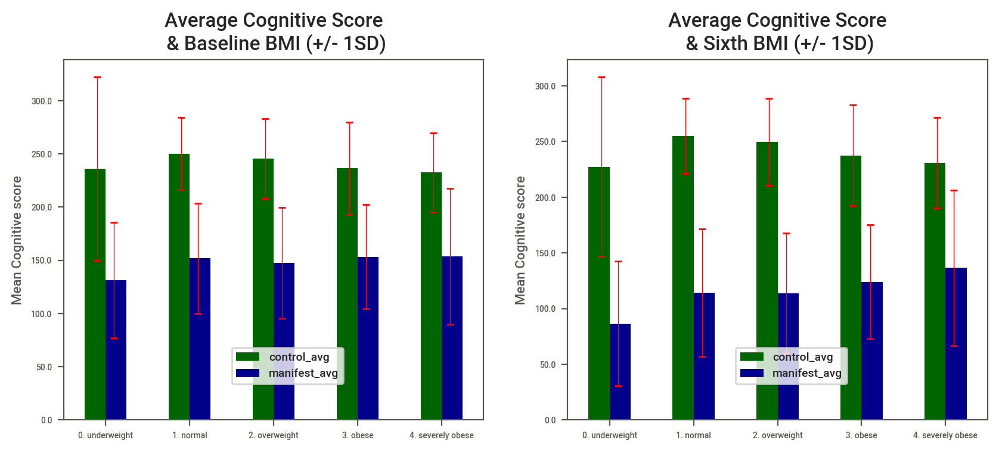

In [104]:
cmap = {c:'darkgreen' if 'control' in c.lower() else 'darkblue' if 'manifest' in c.lower() else 'gray' for c in v1.columns}
fig, (l, r) = plt.subplots(1, 2, figsize=[10, 4], dpi=200)

# visit 1
v1.loc[:, ['control_avg', 'manifest_avg']].plot(kind='bar', color=cmap, ax=l)
proj.adjust_axis(l, plot_title="Average Cognitive Score\n & Baseline BMI (+/- 1SD)", x_labe=' ', y_labe='Mean Cognitive score', 
                show_legend_at=[0.4, 0.1])
proj.plot_errorbars(x=v1.index, y=v1['control_avg'], yerror=v1['control_std'], errbar_color='red', axis=l)
proj.plot_errorbars(x=v1.index, y=v1['manifest_avg'], yerror=v1['manifest_std'], errbar_color='red', axis=l, shift=True)

# visit 6
v6.loc[:, ['control_avg', 'manifest_avg']].plot(kind='bar', color=cmap, ax=r)
proj.adjust_axis(r, plot_title="Average Cognitive Score\n & Sixth BMI (+/- 1SD)", x_labe=' ',  y_labe='Mean Cognitive score', 
                show_legend_at=[0.4, 0.1])
proj.plot_errorbars(x=v6.index, y=v6['control_avg'], yerror=v6['control_std'], errbar_color='red', axis=r)
proj.plot_errorbars(x=v6.index, y=v6['manifest_avg'], yerror=v6['manifest_std'], errbar_color='red', axis=r, shift=True)

#### BMI change: Increase Vs. Decrease

In [105]:
# baseline
cols = ['v1v6_bmi_change', 'cognitive_score_vis_1',]
ctl = proj.get_columns_with_pattern(control, cols)
mnf = proj.get_columns_with_pattern(manifest, cols)
display(ctl, mnf)
display(ctl.describe(include='all'), mnf.describe(include='all'))

ctl_avg = ctl.groupby(cols[0]).mean().round(1).rename(columns={cols[-1]:'control_avg'})
ctl_std = ctl.groupby(cols[0]).std().round(1).rename(columns={cols[-1]:'control_std'})
ctl = pd.merge(ctl_avg, ctl_std, left_index=True, right_index=True)

mnf_avg = mnf.groupby(cols[0]).mean().round(1).rename(columns={cols[-1]:'manifest_avg'})
mnf_std = mnf.groupby(cols[0]).std().round(1).rename(columns={cols[-1]:'manifest_std'})
mnf = pd.merge(mnf_avg, mnf_std, left_index=True, right_index=True)

v1 = pd.merge(ctl, mnf, left_index=True, right_index=True)
display(v1)

,v1v6_bmi_change,cognitive_score_vis_1
0,1. increase,274.0
1,1. increase,308.0
2,1. increase,231.0
3,-1. decrease,319.0
4,1. increase,274.0
...,...,...
315,1. increase,180.0
316,1. increase,188.0
317,1. increase,336.0
318,1. increase,235.0


,v1v6_bmi_change,cognitive_score_vis_1
0,-1. decrease,120.0
1,-1. decrease,178.0
2,1. increase,264.0
3,-1. decrease,108.0
4,-1. decrease,183.0
...,...,...
541,1. increase,150.0
542,-1. decrease,106.0
543,0. no change,212.0
544,1. increase,213.0


,v1v6_bmi_change,cognitive_score_vis_1
count,320,320.00
unique,3,NaN
top,1. increase,NaN
freq,173,NaN
mean,NaN,242.72
std,NaN,39.24
min,NaN,53.00
25%,NaN,219.75
50%,NaN,244.00
75%,NaN,266.00


,v1v6_bmi_change,cognitive_score_vis_1
count,546,546.00
unique,3,NaN
top,-1. decrease,NaN
freq,279,NaN
mean,NaN,149.73
std,NaN,51.91
min,NaN,0.00
25%,NaN,117.00
50%,NaN,148.00
75%,NaN,183.00


,control_avg,control_std,manifest_avg,manifest_std
v1v6_bmi_change,,,,
-1. decrease,241.1,41.3,149.9,50.1
0. no change,250.1,42.3,138.6,63.7
1. increase,243.1,37.4,151.4,51.9


In [106]:
# visit 6
cols = ['v1v6_bmi_change', 'cognitive_score_vis_6',]
ctl = proj.get_columns_with_pattern(control, cols)
mnf = proj.get_columns_with_pattern(manifest, cols)
display(ctl, mnf)
display(ctl.describe(include='all'), mnf.describe(include='all'))

ctl_avg = ctl.groupby(cols[0]).mean().round(1).rename(columns={cols[-1]:'control_avg'})
ctl_std = ctl.groupby(cols[0]).std().round(1).rename(columns={cols[-1]:'control_std'})
ctl = pd.merge(ctl_avg, ctl_std, left_index=True, right_index=True)

mnf_avg = mnf.groupby(cols[0]).mean().round(1).rename(columns={cols[-1]:'manifest_avg'})
mnf_std = mnf.groupby(cols[0]).std().round(1).rename(columns={cols[-1]:'manifest_std'})
mnf = pd.merge(mnf_avg, mnf_std, left_index=True, right_index=True)

v6 = pd.merge(ctl, mnf, left_index=True, right_index=True)
display(v6)

,v1v6_bmi_change,cognitive_score_vis_6
0,1. increase,231.0
1,1. increase,290.0
2,1. increase,231.0
3,-1. decrease,299.0
4,1. increase,272.0
...,...,...
315,1. increase,249.0
316,1. increase,229.0
317,1. increase,358.0
318,1. increase,221.0


,v1v6_bmi_change,cognitive_score_vis_6
0,-1. decrease,35.0
1,-1. decrease,149.0
2,1. increase,264.0
3,-1. decrease,36.0
4,-1. decrease,150.0
...,...,...
541,1. increase,103.0
542,-1. decrease,70.0
543,0. no change,188.3
544,1. increase,221.0


,v1v6_bmi_change,cognitive_score_vis_6
count,320,320.00
unique,3,NaN
top,1. increase,NaN
freq,173,NaN
mean,NaN,245.33
std,NaN,41.01
min,NaN,49.00
25%,NaN,221.00
50%,NaN,248.00
75%,NaN,272.00


,v1v6_bmi_change,cognitive_score_vis_6
count,546,546.00
unique,3,NaN
top,-1. decrease,NaN
freq,279,NaN
mean,NaN,114.53
std,NaN,56.04
min,NaN,0.00
25%,NaN,77.00
50%,NaN,106.50
75%,NaN,150.75


,control_avg,control_std,manifest_avg,manifest_std
v1v6_bmi_change,,,,
-1. decrease,245.1,43.6,114.9,56.0
0. no change,256.6,43.6,115.8,62.5
1. increase,244.3,38.7,113.8,55.2


W:\MSc-AIDS-UoH\Trimester_3\Submit\project_methods.py:2125: UserWarning:

FixedFormatter should only be used together with FixedLocator

W:\MSc-AIDS-UoH\Trimester_3\Submit\project_methods.py:2125: UserWarning:

FixedFormatter should only be used together with FixedLocator



<AxesSubplot:title={'center':'Average Cognitive\n Score & Sixth BMI Changge'}, xlabel=' ', ylabel='Mean Cognitive score'>

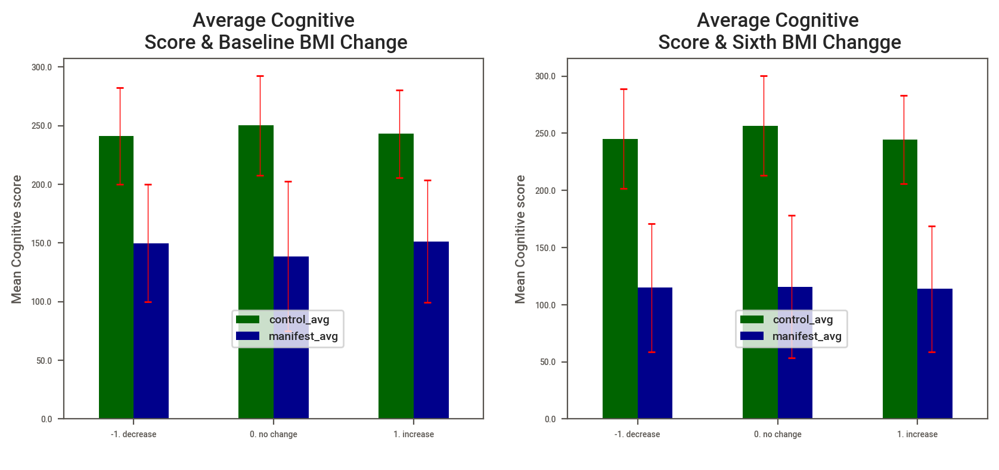

In [107]:
cmap = {c:'darkgreen' if 'control' in c.lower() else 'darkblue' if 'manifest' in c.lower() else 'gray' for c in v1.columns}
fig, (l, r) = plt.subplots(1, 2, figsize=[10, 4], dpi=200)

# visit 1
v1.loc[:, ['control_avg', 'manifest_avg']].plot(kind='bar', color=cmap, ax=l)
proj.adjust_axis(l, plot_title="Average Cognitive\n Score & Baseline BMI Change", x_labe=' ', y_labe='Mean Cognitive score', 
                show_legend_at=[0.4, 0.2])
proj.plot_errorbars(x=v1.index, y=v1['control_avg'], yerror=v1['control_std'], errbar_color='red', axis=l)
proj.plot_errorbars(x=v1.index, y=v1['manifest_avg'], yerror=v1['manifest_std'], errbar_color='red', axis=l, shift=True)

# visit 6
v6.loc[:, ['control_avg', 'manifest_avg']].plot(kind='bar', color=cmap, ax=r)
proj.adjust_axis(r, plot_title="Average Cognitive\n Score & Sixth BMI Changge", x_labe=' ',  y_labe='Mean Cognitive score', 
                show_legend_at=[0.4, 0.2])
proj.plot_errorbars(x=v6.index, y=v6['control_avg'], yerror=v6['control_std'], errbar_color='red', axis=r)
proj.plot_errorbars(x=v6.index, y=v6['manifest_avg'], yerror=v6['manifest_std'], errbar_color='red', axis=r, shift=True)

### Chorea Score 

{'lower_limit': -15.0,
 'upper_limit': 25.0,
 'n_outliers': 8,
 'outliers': 1305    26.0
 1306    26.0
 1307    27.0
 1308    27.0
 1309    28.0
 1310    28.0
 1311    28.0
 1312    28.0
 dtype: float64}

W:\MSc-AIDS-UoH\Trimester_3\Submit\project_methods.py:2336: UserWarning:

FixedFormatter should only be used together with FixedLocator

No handles with labels found to put in legend.


<AxesSubplot:title={'center':'Statistical Spread of Chorea Score'}>

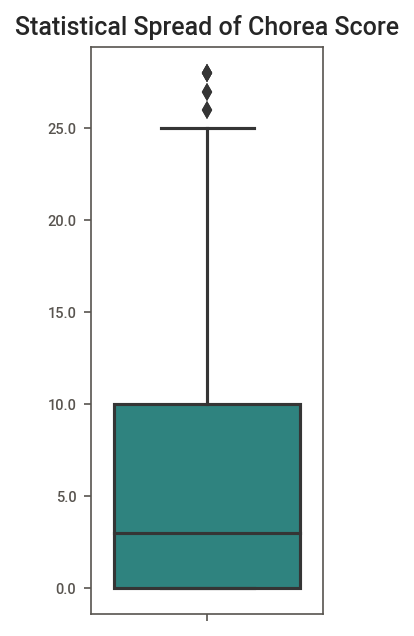

In [108]:
display(proj.outlier_detection_iqr(first6_vis['chorea_score_vis_6'], precision=1))

fig, ax1 = plt.subplots(figsize=[2, 5], dpi=150)
proj.plot_box(y=first6_vis['chorea_score_vis_6'], plot_title="Statistical Spread of Chorea Score",
             axis=ax1)

#### chorea_score

In [109]:
ctl = proj.get_columns_with_pattern(control, 'chorea_score_vis')
mnf = proj.get_columns_with_pattern(manifest, 'chorea_score_vis')
display(ctl, mnf)
display(ctl.describe(), mnf.describe())

,chorea_score_vis_1,chorea_score_vis_6
0,0.0,0.0
1,0.0,0.0
2,0.0,0.0
3,0.0,0.0
4,0.0,0.0
...,...,...
315,0.0,0.0
316,0.0,0.0
317,0.0,0.0
318,0.0,0.0


,chorea_score_vis_1,chorea_score_vis_6
0,11.0,28.0
1,8.0,7.0
2,3.0,4.0
3,5.0,4.0
4,7.0,6.0
...,...,...
541,7.0,7.0
542,2.0,1.0
543,11.0,11.0
544,13.0,1.0


,chorea_score_vis_1,chorea_score_vis_6
count,320.00,320.00
mean,0.10,0.03
std,0.62,0.21
min,0.00,0.00
25%,0.00,0.00
50%,0.00,0.00
75%,0.00,0.00
max,8.00,2.50


,chorea_score_vis_1,chorea_score_vis_6
count,546.00,546.00
mean,8.47,9.90
std,4.91,5.76
min,0.00,0.00
25%,5.00,6.00
50%,8.00,10.00
75%,12.00,13.00
max,28.00,28.00


,control_avg,control_std,manifest_avg,manifest_std,visit
chorea_score_vis_1,0.1,0.6,8.5,4.9,1
chorea_score_vis_6,0.0,0.2,9.9,5.8,6


,control_avg,manifest_avg,visit
chorea_score_vis_1,0.1,8.5,1
chorea_score_vis_6,0.0,9.9,6


,control_std,manifest_std,visit
chorea_score_vis_1,0.6,4.9,1
chorea_score_vis_6,0.2,5.8,6


W:\MSc-AIDS-UoH\Trimester_3\Submit\project_methods.py:2125: UserWarning:

FixedFormatter should only be used together with FixedLocator



<AxesSubplot:title={'center':'Average Chorea Score over Time (-/+ 1SD)'}, xlabel='visit'>

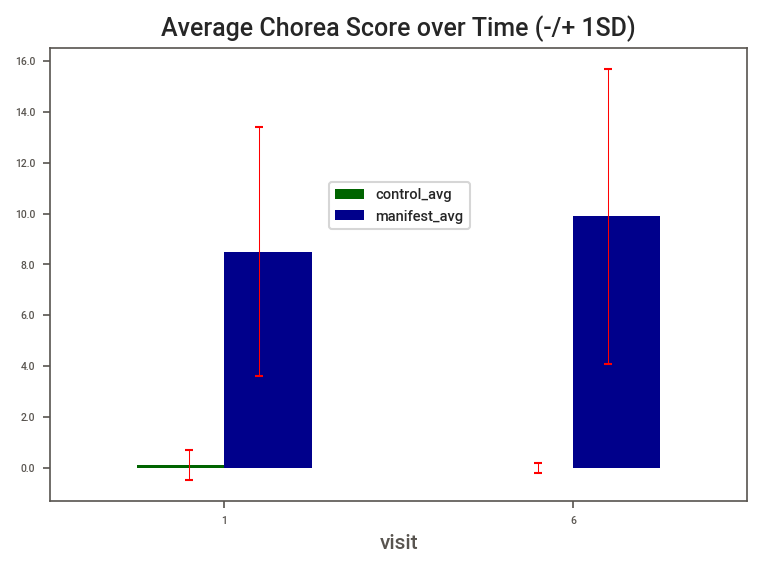

In [110]:
avg = pd.Series(ctl.mean().round(1), name='control_avg')
sd = pd.Series(np.std(ctl, ddof=1).round(1),
               name='control_std')
ctl_freq = pd.concat([avg, sd], axis=1)

avg = pd.Series(mnf.mean().round(1), name='manifest_avg')
sd = pd.Series(np.std(mnf,  ddof=1).round(1), name='manifest_std')
mnf_freq = pd.concat([avg, sd], axis=1)
freq = pd.merge(ctl_freq, mnf_freq, left_index=True, right_index=True)
freq.loc[:, 'visit'] = np.array([1, 6]).astype(str)
display(freq)

avg = freq.drop(list(proj.get_columns_with_pattern(freq, 'std').columns), axis=1)
sd = freq.drop(list(proj.get_columns_with_pattern(freq, 'avg').columns), axis=1)
display(avg, sd)

cmap = {c:'darkgreen' if 'control' in c.lower() else 'darkblue' if 'manifest' in c.lower() else 'gray' for c in avg.columns}
fig, ax1 = plt.subplots(figsize=[6, 4], dpi=150)

proj.plot_errorbars(freq['visit'], freq['control_avg'], freq['control_std'], errbar_color='red', axis=ax1)
proj.plot_errorbars(freq['visit'], freq['manifest_avg'], freq['manifest_std'], errbar_color='red', axis=ax1, shift=True)
avg.plot(kind='bar', x='visit', color=cmap, ax=ax1)
proj.adjust_axis(ax1, plot_title="Average Chorea Score over Time (-/+ 1SD)", title_size=12,
                 show_legend_at=[0.4, 0.6])

#### Gender

In [111]:
# male
ctl = proj.get_columns_with_pattern(male_control, 'chorea_score_vis')
mnf = proj.get_columns_with_pattern(male_manifest, 'chorea_score_vis')
display(ctl, mnf)
display(ctl.describe(), mnf.describe())

,chorea_score_vis_1,chorea_score_vis_6
7,0.0,0.0
20,0.0,0.0
24,0.0,0.0
36,0.0,0.0
45,0.0,1.0
...,...,...
1243,0.0,0.0
1258,0.0,0.0
1292,0.0,0.0
1295,0.0,0.0


,chorea_score_vis_1,chorea_score_vis_6
0,11.0,28.0
1,8.0,7.0
3,3.0,4.0
4,5.0,4.0
8,7.0,6.0
...,...,...
1289,14.0,5.0
1290,22.0,9.0
1300,7.0,7.0
1303,2.0,1.0


,chorea_score_vis_1,chorea_score_vis_6
count,115.00,115.00
mean,0.12,0.05
std,0.82,0.28
min,0.00,0.00
25%,0.00,0.00
50%,0.00,0.00
75%,0.00,0.00
max,8.00,2.50


,chorea_score_vis_1,chorea_score_vis_6
count,286.00,286.00
mean,8.39,9.68
std,4.84,5.50
min,0.00,0.00
25%,5.00,6.00
50%,8.00,9.00
75%,12.00,13.00
max,22.00,28.00


,control_avg,control_std,manifest_avg,manifest_std,visit
chorea_score_vis_1,0.1,0.8,8.4,4.8,1
chorea_score_vis_6,0.0,0.3,9.7,5.5,6


,control_avg,manifest_avg,visit
chorea_score_vis_1,0.1,8.4,1
chorea_score_vis_6,0.0,9.7,6


,control_std,manifest_std,visit
chorea_score_vis_1,0.8,4.8,1
chorea_score_vis_6,0.3,5.5,6


W:\MSc-AIDS-UoH\Trimester_3\Submit\project_methods.py:2125: UserWarning:

FixedFormatter should only be used together with FixedLocator



<AxesSubplot:title={'center':'Male Average Chorea Score over Time (-/+ 1SD)'}, xlabel='visit'>

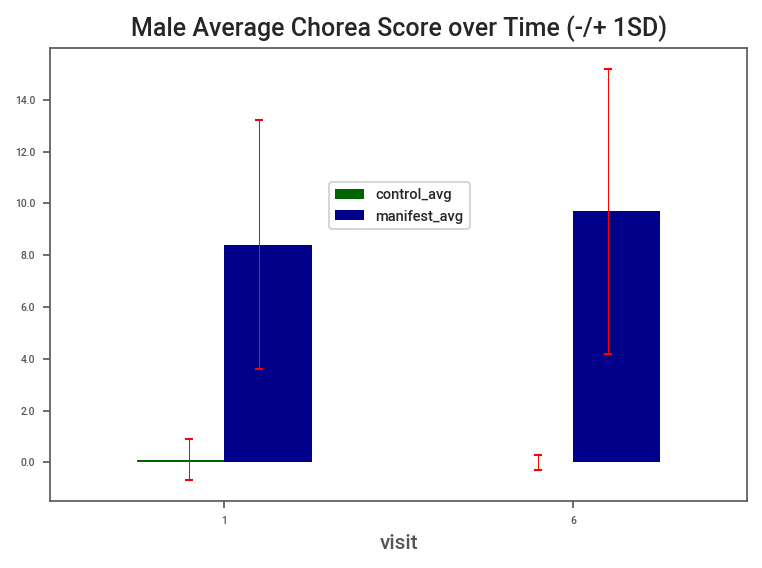

In [112]:
avg = pd.Series(ctl.mean().round(1), name='control_avg')
sd = pd.Series(np.std(ctl, ddof=1).round(1), name='control_std')
ctl_freq = pd.concat([avg, sd], axis=1)

avg = pd.Series(mnf.mean().round(1), name='manifest_avg')
sd = pd.Series(np.std(mnf, ddof=1).round(1), name='manifest_std')
mnf_freq = pd.concat([avg, sd], axis=1)

freq = pd.merge(ctl_freq, mnf_freq, left_index=True, right_index=True)
freq.loc[:, 'visit'] = np.array([1, 6]).astype(str)
display(freq)

avg = freq.drop(list(proj.get_columns_with_pattern(freq, 'std').columns), axis=1)
sd = freq.drop(list(proj.get_columns_with_pattern(freq, 'avg').columns), axis=1)
display(avg, sd)

cmap = {c:'darkgreen' if 'control' in c.lower() else 'darkblue' if 'manifest' in c.lower() else 'gray' for c in avg.columns}
fig, ax1 = plt.subplots(figsize=[6, 4], dpi=150)

proj.plot_errorbars(freq['visit'], freq['control_avg'], freq['control_std'], errbar_color='red', axis=ax1)
proj.plot_errorbars(freq['visit'], freq['manifest_avg'], freq['manifest_std'], errbar_color='red', axis=ax1, shift=True)
avg.plot(kind='bar', x='visit', color=cmap, ax=ax1)
proj.adjust_axis(ax1, plot_title="Male Average Chorea Score over Time (-/+ 1SD)", title_size=12,
                 show_legend_at=[0.4, 0.6])

In [113]:
# female
ctl = proj.get_columns_with_pattern(female_control, 'chorea_score_vis')
mnf = proj.get_columns_with_pattern(female_manifest, 'chorea_score_vis')
display(ctl, mnf)
display(ctl.describe(), mnf.describe())

,chorea_score_vis_1,chorea_score_vis_6
28,0.0,0.0
29,0.0,0.0
33,0.0,0.0
42,0.0,0.0
52,0.0,0.0
...,...,...
1286,0.0,0.0
1294,0.0,0.0
1297,0.0,0.0
1299,0.0,0.0


,chorea_score_vis_1,chorea_score_vis_6
15,15.0,19.0
16,14.0,7.0
19,9.0,20.0
27,12.0,9.0
30,0.0,0.0
...,...,...
1293,7.0,23.0
1296,5.0,2.0
1298,10.0,16.0
1306,11.0,11.0


,chorea_score_vis_1,chorea_score_vis_6
count,205.00,205.00
mean,0.09,0.01
std,0.48,0.16
min,0.00,0.00
25%,0.00,0.00
50%,0.00,0.00
75%,0.00,0.00
max,5.00,2.00


,chorea_score_vis_1,chorea_score_vis_6
count,260.00,260.00
mean,8.55,10.13
std,4.99,6.04
min,0.00,0.00
25%,5.00,6.00
50%,8.00,10.00
75%,12.00,13.00
max,28.00,28.00


,control_avg,control_std,manifest_avg,manifest_std,visit
chorea_score_vis_1,0.1,0.5,8.6,5.0,1
chorea_score_vis_6,0.0,0.2,10.1,6.0,6


,control_avg,manifest_avg,visit
chorea_score_vis_1,0.1,8.6,1
chorea_score_vis_6,0.0,10.1,6


,control_std,manifest_std,visit
chorea_score_vis_1,0.5,5.0,1
chorea_score_vis_6,0.2,6.0,6


W:\MSc-AIDS-UoH\Trimester_3\Submit\project_methods.py:2125: UserWarning:

FixedFormatter should only be used together with FixedLocator



<AxesSubplot:title={'center':'Female Average Chorea Score over Time (-/+ 1SD)'}, xlabel='visit'>

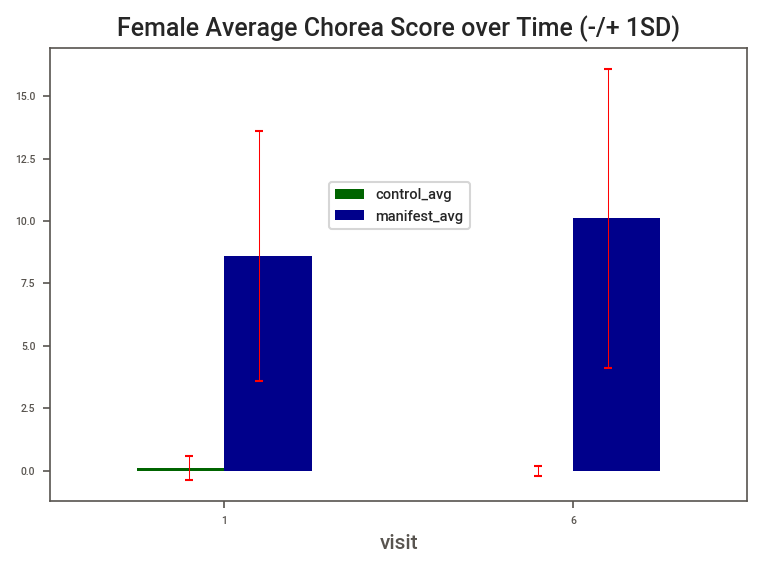

In [114]:
avg = pd.Series(ctl.mean().round(1), name='control_avg')
sd = pd.Series(np.std(ctl, ddof=1).round(1), name='control_std')
ctl_freq = pd.concat([avg, sd], axis=1)

avg = pd.Series(mnf.mean().round(1), name='manifest_avg')
sd = pd.Series(np.std(mnf, ddof=1).round(1), name='manifest_std')
mnf_freq = pd.concat([avg, sd], axis=1)

freq = pd.merge(ctl_freq, mnf_freq, left_index=True, right_index=True)
freq.loc[:, 'visit'] = np.array([1, 6]).astype(str)
display(freq)

avg = freq.drop(list(proj.get_columns_with_pattern(freq, 'std').columns), axis=1)
sd = freq.drop(list(proj.get_columns_with_pattern(freq, 'avg').columns), axis=1)
display(avg, sd)

cmap = {c:'darkgreen' if 'control' in c.lower() else 'darkblue' if 'manifest' in c.lower() else 'gray' for c in avg.columns}
fig, ax1 = plt.subplots(figsize=[6, 4], dpi=150)

proj.plot_errorbars(freq['visit'], freq['control_avg'], freq['control_std'], errbar_color='red', axis=ax1)
proj.plot_errorbars(freq['visit'], freq['manifest_avg'], freq['manifest_std'], errbar_color='red', axis=ax1, shift=True)
avg.plot(kind='bar', x='visit', color=cmap, ax=ax1)
proj.adjust_axis(ax1, plot_title="Female Average Chorea Score over Time (-/+ 1SD)", title_size=12,
                 show_legend_at=[0.4, 0.6])

#### CAG repeat extensions

In [115]:
# cag repeat
rp = proj.get_columns_with_pattern(redpen, 'chorea_score_vis')
fp = proj.get_columns_with_pattern(fulpen, 'chorea_score_vis')
display(rp, fp)
display(rp.describe(), fp.describe())

,chorea_score_vis_1,chorea_score_vis_6
0,1.0,3.0
1,13.0,19.0
2,2.0,2.0
3,12.0,18.0
4,21.0,13.0
5,14.0,7.0
6,2.0,3.0
7,4.0,10.0
8,9.0,18.0
9,9.0,11.0


,chorea_score_vis_1,chorea_score_vis_6
0,11.0,28.0
1,8.0,7.0
2,3.0,4.0
3,5.0,4.0
4,7.0,6.0
...,...,...
524,7.0,7.0
525,2.0,1.0
526,11.0,11.0
527,13.0,1.0


,chorea_score_vis_1,chorea_score_vis_6
count,17.00,17.00
mean,7.18,7.88
std,5.48,5.98
min,0.00,1.00
25%,4.00,3.00
50%,7.00,6.00
75%,9.00,11.00
max,21.00,19.00


,chorea_score_vis_1,chorea_score_vis_6
count,529.00,529.00
mean,8.51,9.96
std,4.89,5.75
min,0.00,0.00
25%,5.00,6.00
50%,8.00,10.00
75%,12.00,13.00
max,28.00,28.00


,reduced_penetrance_avg,reduced_penetrance_std,full_penetrance_avg,full_penetrance_std,visit
chorea_score_vis_1,7.2,5.5,8.5,4.9,1
chorea_score_vis_6,7.9,6.0,10.0,5.7,6


,reduced_penetrance_avg,full_penetrance_avg,visit
chorea_score_vis_1,7.2,8.5,1
chorea_score_vis_6,7.9,10.0,6


,reduced_penetrance_std,full_penetrance_std,visit
chorea_score_vis_1,5.5,4.9,1
chorea_score_vis_6,6.0,5.7,6


W:\MSc-AIDS-UoH\Trimester_3\Submit\project_methods.py:2125: UserWarning:

FixedFormatter should only be used together with FixedLocator



<AxesSubplot:title={'center':'Reduced Vs. Full Penetrance Average Chorea Score\n over Time (-/+ 1SD)'}, xlabel='visit'>

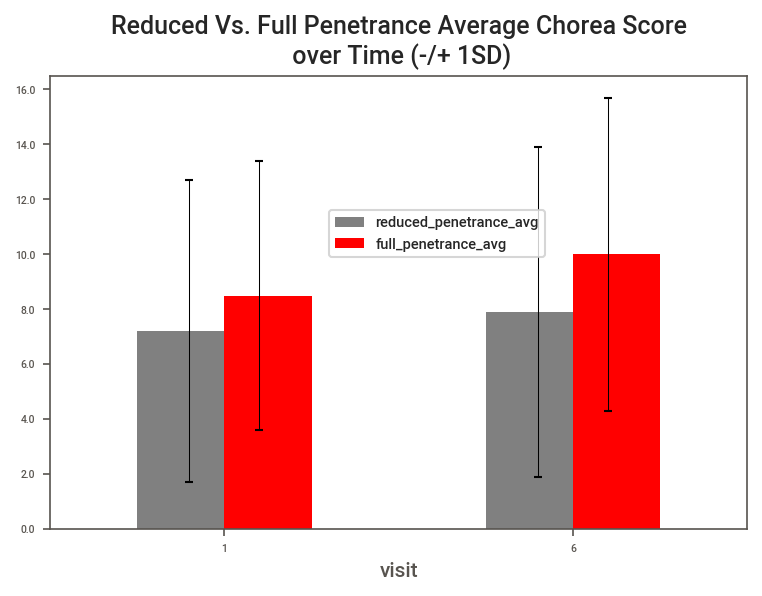

In [116]:
avg = pd.Series(rp.mean().round(1), name='reduced_penetrance_avg')
sd = pd.Series(np.std(rp, ddof=1).round(1), name='reduced_penetrance_std')
rp_freq = pd.concat([avg, sd], axis=1)

avg = pd.Series(fp.mean().round(1), name='full_penetrance_avg')
sd = pd.Series(np.std(fp, ddof=1).round(1), name='full_penetrance_std')
fp_freq = pd.concat([avg, sd], axis=1)

freq = pd.merge(rp_freq, fp_freq, left_index=True, right_index=True)
freq.loc[:, 'visit'] = np.array([1, 6]).astype(str)
display(freq)

avg = freq.drop(list(proj.get_columns_with_pattern(freq, 'std').columns), axis=1)
sd = freq.drop(list(proj.get_columns_with_pattern(freq, 'avg').columns), axis=1)
display(avg, sd)

cmap = {c:'gray' if 'reduced_penetrance' in c.lower() else 'red' if 'full_penetrance' in c.lower() else 'gray' for c in avg.columns}
fig, ax1 = plt.subplots(figsize=[6, 4], dpi=150)

proj.plot_errorbars(freq['visit'], freq['reduced_penetrance_avg'], freq['reduced_penetrance_std'], axis=ax1)
proj.plot_errorbars(freq['visit'], freq['full_penetrance_avg'], freq['full_penetrance_std'], axis=ax1, shift=True)
avg.plot(kind='bar', x='visit', color=cmap, ax=ax1)
proj.adjust_axis(ax1, plot_title="Reduced Vs. Full Penetrance Average Chorea Score\n over Time (-/+ 1SD)", title_size=12,
                 show_legend_at=[0.4, 0.6])

### BMI & Chorea Score

In [117]:
# baseline
cols = ['bmi_level_vis_6', 'chorea_score_vis_1',]
ctl = proj.get_columns_with_pattern(control, cols)
mnf = proj.get_columns_with_pattern(manifest, cols)
display(ctl, mnf)
display(ctl.describe(include='all'), mnf.describe(include='all'))

ctl_avg = ctl.groupby(cols[0]).mean().round(1).rename(columns={cols[-1]:'control_avg'})
ctl_std = ctl.groupby(cols[0]).std().round(1).rename(columns={cols[-1]:'control_std'})
ctl = pd.merge(ctl_avg, ctl_std, left_index=True, right_index=True)

mnf_avg = mnf.groupby(cols[0]).mean().round(1).rename(columns={cols[-1]:'manifest_avg'})
mnf_std = mnf.groupby(cols[0]).std().round(1).rename(columns={cols[-1]:'manifest_std'})
mnf = pd.merge(mnf_avg, mnf_std, left_index=True, right_index=True)

v1 = pd.merge(ctl, mnf, left_index=True, right_index=True)
display(v1)

,bmi_level_vis_6,chorea_score_vis_1
0,3. obese,0.0
1,3. obese,0.0
2,2. overweight,0.0
3,0. underweight,0.0
4,1. normal,0.0
...,...,...
315,2. overweight,0.0
316,1. normal,0.0
317,2. overweight,0.0
318,3. obese,0.0


,bmi_level_vis_6,chorea_score_vis_1
0,0. underweight,11.0
1,1. normal,8.0
2,1. normal,3.0
3,1. normal,5.0
4,1. normal,7.0
...,...,...
541,2. overweight,7.0
542,2. overweight,2.0
543,3. obese,11.0
544,3. obese,13.0


,bmi_level_vis_6,chorea_score_vis_1
count,320,320.00
unique,5,NaN
top,2. overweight,NaN
freq,103,NaN
mean,NaN,0.10
std,NaN,0.62
min,NaN,0.00
25%,NaN,0.00
50%,NaN,0.00
75%,NaN,0.00


,bmi_level_vis_6,chorea_score_vis_1
count,546,546.00
unique,5,NaN
top,1. normal,NaN
freq,268,NaN
mean,NaN,8.47
std,NaN,4.91
min,NaN,0.00
25%,NaN,5.00
50%,NaN,8.00
75%,NaN,12.00


,control_avg,control_std,manifest_avg,manifest_std
bmi_level_vis_6,,,,
0. underweight,0.0,0.0,10.3,5.7
1. normal,0.0,0.3,9.2,4.7
2. overweight,0.2,0.9,7.8,4.9
3. obese,0.1,0.6,7.0,4.8
4. severely obese,0.1,0.4,6.1,3.6


In [118]:
# visit 6
cols = ['bmi_level_vis_6', 'chorea_score_vis_6',]
ctl = proj.get_columns_with_pattern(control, cols)
mnf = proj.get_columns_with_pattern(manifest, cols)
display(ctl, mnf)
display(ctl.describe(include='all'), mnf.describe(include='all'))

ctl_avg = ctl.groupby(cols[0]).mean().round(1).rename(columns={cols[-1]:'control_avg'})
ctl_std = ctl.groupby(cols[0]).std().round(1).rename(columns={cols[-1]:'control_std'})
ctl = pd.merge(ctl_avg, ctl_std, left_index=True, right_index=True)

mnf_avg = mnf.groupby(cols[0]).mean().round(1).rename(columns={cols[-1]:'manifest_avg'})
mnf_std = mnf.groupby(cols[0]).std().round(1).rename(columns={cols[-1]:'manifest_std'})
mnf = pd.merge(mnf_avg, mnf_std, left_index=True, right_index=True)

v6 = pd.merge(ctl, mnf, left_index=True, right_index=True)
display(v6)

,bmi_level_vis_6,chorea_score_vis_6
0,3. obese,0.0
1,3. obese,0.0
2,2. overweight,0.0
3,0. underweight,0.0
4,1. normal,0.0
...,...,...
315,2. overweight,0.0
316,1. normal,0.0
317,2. overweight,0.0
318,3. obese,0.0


,bmi_level_vis_6,chorea_score_vis_6
0,0. underweight,28.0
1,1. normal,7.0
2,1. normal,4.0
3,1. normal,4.0
4,1. normal,6.0
...,...,...
541,2. overweight,7.0
542,2. overweight,1.0
543,3. obese,11.0
544,3. obese,1.0


,bmi_level_vis_6,chorea_score_vis_6
count,320,320.00
unique,5,NaN
top,2. overweight,NaN
freq,103,NaN
mean,NaN,0.03
std,NaN,0.21
min,NaN,0.00
25%,NaN,0.00
50%,NaN,0.00
75%,NaN,0.00


,bmi_level_vis_6,chorea_score_vis_6
count,546,546.00
unique,5,NaN
top,1. normal,NaN
freq,268,NaN
mean,NaN,9.90
std,NaN,5.76
min,NaN,0.00
25%,NaN,6.00
50%,NaN,10.00
75%,NaN,13.00


,control_avg,control_std,manifest_avg,manifest_std
bmi_level_vis_6,,,,
0. underweight,0.0,0.0,11.2,7.5
1. normal,0.0,0.2,10.6,5.9
2. overweight,0.0,0.3,9.3,5.6
3. obese,0.0,0.1,8.5,4.8
4. severely obese,0.0,0.0,7.4,3.7


W:\MSc-AIDS-UoH\Trimester_3\Submit\project_methods.py:2125: UserWarning:

FixedFormatter should only be used together with FixedLocator

W:\MSc-AIDS-UoH\Trimester_3\Submit\project_methods.py:2125: UserWarning:

FixedFormatter should only be used together with FixedLocator



<AxesSubplot:title={'center':'Average Chorea Score\n & Sixth BMI (+/- 1SD)'}, xlabel=' ', ylabel='Mean Chorea score'>

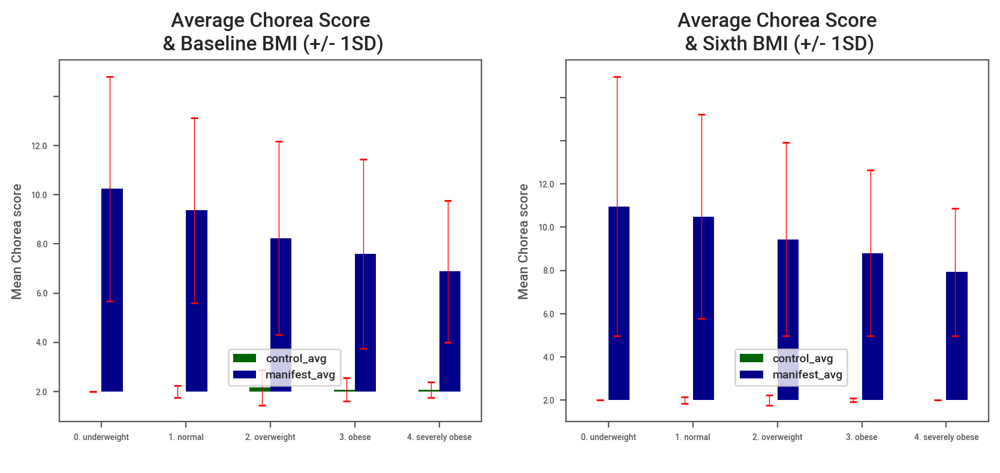

In [119]:
cmap = {c:'darkgreen' if 'control' in c.lower() else 'darkblue' if 'manifest' in c.lower() else 'gray' for c in v1.columns}
fig, (l, r) = plt.subplots(1, 2, figsize=[10, 4], dpi=200)

# visit 1
v1.loc[:, ['control_avg', 'manifest_avg']].plot(kind='bar', color=cmap, ax=l)
proj.adjust_axis(l, plot_title="Average Chorea Score\n & Baseline BMI (+/- 1SD)", x_labe=' ', y_labe='Mean Chorea score', 
                show_legend_at=[0.4, 0.1])
proj.plot_errorbars(x=v1.index, y=v1['control_avg'], yerror=v1['control_std'], errbar_color='red', axis=l)
proj.plot_errorbars(x=v1.index, y=v1['manifest_avg'], yerror=v1['manifest_std'], errbar_color='red', axis=l, shift=True)

# visit 6
v6.loc[:, ['control_avg', 'manifest_avg']].plot(kind='bar', color=cmap, ax=r)
proj.adjust_axis(r, plot_title="Average Chorea Score\n & Sixth BMI (+/- 1SD)", x_labe=' ',  y_labe='Mean Chorea score', 
                show_legend_at=[0.4, 0.1])
proj.plot_errorbars(x=v6.index, y=v6['control_avg'], yerror=v6['control_std'], errbar_color='red', axis=r)
proj.plot_errorbars(x=v6.index, y=v6['manifest_avg'], yerror=v6['manifest_std'], errbar_color='red', axis=r, shift=True)

#### BMI change: Increase Vs. Decrease

In [120]:
# baseline
cols = ['v1v6_bmi_change', 'chorea_score_vis_1',]
ctl = proj.get_columns_with_pattern(control, cols)
mnf = proj.get_columns_with_pattern(manifest, cols)
display(ctl, mnf)
display(ctl.describe(include='all'), mnf.describe(include='all'))

ctl_avg = ctl.groupby(cols[0]).mean().round(1).rename(columns={cols[-1]:'control_avg'})
ctl_std = ctl.groupby(cols[0]).std().round(1).rename(columns={cols[-1]:'control_std'})
ctl = pd.merge(ctl_avg, ctl_std, left_index=True, right_index=True)

mnf_avg = mnf.groupby(cols[0]).mean().round(1).rename(columns={cols[-1]:'manifest_avg'})
mnf_std = mnf.groupby(cols[0]).std().round(1).rename(columns={cols[-1]:'manifest_std'})
mnf = pd.merge(mnf_avg, mnf_std, left_index=True, right_index=True)

v1 = pd.merge(ctl, mnf, left_index=True, right_index=True)
display(v1)

,v1v6_bmi_change,chorea_score_vis_1
0,1. increase,0.0
1,1. increase,0.0
2,1. increase,0.0
3,-1. decrease,0.0
4,1. increase,0.0
...,...,...
315,1. increase,0.0
316,1. increase,0.0
317,1. increase,0.0
318,1. increase,0.0


,v1v6_bmi_change,chorea_score_vis_1
0,-1. decrease,11.0
1,-1. decrease,8.0
2,1. increase,3.0
3,-1. decrease,5.0
4,-1. decrease,7.0
...,...,...
541,1. increase,7.0
542,-1. decrease,2.0
543,0. no change,11.0
544,1. increase,13.0


,v1v6_bmi_change,chorea_score_vis_1
count,320,320.00
unique,3,NaN
top,1. increase,NaN
freq,173,NaN
mean,NaN,0.10
std,NaN,0.62
min,NaN,0.00
25%,NaN,0.00
50%,NaN,0.00
75%,NaN,0.00


,v1v6_bmi_change,chorea_score_vis_1
count,546,546.00
unique,3,NaN
top,-1. decrease,NaN
freq,279,NaN
mean,NaN,8.47
std,NaN,4.91
min,NaN,0.00
25%,NaN,5.00
50%,NaN,8.00
75%,NaN,12.00


,control_avg,control_std,manifest_avg,manifest_std
v1v6_bmi_change,,,,
-1. decrease,0.0,0.2,8.4,4.8
0. no change,0.4,1.8,9.7,6.1
1. increase,0.1,0.6,8.3,4.8


In [121]:
# visit 6
cols = ['v1v6_bmi_change', 'chorea_score_vis_6',]
ctl = proj.get_columns_with_pattern(control, cols)
mnf = proj.get_columns_with_pattern(manifest, cols)
display(ctl, mnf)
display(ctl.describe(include='all'), mnf.describe(include='all'))

ctl_avg = ctl.groupby(cols[0]).mean().round(1).rename(columns={cols[-1]:'control_avg'})
ctl_std = ctl.groupby(cols[0]).std().round(1).rename(columns={cols[-1]:'control_std'})
ctl = pd.merge(ctl_avg, ctl_std, left_index=True, right_index=True)

mnf_avg = mnf.groupby(cols[0]).mean().round(1).rename(columns={cols[-1]:'manifest_avg'})
mnf_std = mnf.groupby(cols[0]).std().round(1).rename(columns={cols[-1]:'manifest_std'})
mnf = pd.merge(mnf_avg, mnf_std, left_index=True, right_index=True)

v6 = pd.merge(ctl, mnf, left_index=True, right_index=True)
display(v6)

,v1v6_bmi_change,chorea_score_vis_6
0,1. increase,0.0
1,1. increase,0.0
2,1. increase,0.0
3,-1. decrease,0.0
4,1. increase,0.0
...,...,...
315,1. increase,0.0
316,1. increase,0.0
317,1. increase,0.0
318,1. increase,0.0


,v1v6_bmi_change,chorea_score_vis_6
0,-1. decrease,28.0
1,-1. decrease,7.0
2,1. increase,4.0
3,-1. decrease,4.0
4,-1. decrease,6.0
...,...,...
541,1. increase,7.0
542,-1. decrease,1.0
543,0. no change,11.0
544,1. increase,1.0


,v1v6_bmi_change,chorea_score_vis_6
count,320,320.00
unique,3,NaN
top,1. increase,NaN
freq,173,NaN
mean,NaN,0.03
std,NaN,0.21
min,NaN,0.00
25%,NaN,0.00
50%,NaN,0.00
75%,NaN,0.00


,v1v6_bmi_change,chorea_score_vis_6
count,546,546.00
unique,3,NaN
top,-1. decrease,NaN
freq,279,NaN
mean,NaN,9.90
std,NaN,5.76
min,NaN,0.00
25%,NaN,6.00
50%,NaN,10.00
75%,NaN,13.00


,control_avg,control_std,manifest_avg,manifest_std
v1v6_bmi_change,,,,
-1. decrease,0.0,0.2,10.3,6.1
0. no change,0.1,0.6,10.8,6.0
1. increase,0.0,0.1,9.2,5.3


W:\MSc-AIDS-UoH\Trimester_3\Submit\project_methods.py:2125: UserWarning:

FixedFormatter should only be used together with FixedLocator

W:\MSc-AIDS-UoH\Trimester_3\Submit\project_methods.py:2125: UserWarning:

FixedFormatter should only be used together with FixedLocator



<AxesSubplot:title={'center':'Average Chorea\n Score & Sixth BMI Changge'}, xlabel=' ', ylabel='Mean Chorea score'>

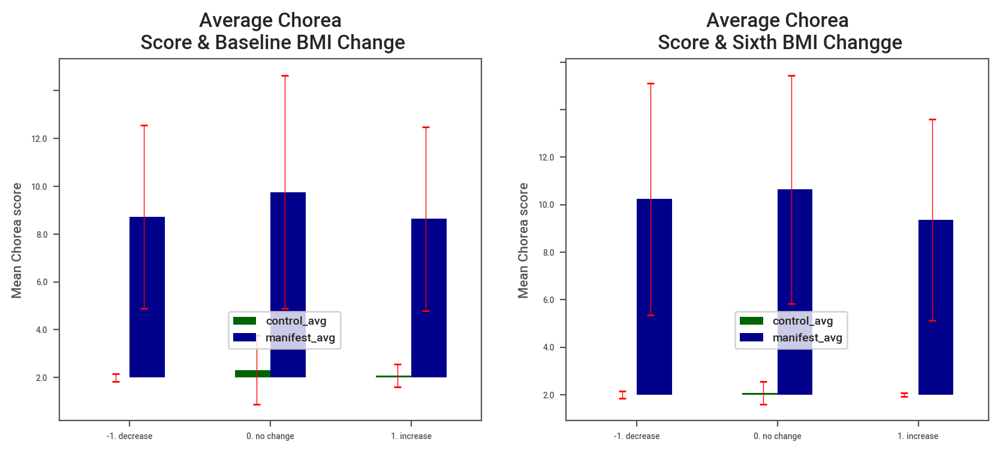

In [122]:
cmap = {c:'darkgreen' if 'control' in c.lower() else 'darkblue' if 'manifest' in c.lower() else 'gray' for c in v1.columns}
fig, (l, r) = plt.subplots(1, 2, figsize=[10, 4], dpi=200)

# visit 1
v1.loc[:, ['control_avg', 'manifest_avg']].plot(kind='bar', color=cmap, ax=l)
proj.adjust_axis(l, plot_title="Average Chorea\n Score & Baseline BMI Change", x_labe=' ', y_labe='Mean Chorea score', 
                show_legend_at=[0.4, 0.2])
proj.plot_errorbars(x=v1.index, y=v1['control_avg'], yerror=v1['control_std'], errbar_color='red', axis=l)
proj.plot_errorbars(x=v1.index, y=v1['manifest_avg'], yerror=v1['manifest_std'], errbar_color='red', axis=l, shift=True)

# visit 6
v6.loc[:, ['control_avg', 'manifest_avg']].plot(kind='bar', color=cmap, ax=r)
proj.adjust_axis(r, plot_title="Average Chorea\n Score & Sixth BMI Changge", x_labe=' ',  y_labe='Mean Chorea score', 
                show_legend_at=[0.4, 0.2])
proj.plot_errorbars(x=v6.index, y=v6['control_avg'], yerror=v6['control_std'], errbar_color='red', axis=r)
proj.plot_errorbars(x=v6.index, y=v6['manifest_avg'], yerror=v6['manifest_std'], errbar_color='red', axis=r, shift=True)

In [123]:
stopt

NameError: name 'stopt' is not defined